In [3]:
""" 
PROGRAM :  diagnostics_basics.ipynb 

reads in NO3 assimilation runs, historical simulations 
and raw forecasts under CMIP6 emissions 
to produce some basic diagnostics


STATUS  : Complete 
COMMENTS: (1) No adjusted forecast shown here
"""

' \nPROGRAM :  diagnostics_basics.ipynb \n\nreads in NO3 assimilation runs, historical simulations \nand raw forecasts under CMIP6 emissions \nto produce some basic diagnostics\n\n\nSTATUS  : Complete \nCOMMENTS: (1) No adjusted forecast shown here\n'

In [4]:
import warnings
warnings.filterwarnings('ignore')

from module_data_info import data_module_wo, data_module_no3,data_module_chl, data_module_chlos, biomes_module
from module_data_locations import *
from module_data_load import load_data, load_ensemble, load_biomes
from module_data_preprocessing import * 
from module_data_postprocessing import * 
from module_global_averages import * 
from module_metrics import *
from module_plot_lines import *
from module_plot_maps  import *
from module_plot_bars  import plot_bars

In [63]:
unit_change = {}
units_dics = {}
unit_change['no3'] = 1000 # CMIP6 units --> units
units_dics['no3'] = r'umol kg$^{-1}$' # ???


unit_change['chl'] = 1000000 # CMIP6 units --> units
units_dics['chl'] = r'mg m$^{-3}$' # ???

unit_change['chlos'] = 1000000 # CMIP6 units --> units
units_dics['chlos'] = r'mg m$^{-3}$' # ???

In [6]:
def nanmasker(ds, dim = 'time', return_mask = False):
    mask = ds.isnull().sum(dim=dim)/len(ds[dim])
    if return_mask:
        return ds * xr.ones_like(mask).where(mask<0.2, np.nan), xr.ones_like(mask).where(mask<0.2, np.nan)
    else:
        return ds * xr.ones_like(mask).where(mask<0.2, np.nan)



In [7]:
# print(dir_forecasts_no3)

# print(dir_simulations_tos)
# print(dir_assimilations_tos)

print(dir_simulations_no3)
print(dir_simulations_no3_CanOE)
print(dir_assimilations_no3)
print(dir_assimilations_no3_CanOE)

print(dir_simulations_chl)
print(dir_simulations_chl_CanOE)
print(dir_assimilations_chl)
print(dir_assimilations_chl_CanOE)
print(dir_biomes_chl)

print(dir_simulations_chlos)
print(dir_simulations_chlos_CanOE)
print(dir_assimilations_chlos)
print(dir_assimilations_chlos_CanOE)
print(dir_biomes_chlos)

/space/hall5/sitestore/eccc/crd/ccrn/users/rpg002/data/no3/simulation/CanESM5
/space/hall5/sitestore/eccc/crd/ccrn/users/rpg002/data/no3/simulation/CanESM5-CanOE
/space/hall5/sitestore/eccc/crd/ccrn/users/rpg002/data/no3/assimilation/CanESM5
/space/hall5/sitestore/eccc/crd/ccrn/users/rpg002/data/no3/assimilation/CanESM5-CanOE
/space/hall5/sitestore/eccc/crd/ccrn/users/rpg002/data/chl/simulation/CanESM5
/space/hall5/sitestore/eccc/crd/ccrn/users/rpg002/data/chl/simulation/CanESM5-CanOE
/space/hall5/sitestore/eccc/crd/ccrn/users/rpg002/data/chl/assimilation/CanESM5
/space/hall5/sitestore/eccc/crd/ccrn/users/rpg002/data/chl/assimilation/CanESM5-CanOE
/space/hall5/sitestore/eccc/crd/ccrn/users/rsa001/big_store/AI/FGCO2/data/biomes
/space/hall5/sitestore/eccc/crd/ccrn/users/rpg002/data/chlos/simulation/CanESM5
/space/hall5/sitestore/eccc/crd/ccrn/users/rpg002/data/chlos/simulation/CanESM5-CanOE
/space/hall5/sitestore/eccc/crd/ccrn/users/rpg002/data/chlos/assimilation/CanESM5
/space/hall5/si

In [8]:

sim_no3_info = data_module_no3(dir_simulations_no3)
sim_no3_CanOE_info = data_module_no3(dir_simulations_no3_CanOE)
assim_no3_info = data_module_no3(dir_assimilations_no3)
assim_no3_CanOE_info = data_module_no3(dir_assimilations_no3_CanOE)

sim_chl_info = data_module_chl(dir_simulations_chl)
sim_chl_CanOE_info = data_module_chl(dir_simulations_chl_CanOE)
assim_chl_info = data_module_chl(dir_assimilations_chl)
assim_chl_CanOE_info = data_module_chl(dir_assimilations_chl_CanOE)

sim_chlos_info = data_module_chlos(dir_simulations_chlos)
sim_chlos_CanOE_info = data_module_chlos(dir_simulations_chlos_CanOE)
assim_chlos_info = data_module_chlos(dir_assimilations_chlos)
assim_chlos_CanOE_info = data_module_chlos(dir_assimilations_chlos_CanOE)

bms_info = biomes_module(dir_biomes_chl)

sim_no3_info.PrintLoc()
sim_no3_CanOE_info.PrintLoc()
assim_no3_info.PrintLoc()
assim_no3_CanOE_info.PrintLoc()
sim_chl_info.PrintLoc()
sim_chl_CanOE_info.PrintLoc()
assim_chl_info.PrintLoc()
assim_chl_CanOE_info.PrintLoc()

sim_chlos_info.PrintLoc()
sim_chlos_CanOE_info.PrintLoc()
assim_chlos_info.PrintLoc()
assim_chlos_CanOE_info.PrintLoc()

bms_info.PrintLoc()

/space/hall5/sitestore/eccc/crd/ccrn/users/rpg002/data/no3/simulation/CanESM5
/space/hall5/sitestore/eccc/crd/ccrn/users/rpg002/data/no3/simulation/CanESM5-CanOE
/space/hall5/sitestore/eccc/crd/ccrn/users/rpg002/data/no3/assimilation/CanESM5
/space/hall5/sitestore/eccc/crd/ccrn/users/rpg002/data/no3/assimilation/CanESM5-CanOE
/space/hall5/sitestore/eccc/crd/ccrn/users/rpg002/data/chl/simulation/CanESM5
/space/hall5/sitestore/eccc/crd/ccrn/users/rpg002/data/chl/simulation/CanESM5-CanOE
/space/hall5/sitestore/eccc/crd/ccrn/users/rpg002/data/chl/assimilation/CanESM5
/space/hall5/sitestore/eccc/crd/ccrn/users/rpg002/data/chl/assimilation/CanESM5-CanOE
/space/hall5/sitestore/eccc/crd/ccrn/users/rpg002/data/chlos/simulation/CanESM5
/space/hall5/sitestore/eccc/crd/ccrn/users/rpg002/data/chlos/simulation/CanESM5-CanOE
/space/hall5/sitestore/eccc/crd/ccrn/users/rpg002/data/chlos/assimilation/CanESM5
/space/hall5/sitestore/eccc/crd/ccrn/users/rpg002/data/chlos/assimilation/CanESM5-CanOE
/space/h

In [9]:
sim_dicts = {
    'no3' : sim_no3_info.data_dict['sim'],
    'chl' :sim_chl_info.data_dict['sim'],
    'chlos' : sim_chlos_info.data_dict['sim'],

}

assim_dicts = {
    'no3' : assim_no3_info.data_dict['asm'],
    'chl' :assim_chl_info.data_dict['asm'],
    'chlos' : assim_chlos_info.data_dict['asm'],

}

sim_dicts_CanOE = {
    'no3' : sim_no3_CanOE_info.data_dict['sim'],
    'chl' :sim_chl_CanOE_info.data_dict['sim'],
    'chlos' : sim_chlos_CanOE_info.data_dict['sim'],

}

assim_dicts_CanOE = {
    'no3' : assim_no3_CanOE_info.data_dict['asm'],
    'chl' :assim_chl_CanOE_info.data_dict['asm'],
    'chlos' : assim_chlos_CanOE_info.data_dict['asm'],

}

sim_dir_dicts = {}
assim_dir_dicts = {}
sim_dir_dicts_CanOE = {}
assim_dir_dicts_CanOE = {}
for var in sim_dicts.keys():

    sim_dir_dicts[var] = sim_dicts[var]['dir']
    assim_dir_dicts[var] = assim_dicts[var]['dir']

for var in sim_dicts_CanOE.keys():

    sim_dir_dicts_CanOE[var] = sim_dicts_CanOE[var]['dir']
    assim_dir_dicts_CanOE[var] = assim_dicts_CanOE[var]['dir']


# # hnd_dir  = hnd_dict['dir']
# # hnd_file = hnd_dict['file']

In [10]:
bms_dict = bms_info.data_dict['biomes']
bms_dir  = bms_dict['dir']
bms_file = bms_dict['file']
bms_dict_plot = bms_info.dict_biomes_plot

In [11]:

verbose = True
if verbose:
    for var in sim_dir_dicts.keys():
        print(sim_dir_dicts[var])
        print(assim_dir_dicts[var])

    for var in sim_dir_dicts_CanOE.keys():
        print(sim_dir_dicts_CanOE[var])
        print(assim_dir_dicts_CanOE[var])



/space/hall5/sitestore/eccc/crd/ccrn/users/rpg002/data/no3/simulation/CanESM5/no3_Omon_ensmebles_*_1x1_LE.nc
/space/hall5/sitestore/eccc/crd/ccrn/users/rpg002/data/no3/assimilation/CanESM5/no3_Omon_ensmebles_*_1x1_LE.nc
/space/hall5/sitestore/eccc/crd/ccrn/users/rpg002/data/chl/simulation/CanESM5/chl_Omon_ensmebles_*_1x1_LE.nc
/space/hall5/sitestore/eccc/crd/ccrn/users/rpg002/data/chl/assimilation/CanESM5/chl_Omon_ensmebles_*_1x1_LE.nc
/space/hall5/sitestore/eccc/crd/ccrn/users/rpg002/data/chlos/simulation/CanESM5/chlos_Omon_ensmebles_*_1x1_LE.nc
/space/hall5/sitestore/eccc/crd/ccrn/users/rpg002/data/chlos/assimilation/CanESM5/chlos_Omon_ensmebles_*_1x1_LE.nc
/space/hall5/sitestore/eccc/crd/ccrn/users/rpg002/data/no3/simulation/CanESM5-CanOE/no3_Omon_ensmebles_*_1x1_LE.nc
/space/hall5/sitestore/eccc/crd/ccrn/users/rpg002/data/no3/assimilation/CanESM5-CanOE/no3_Omon_ensmebles_*_1x1_LE.nc
/space/hall5/sitestore/eccc/crd/ccrn/users/rpg002/data/chl/simulation/CanESM5-CanOE/chl_Omon_ensmebl

In [12]:

varx_dicts = {
'chlos'     : 'chlos',
'chl'     : 'chl',
'no3'     : 'no3'}

mdl_set  = 'canesm5'  
ensemble_mean = False

In [13]:
# dir_out = f'{dir_output_chl}/{obs_name}/results/00_Diagnostics/Basics'

In [14]:
y0_sim_chl = sim_dicts['chl']['y0'] # ini year avaliable simulations
y1_sim_chl = sim_dicts['chl']['y1'] # ini year avaliable simulations

y0_sim_chl_CanOE = sim_dicts_CanOE['chl']['y0'] # ini year avaliable simulations
y1_sim_chl_CanOE = sim_dicts_CanOE['chl']['y1'] # ini year avaliable simulations

y0_sim_no3 = sim_dicts['no3']['y0'] # ini year avaliable simulations
y1_sim_no3 = sim_dicts['no3']['y1'] # ini year avaliable simulations

y0_sim_no3_CanOE = sim_dicts_CanOE['no3']['y0'] # ini year avaliable simulations
y1_sim_no3_CanOE = sim_dicts_CanOE['no3']['y1'] # ini year avaliable simulations



y0_base = 1982          # initial year for base period to compute anomalies
y1_base = 2024          # end     year for base period to compute anomalies

y0_show = 1982            # first initial to show
y1_show = 2022            # last  initial to show

In [15]:
verbose = True
if verbose:
    print(f"y0_sim_no3 : {y0_sim_no3}")
    print(f"y1_sim_no3 : {y1_sim_no3}")
    print("======")
    print(f"y0_sim_chl : {y0_sim_chl}")
    print(f"y1_sim_chl : {y1_sim_chl}")
    print("======")
    # print(f"y0_raw : {y0_raw}")
    # print(f"y1_raw : {y1_raw}")
    print("======")
    print(f"y0_base: {y0_base}")
    print(f"y1_base: {y1_base}")
    print("======")
    print(f"y0_show: {y0_show}")
    print(f"y1_show: {y1_show}")
    print("======")

y0_sim_no3 : 1950
y1_sim_no3 : 2025
y0_sim_chl : 1982
y1_sim_chl : 2024
y0_base: 1982
y1_base: 2024
y0_show: 1982
y1_show: 2022


In [16]:
# hnd_in = load_ensemble(dir_forecasts_chl,
#                         varx,
#                         1998,
#                         2024,
#                         ensemble_mean=ensemble_mean)*unit_change
# hnd_in, model_mask = nanmasker(hnd_in, return_mask= True)

In [17]:

ensemble_mean = False


sim_in_dicts = {}
assim_in_dicts = {}
sim_in_dicts_CanOE = {}
assim_in_dicts_CanOE = {}

for var in ['no3','chl','chlos']:
    if var != 'chlos':
        sim_in_dicts[var] = load_data(sim_dir_dicts[var], var, ensemble_mean=ensemble_mean,ensemble_id=['r1i1p2f1'], load = False) * unit_change[var]
        sim_in_dicts_CanOE[var] = load_data(sim_dir_dicts_CanOE[var], var, ensemble_mean=ensemble_mean,ensemble_id=['r1i1p2f1'], load = False) * unit_change[var]
        assim_in_dicts[var] = load_data(assim_dir_dicts[var], var, ensemble_mean=True, load = False) * unit_change[var]
        assim_in_dicts_CanOE[var] = load_data(assim_dir_dicts_CanOE[var], var, ensemble_mean=True, load = False) * unit_change[var]

    else:

        sim_in_dicts[var] = load_data(sim_dir_dicts[var], var, ensemble_mean=ensemble_mean,ensemble_id=['r1i1p2f1'], load = False) * unit_change[var]
        sim_in_dicts_CanOE[var] = load_data(sim_dir_dicts_CanOE[var], var, ensemble_mean=ensemble_mean,ensemble_id=['r1i1p2f1'], load = False) * unit_change[var]
        sim_in_dicts[var], model_mask = nanmasker(sim_in_dicts[var], return_mask= True)
        assim_in_dicts[var] = load_data(assim_dir_dicts[var], var, ensemble_mean=True, load = False) * unit_change[var]
        assim_in_dicts_CanOE[var] = load_data(assim_dir_dicts_CanOE[var], var, ensemble_mean=True, load = False) * unit_change[var]

# sim_in_no3 = load_data(sim_dir_no3, varx_no3, ensemble_mean=ensemble_mean,ensemble_id=['r1i1p2f1'], load = False) *unit_change_no3
# sim_in_no3_CanOE = load_data(sim_dir_no3_CanOE, varx_no3, ensemble_mean=ensemble_mean,ensemble_id=['r1i1p2f1'], load = False) *unit_change_no3
# assim_in_no3 = load_data(assim_dir_no3, varx_no3, ensemble_mean=True, load = False) *unit_change_no3
# assim_in_no3_CanOE = load_data(assim_dir_no3_CanOE, varx_no3, ensemble_mean=True, load = False) *unit_change_no3


# sim_in_chl = load_data(sim_dir_chl, varx_chl, ensemble_mean=ensemble_mean,ensemble_id=['r1i1p2f1'], load = True) *unit_change_chl
# sim_in_chl_CanOE = load_data(sim_dir_chl_CanOE, varx_chl, ensemble_mean=ensemble_mean,ensemble_id=['r1i1p2f1'], load = True) *unit_change_chl
# assim_in_chl = load_data(assim_dir_chl, varx_chl, ensemble_mean=True, load = False) *unit_change_chl
# assim_in_chl_CanOE = load_data(assim_dir_chl_CanOE, varx_chl, ensemble_mean=True, load = False) *unit_change_chl

# sim_in_chlos = load_data(sim_dir_chlos, varx_chlos, ensemble_mean=ensemble_mean,ensemble_id=['r1i1p2f1'], load = True) *unit_change_chl
# sim_in_chlos_CanOE = load_data(sim_dir_chlos_CanOE, varx_chlos, ensemble_mean=ensemble_mean,ensemble_id=['r1i1p2f1'], load = True) *unit_change_chl
# sim_in_chlos, model_mask = nanmasker(sim_in_chlos, return_mask= True)
# assim_in_chlos = load_data(assim_dir_chlos, varx_chlos, ensemble_mean=True, load = False) *unit_change_chl
# assim_in_chlos_CanOE = load_data(assim_dir_chlos_CanOE, varx_chlos, ensemble_mean=True, load = False) *unit_change_chl

# temp = load_data(dir_simulations_tos + '/tos_Omon_ensmebles_195001_202512_1x1_LE.nc', 'tos', ensemble_mean=ensemble_mean,ensemble_id=['r1i1p2f1'], load = True) 




loading data..
done
loading data..
done
loading data..
done
loading data..
done
loading data..
done
loading data..
done
loading data..
done
loading data..
done
loading data..
done
loading data..
done
loading data..
done
loading data..
done


In [18]:
obs_dir = dir_observations_chlos + '/ESACCI/ESACCI-1M_MONTHLY_1x1_199801-202403.nc'
obs_in_chlos , obs_mask = nanmasker((xr.open_dataset(obs_dir)['chlos']), return_mask= True)
obs_in_chlos = load_data(obs_dir, 'chlos').isel(lat = slice(None, None, -1))

obs_dir = dir_observations_no3 + '/WOA23_clim_1x1_1965-2022.nc'
obs_in_no3 , obs_mask = nanmasker((xr.open_dataset(obs_dir)['no3']).rename({'depth' : 'lev'}), return_mask= True)
obs_in_no3 = xr.open_mfdataset(obs_dir)['no3'].rename({'depth' : 'lev'}).expand_dims('year' , axis = 0).interp(lev = sim_in_dicts['no3'].lev)
obs_in_no3 = xr.concat([obs_in_no3 for _ in range(y1_show - y0_show +1 )], dim = 'year')

obs_dicts = {}
obs_dicts['chlos'] = obs_in_chlos
obs_dicts['no3'] = obs_in_no3

loading data..
done


In [19]:
mask_ocean = (model_mask[0]).squeeze().drop('ensembles')

In [20]:
biomes = load_biomes(f'{bms_dir}',
                     f'{bms_file}')
nbms = 17
bms_labels = [bms_info.biomes_dict[ii]['label'] for ii in np.arange(nbms)+1]

mask_biomes = {}
for bms_label in bms_labels:
    bm = (biomes.MeanBiomes * mask_ocean.squeeze()).where(biomes.MeanBiomes * mask_ocean.squeeze() == bms_labels.index(bms_label)+1, 0)
    mask_biomes[bms_label] = bm.where(bm == 0,1) +  (biomes.MeanBiomes * mask_ocean.squeeze()).where(np.isnan((biomes.MeanBiomes * mask_ocean.squeeze())),0)


loading global ocean biomes..
done


In [21]:
idisplay = False
if idisplay:
    display(biomes)

# rewrite data based on target #

In [23]:
# hnd_in, obs = rewrite_data_like_obs_on_target(hnd_in, 
#                                      obs_in)

# obs = xr.concat([obs for _ in range(int(len(hnd_in.time)/12))], dim = 'time').assign_coords(time = hnd_in.time.values)

# sim_in = rewrite_data_like_obs_on_target(sim_in, 
#                                      obs_in)[0]
# sim_in = xr.concat([sim_in for _ in range(int(len(hnd_in.time)/12))], dim = 'time').assign_coords(time = hnd_in.time.values)

# asm_in = rewrite_data_like_obs_on_target(asm_in, 
#                                      obs_in)[0]

# asm_in = xr.concat([asm_in for _ in range((int(len(hnd_in.time)/12)))], dim = 'time').assign_coords(time = hnd_in.time.values)

# asm_CanOE_in = rewrite_data_like_obs_on_target(asm_CanOE_in, 
#                                      obs_in)[0].sel(year = slice(1980,None))

# asm_CanOE_in = xr.concat([asm_CanOE_in for _ in range((int(len(hnd_in.time)/12)))], dim = 'time').assign_coords(time = hnd_in.time.values)

# del obs_in


In [22]:
ensemble_mean = True
sim_em_dicts = {}
assim_em_dicts = {}
sim_em_dicts_CanOE = {}
assim_em_dicts_CanOE = {}

for var in ['no3','chlos','chl']:
    if ensemble_mean:
        sim_em_dicts[var] = sim_in_dicts[var].mean('ensembles')
        sim_em_dicts_CanOE[var] = sim_in_dicts_CanOE[var].mean('ensembles')

    else:
        sim_em_dicts[var] = sim_in_dicts[var].squeeze()
        sim_em_dicts_CanOE[var] = sim_in_dicts_CanOE[var].squeeze()


    assim_em_dicts[var] = assim_in_dicts[var].squeeze()
    assim_em_dicts_CanOE[var] = assim_in_dicts_CanOE[var].squeeze()

del sim_in_dicts

# if ensemble_mean:
#     sim_em_no3 = sim_in_no3.squeeze()
#     sim_em_no3_CanOE = sim_in_no3_CanOE.squeeze()
#     sim_em_chl = sim_in_chl.squeeze()
#     sim_em_chl_CanOE = sim_in_chl_CanOE.squeeze()
# else:
#     sim_em_no3 = sim_in_no3.mean('ensembles')
#     sim_em_no3_CanOE = sim_in_no3_CanOE.mean('ensembles')
#     sim_em_chl = sim_in_chl.mean('ensembles')
#     sim_em_chl_CanOE = sim_in_chl_CanOE.mean('ensembles')

# assim_em_no3_CanOE = assim_in_no3_CanOE.squeeze()
# assim_em_no3 = assim_in_no3.squeeze()
# assim_em_chl_CanOE = assim_in_chl_CanOE.squeeze()
# assim_em_chl = assim_in_chl.squeeze()

# del  sim_in_no3, sim_in_no3_CanOE, sim_in_chl,sim_in_chl_CanOE, assim_in_no3_CanOE, assim_in_no3, assim_in_chl_CanOE, assim_in_chl

In [23]:
idisplay = True
if idisplay:
    for var in ['no3','chlos','chl']:
        display(sim_em_dicts[var])
        display(assim_em_dicts[var])


<xarray.DataArray 'no3' (year: 76, time: 12, lev: 20, lat: 180, lon: 360)>
dask.array<mean_agg-aggregate, shape=(76, 12, 20, 180, 360), dtype=float32, chunksize=(1, 12, 20, 180, 360), chunktype=numpy.ndarray>
Coordinates:
  * lat      (lat) float64 -89.5 -88.5 -87.5 -86.5 -85.5 ... 86.5 87.5 88.5 89.5
  * lon      (lon) float64 -179.5 -178.5 -177.5 -176.5 ... 177.5 178.5 179.5
    d        (lev) float64 dask.array<chunksize=(20,), meta=np.ndarray>
  * time     (time) int64 0 1 2 3 4 5 6 7 8 9 10 11
  * lev      (lev) float64 3.047 9.454 16.36 23.9 ... 322.0 382.1 452.4 534.0
  * year     (year) int64 1950 1951 1952 1953 1954 ... 2021 2022 2023 2024 2025

<xarray.DataArray 'no3' (year: 66, time: 12, lev: 20, lat: 180, lon: 360)>
dask.array<mul, shape=(66, 12, 20, 180, 360), dtype=float32, chunksize=(1, 12, 20, 180, 360), chunktype=numpy.ndarray>
Coordinates:
  * lat      (lat) float64 -89.5 -88.5 -87.5 -86.5 -85.5 ... 86.5 87.5 88.5 89.5
  * lon      (lon) float64 -179.5 -178.5 -177.5 -176.5 ... 177.5 178.5 179.5
  * lev      (lev) float64 3.047 9.454 16.36 23.9 ... 322.0 382.1 452.4 534.0
  * time     (time) int64 0 1 2 3 4 5 6 7 8 9 10 11
    d        (lev) float64 dask.array<chunksize=(20,), meta=np.ndarray>
  * year     (year) int64 1958 1959 1960 1961 1962 ... 2019 2020 2021 2022 2023

,Array,Chunk
Bytes,255.10 MiB,5.93 MiB
Shape,"(43, 12, 180, 360)","(1, 12, 180, 360)"
Count,692 Tasks,43 Chunks
Type,float64,numpy.ndarray


,Array,Chunk
Bytes,391.55 MiB,5.93 MiB
Shape,"(66, 12, 180, 360)","(1, 12, 180, 360)"
Count,269 Tasks,66 Chunks
Type,float64,numpy.ndarray


<xarray.DataArray 'chl' (year: 76, time: 12, lev: 20, lat: 180, lon: 360)>
dask.array<mean_agg-aggregate, shape=(76, 12, 20, 180, 360), dtype=float64, chunksize=(1, 12, 20, 180, 360), chunktype=numpy.ndarray>
Coordinates:
  * lat      (lat) float64 -89.5 -88.5 -87.5 -86.5 -85.5 ... 86.5 87.5 88.5 89.5
  * lon      (lon) float64 -179.5 -178.5 -177.5 -176.5 ... 177.5 178.5 179.5
    d        (lev) float64 dask.array<chunksize=(20,), meta=np.ndarray>
  * time     (time) int64 0 1 2 3 4 5 6 7 8 9 10 11
  * lev      (lev) float64 3.047 9.454 16.36 23.9 ... 322.0 382.1 452.4 534.0
  * year     (year) int64 1950 1951 1952 1953 1954 ... 2021 2022 2023 2024 2025

<xarray.DataArray 'chl' (year: 66, time: 12, lev: 20, lat: 180, lon: 360)>
dask.array<mul, shape=(66, 12, 20, 180, 360), dtype=float64, chunksize=(1, 12, 20, 180, 360), chunktype=numpy.ndarray>
Coordinates:
  * lat      (lat) float64 -89.5 -88.5 -87.5 -86.5 -85.5 ... 86.5 87.5 88.5 89.5
  * lon      (lon) float64 -179.5 -178.5 -177.5 -176.5 ... 177.5 178.5 179.5
  * lev      (lev) float64 3.047 9.454 16.36 23.9 ... 322.0 382.1 452.4 534.0
  * time     (time) int64 0 1 2 3 4 5 6 7 8 9 10 11
    d        (lev) float64 dask.array<chunksize=(20,), meta=np.ndarray>
  * year     (year) int64 1958 1959 1960 1961 1962 ... 2019 2020 2021 2022 2023

In [24]:
idisplay = True
if idisplay:
    for var in ['no3','chlos','chl']:
        display(sim_em_dicts_CanOE[var])
        display(assim_em_dicts_CanOE[var])

<xarray.DataArray 'no3' (year: 76, time: 12, lev: 20, lat: 180, lon: 360)>
dask.array<mean_agg-aggregate, shape=(76, 12, 20, 180, 360), dtype=float32, chunksize=(1, 12, 20, 180, 360), chunktype=numpy.ndarray>
Coordinates:
  * lat      (lat) float64 -89.5 -88.5 -87.5 -86.5 -85.5 ... 86.5 87.5 88.5 89.5
  * lon      (lon) float64 -179.5 -178.5 -177.5 -176.5 ... 177.5 178.5 179.5
    d        (lev) float64 dask.array<chunksize=(20,), meta=np.ndarray>
  * time     (time) int64 0 1 2 3 4 5 6 7 8 9 10 11
  * lev      (lev) float64 3.047 9.454 16.36 23.9 ... 322.0 382.1 452.4 534.0
  * year     (year) int64 1950 1951 1952 1953 1954 ... 2021 2022 2023 2024 2025

<xarray.DataArray 'no3' (year: 66, time: 12, lev: 20, lat: 180, lon: 360)>
dask.array<mul, shape=(66, 12, 20, 180, 360), dtype=float32, chunksize=(1, 12, 20, 180, 360), chunktype=numpy.ndarray>
Coordinates:
  * lat      (lat) float64 -89.5 -88.5 -87.5 -86.5 -85.5 ... 86.5 87.5 88.5 89.5
  * lon      (lon) float64 -179.5 -178.5 -177.5 -176.5 ... 177.5 178.5 179.5
    d        (lev) float64 dask.array<chunksize=(20,), meta=np.ndarray>
  * time     (time) int64 0 1 2 3 4 5 6 7 8 9 10 11
  * lev      (lev) float64 3.047 9.454 16.36 23.9 ... 322.0 382.1 452.4 534.0
  * year     (year) int64 1958 1959 1960 1961 1962 ... 2019 2020 2021 2022 2023

,Array,Chunk
Bytes,450.88 MiB,5.93 MiB
Shape,"(76, 12, 180, 360)","(1, 12, 180, 360)"
Count,460 Tasks,76 Chunks
Type,float64,numpy.ndarray


,Array,Chunk
Bytes,391.55 MiB,5.93 MiB
Shape,"(66, 12, 180, 360)","(1, 12, 180, 360)"
Count,269 Tasks,66 Chunks
Type,float64,numpy.ndarray


<xarray.DataArray 'chl' (year: 76, time: 12, lev: 20, lat: 180, lon: 360)>
dask.array<mean_agg-aggregate, shape=(76, 12, 20, 180, 360), dtype=float64, chunksize=(1, 12, 20, 180, 360), chunktype=numpy.ndarray>
Coordinates:
  * lat      (lat) float64 -89.5 -88.5 -87.5 -86.5 -85.5 ... 86.5 87.5 88.5 89.5
  * lon      (lon) float64 -179.5 -178.5 -177.5 -176.5 ... 177.5 178.5 179.5
    d        (lev) float64 dask.array<chunksize=(20,), meta=np.ndarray>
  * time     (time) int64 0 1 2 3 4 5 6 7 8 9 10 11
  * lev      (lev) float64 3.047 9.454 16.36 23.9 ... 322.0 382.1 452.4 534.0
  * year     (year) int64 1950 1951 1952 1953 1954 ... 2021 2022 2023 2024 2025

<xarray.DataArray 'chl' (year: 66, time: 12, lev: 45, lat: 180, lon: 360)>
dask.array<mul, shape=(66, 12, 45, 180, 360), dtype=float64, chunksize=(1, 12, 45, 180, 360), chunktype=numpy.ndarray>
Coordinates:
  * lat      (lat) float64 -89.5 -88.5 -87.5 -86.5 -85.5 ... 86.5 87.5 88.5 89.5
  * lon      (lon) float64 -179.5 -178.5 -177.5 -176.5 ... 177.5 178.5 179.5
    d        (lev) float64 dask.array<chunksize=(45,), meta=np.ndarray>
  * time     (time) int64 0 1 2 3 4 5 6 7 8 9 10 11
  * lev      (lev) float64 3.047 9.454 16.36 ... 5.126e+03 5.375e+03 5.625e+03
  * year     (year) int64 1958 1959 1960 1961 1962 ... 2019 2020 2021 2022 2023

In [25]:

ddata_em_bfore = {}
for var in ['no3','chlos','chl']:
    ddata_em_bfore[var] = {}

    ddata_em_bfore[var]['historical_CMOC'] = sim_em_dicts[var] * mask_ocean
    ddata_em_bfore[var]['assimilation_CMOC'] = assim_em_dicts[var] * mask_ocean
    ddata_em_bfore[var]['historical_CanOE'] = sim_em_dicts_CanOE[var] * mask_ocean
    ddata_em_bfore[var]['assimilation_CanOE'] = assim_em_dicts_CanOE[var] * mask_ocean


# ddata_em_bfore_no3 = {
#                 'historical_CMOC' : sim_em_no3 * mask_ocean,
#                 'historical_CanOE' : sim_em_no3_CanOE * mask_ocean,
#                 'assimilation_CMOC' : assim_em_no3 * mask_ocean,
#                 'assimilation_CanOE' : assim_em_no3_CanOE * mask_ocean
#                }

# ddata_em_bfore_chl = {
#                 'historical_CMOC' : sim_em_chl * mask_ocean,
#                 'historical_CanOE' : sim_em_chl_CanOE * mask_ocean,
#                 'assimilation_CMOC' : assim_em_chl * mask_ocean,
#                 'assimilation_CanOE' : assim_em_chl_CanOE * mask_ocean
#                }


# temp = temp * mask_ocean

In [26]:
for var in ['no3','chlos','chl']:
    try:
        ddata_em_bfore[var]['obs'] = obs_dicts[var] * mask_ocean.drop('year')
    except:
        pass


del obs_dicts

# ddata_em_bfore_chl['obs'] = obs_in_chl * obs_mask
# ddata_em_bfore_no3['obs'] = obs_in_no3 * obs_mask
# del obs_in_chl, obs_in_no3

In [27]:
# nldyr = 1

# mask_time = np.isnan(ddata_em_bfore['hindcast_CMOC'].sel(time = np.arange(nldyr * 12)).sel(year=slice(y0_show,y1_show)).mean(['lat','lon']))
# mask_time = None                                                                            

# ddata_em_after = {
#                   'obs'     : ddata_em_bfore['obs'].where(~mask_time).sel(time = np.arange(nldyr * 12)).sel(year=slice(y0_show,
#                                                                                 y1_show)),
#                   'assim_CMOC' : ddata_em_bfore['assim_CMOC'].where(~mask_time).sel(time = np.arange(nldyr * 12)).sel(year=slice(y0_show,
#                                                                                 y1_show)),
#                   'assim_CanOE' : ddata_em_bfore['assim_CanOE'].where(~mask_time).sel(time = np.arange(nldyr * 12)).sel(year=slice(y0_show,
#                                                                                 y1_show)),
#                   'hindcast_CMOC'  : ddata_em_bfore['hindcast_CMOC'].where(~mask_time).sel(time = np.arange(nldyr * 12)).sel(year=slice(y0_show,
#                                                                                 y1_show)),
#                   'historical_CMOC' :ddata_em_bfore['historical_CMOC'].where(~mask_time).sel(time = np.arange(nldyr * 12)).sel(year=slice(y0_show,
#                                                                                 y1_show)),
#                }


# del ddata_em_bfore


nldyr = 1
ddata_em_after = {}
for var in ['no3','chlos','chl']:
    ddata_em_after[var]  = {}
    for run in ['historical_CMOC', 'assimilation_CMOC', 'historical_CanOE', 'assimilation_CanOE']:
        try:
            ddata_em_after[var][run]  = ddata_em_bfore[var][run].sel(time = np.arange(nldyr * 12)).sel(year=slice(y0_show,y1_show))
        except:
            pass
    
ddata_em_after['no3']['obs'] = ddata_em_bfore['no3']['obs'].sel(time = np.arange(nldyr * 12)).assign_coords(year = ddata_em_bfore['no3']['historical_CMOC'].year.sel(year=slice(y0_show, y1_show)).values)                                                
ddata_em_after['chlos']['obs'] = ddata_em_bfore['chlos']['obs'].sel(time = np.arange(nldyr * 12)).sel(year=slice(y0_show,y1_show))


del ddata_em_bfore
mask_ocean = mask_ocean.fillna(0).squeeze()      

# ddata_em_after_no3 = {
#                         'obs' :ddata_em_bfore_no3['obs'].sel(time = np.arange(nldyr * 12)).assign_coords(year = ddata_em_bfore_no3['historical_CMOC'].year.sel(year=slice(y0_show,
#                                                             y1_show))),
#                     'historical_CMOC' :ddata_em_bfore_no3['historical_CMOC'].sel(time = np.arange(nldyr * 12)).sel(year=slice(y0_show,
#                                                             y1_show)),
#                     'historical_CanOE' :ddata_em_bfore_no3['historical_CanOE'].sel(time = np.arange(nldyr * 12)).sel(year=slice(y0_show,
#                                                             y1_show)),
#                     'assimilation_CMOC' :ddata_em_bfore_no3['assimilation_CMOC'].sel(time = np.arange(nldyr * 12)).sel(year=slice(y0_show,
#                                                             y1_show)),
#                     'assimilation_CanOE' :ddata_em_bfore_no3['assimilation_CanOE'].sel(time = np.arange(nldyr * 12)).sel(year=slice(y0_show,
#                                                             y1_show))
#                }


# ddata_em_after_chl = {
#                       'obs'     : ddata_em_bfore_chl['obs'].sel(time = np.arange(nldyr * 12)).sel(year=slice(y0_show,
#                                                             y1_show)),
#                     'historical_CMOC' :ddata_em_bfore_chl['historical_CMOC'].sel(time = np.arange(nldyr * 12)).sel(year=slice(y0_show,
#                                                             y1_show)),
#                     'historical_CanOE' :ddata_em_bfore_chl['historical_CanOE'].sel(time = np.arange(nldyr * 12)).sel(year=slice(y0_show,
#                                                             y1_show)),
#                     'assimilation_CMOC' :ddata_em_bfore_chl['assimilation_CMOC'].sel(time = np.arange(nldyr * 12)).sel(year=slice(y0_show,
#                                                             y1_show)),
#                     'assimilation_CanOE' :ddata_em_bfore_chl['assimilation_CanOE'].sel(time = np.arange(nldyr * 12)).sel(year=slice(y0_show,
#                                                             y1_show))
#                }




# temp = temp.sel(time = np.arange(nldyr * 12)).sel(year=slice(y0_show, y1_show))
# del ddata_em_bfore_no3, ddata_em_bfore_chl


                                                           


In [28]:
def add_cyclic_point(ds):
    add = ds.isel(lon = -1).assign_coords(lon = ds.isel(lon = -1).lon.values + 1)
    return xr.concat([ds,add], dim = 'lon')

In [29]:
dict_em_data = ddata_em_after


In [30]:
ONI = xr.open_dataset('CanESM5_sim_r1i1p2f1_ONI_1950-2025.nc')['tos'].sel(year = slice(y0_show,y1_show))

time_coords = ONI.stack(ref = ('year','time')).year + (ONI.stack(ref = ('year','time')).time + 0.5) /12
ONI_stacked = ONI.stack(ref = ('year','time')).assign_coords(ref = time_coords.values)

ELNI_active = ONI_stacked.where((ONI_stacked > np.quantile(ONI,0.75)), drop = False)
LANI_active = ONI_stacked.where((ONI_stacked < np.quantile(ONI,0.25)), drop = False)


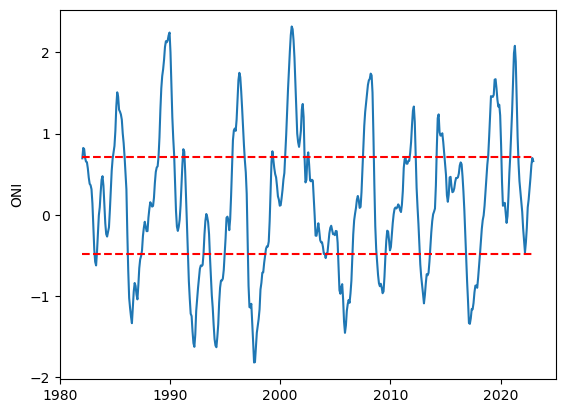

In [31]:
plt.plot(time_coords, ONI_stacked)
plt.ylabel('ONI')
plt.hlines(np.quantile(ONI,0.25),xmin = time_coords.min(), xmax = time_coords.max(), color = 'r', linestyle = 'dashed')
plt.hlines(np.quantile(ONI,0.75),xmin = time_coords.min(), xmax = time_coords.max(), color = 'r', linestyle = 'dashed')

In [32]:
ENSO_years = ((ELNI_active.dropna(dim = 'ref').ref).values)
LANI_years = ((LANI_active.dropna(dim = 'ref').ref).values)


# Biomes #

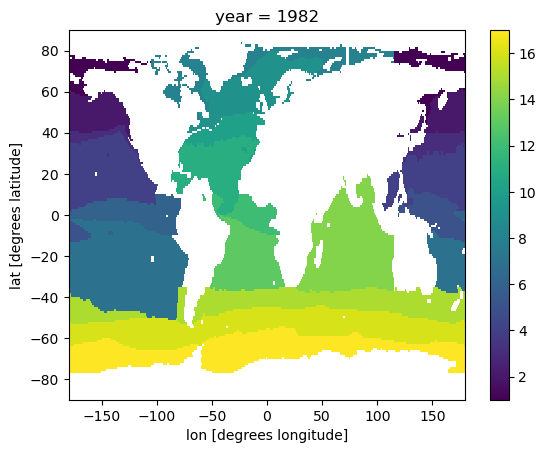

In [33]:
b = (biomes.MeanBiomes * mask_ocean).where(biomes.MeanBiomes * mask_ocean > 0)
b.plot()

# Time-series

### full field

In [32]:
# dict_em_ts_biomes_no3 = {}
# dict_em_ts_biomes_chl = {}
# dict_em_ts_biomes_tos = {}

# tropic_biomes = ['P_EQU_W' ,'P_EQU_E', 'A_EQU']
# for ii, bms_label in enumerate(tropic_biomes):
        
#         biome = biomes.MeanBiomes.where(biomes.MeanBiomes == bms_labels.index(bms_label)+1)
#         biome =spatial_mask(biome.to_dataset()) * mask_ocean
               
#         dict_em_ts_biomes_no3[bms_label] = {
#                 'historical_CMOC' : { 'ts'        : area_weighted_avg(dict_em_data_no3['historical_CMOC'].mean('lev'), mask=biome,
#                                                                 integral=False).load(),
#                                 'color'     : sim_dict_no3['color'],
#                                 'linestyle' : '-',
#                         },
#                 'historical_CanOE' : { 'ts'    : area_weighted_avg(dict_em_data_no3['historical_CanOE'].mean('lev'), mask=biome,
#                                                                 integral=False).load(),
#                                 'color'     : sim_dict_no3_CanOE['color'],
#                                 'linestyle' : '-',
#                         },
#                 }

               
#         dict_em_ts_biomes_chl[bms_label] = {
#                 'historical_CMOC' : { 'ts'        : area_weighted_avg(dict_em_data_chl['historical_CMOC'], mask=biome,
#                                                                 integral=False),
#                                 'color'     : sim_dict_chl['color'],
#                                 'linestyle' : '-'
#                         },
#                 'historical_CanOE' : { 'ts'    : area_weighted_avg(dict_em_data_chl['historical_CanOE'], mask=biome,
#                                                                 integral=False),
#                                 'color'     : sim_dict_chl_CanOE['color'],
#                                 'linestyle' : '-',
#                         },
#                 }
        
                       
#         dict_em_ts_biomes_tos[bms_label] = {
#                 'historical' : { 'ts'        : area_weighted_avg(temp, mask=biome,
#                                                                 integral=False),
#                                 'color'     : 'k',
#                                 'linestyle' : '-',
#                         },
#                 }
        

### anomalies

In [45]:

levs = dict_em_data['no3']['historical_CMOC'].lev.where(dict_em_data['no3']['historical_CMOC'].lev<= 100, drop = True)

dict_clim_mean_removed = {}
dict_anom_mean_clim_removed = {}


for var in ['no3','chl','chlos']:
    dict_clim_mean_removed[var] = {}
    dict_anom_mean_clim_removed[var] = {}

    for run in ['obs', 'historical_CMOC','historical_CanOE', 'assimilation_CMOC','assimilation_CanOE' ]:
        try:
            dict_clim_mean_removed[var][run] = get_climatology_on_base(dict_em_data[var][run].sel(lev = levs).mean('lev'),
                                                  y0_base,
                                                  y1_base,
                                                  ltime_dep=False,  # already aligned to target
                                                  full_set=False,
                                                  remove_mean = True).load()
            dict_anom_mean_clim_removed[var][run] = (dict_em_data[var][run].sel(lev = levs).mean('lev') - dict_clim_mean_removed[var][run]).load()
        except:
            dict_clim_mean_removed[var][run] = get_climatology_on_base(dict_em_data[var][run],
                                                  y0_base,
                                                  y1_base,
                                                  ltime_dep=False,  # already aligned to target
                                                  full_set=False,
                                                  remove_mean = True).load() 
            dict_anom_mean_clim_removed[var][run] = (dict_em_data[var][run] - dict_clim_mean_removed[var][run]).load()
                    
        

# tos_anom_mean_clim_removed = temp - tos_clim_mean_removed



In [46]:
dict_em_anom_ts_biomes = {}

tropic_biomes = ['P_EQU_W' ,'P_EQU_E', 'A_EQU']

for var in ['no3','chl','chlos']:
      
        dict_em_anom_ts_biomes[var] = {}  
        for ii, bms_label in enumerate(tropic_biomes):
                
                biome = biomes.MeanBiomes.where(biomes.MeanBiomes == bms_labels.index(bms_label)+1)
                biome =spatial_mask(biome.to_dataset()) * mask_ocean.squeeze()
                dict_em_anom_ts_biomes[var][bms_label] = { 
                        'historical_CMOC' : { 'ts'    : area_weighted_avg(dict_anom_mean_clim_removed[var]['historical_CMOC'], mask=biome,
                                                                        integral=False),
                                        'color'     : sim_dict_no3['color'],
                                        'linestyle' : '-',
                                },
                        'historical_CanOE' : { 'ts'    : area_weighted_avg(dict_anom_mean_clim_removed[var]['historical_CanOE'], mask=biome,
                                                                        integral=False),
                                        'color'     : sim_dict_no3_CanOE['color'],
                                        'linestyle' : '-',
                                        
                                },
                        'assimilation_CMOC' : { 'ts'    : area_weighted_avg(dict_anom_mean_clim_removed[var]['assimilation_CMOC'], mask=biome,
                                                                        integral=False),
                                        'color'     : assim_dict_no3['color'],
                                        'linestyle' : '-',
                                },
                        'assimilation_CanOE' : { 'ts'    : area_weighted_avg(dict_anom_mean_clim_removed[var]['assimilation_CanOE'], mask=biome,
                                                                        integral=False),
                                        'color'     : 'b',
                                        'linestyle' : '-',
                                },
                        }


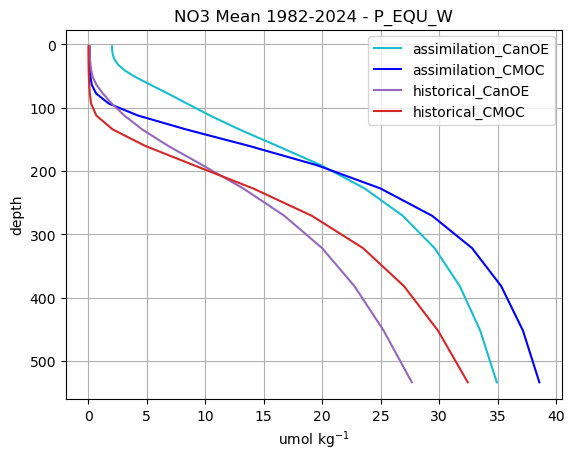

In [49]:
bmtp = 'P_EQU_W'
biome = biomes.MeanBiomes.where(biomes.MeanBiomes == bms_labels.index(bmtp)+1)


for ds in ['assimilation_CanOE','assimilation_CMOC', 'historical_CanOE', 'historical_CMOC' ]:
    dstp = get_climatology_on_base(dict_em_data_no3[ds],
                                               y0_base,
                                               y1_base,
                                               ltime_dep=False,  # already aligned to target
                                               full_set=False,
                                               remove_mean = False)
    

    dstp = area_weighted_avg(dstp.mean('time'), mask=biome, integral=False).load()                                                       
    plt.plot( dstp, dstp.lev.values, label = ds, color = dict_em_anom_ts_biomes_no3[bmtp][ds]['color'])
    
plt.title(f'NO3 Mean {y0_show}-{y1_show} - {bmtp}')
plt.ylabel('depth')
plt.xlabel(units_no3)
plt.legend()
plt.grid()
plt.gca().invert_yaxis()


JFM:[0, 1, 2]
AMJ:[3, 4, 5]
JAS:[6, 7, 8]
OND:[9, 10, 11]
ANN:[ 0  1  2  3  4  5  6  7  8  9 10 11]


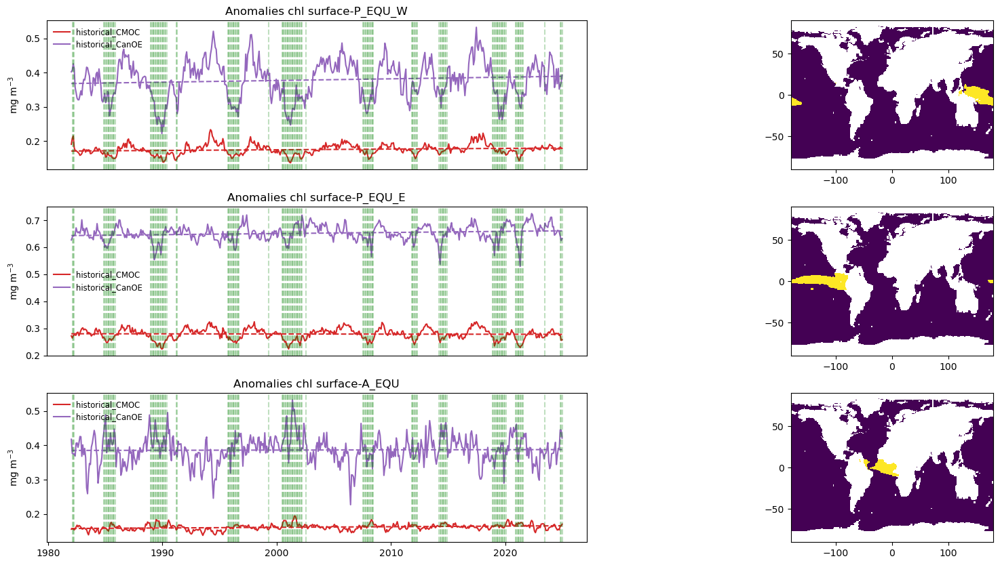

In [50]:
season = 'ANN'
ds_dicts = dict_em_anom_ts_biomes_chl
monthly_res = True
ds_list = ['historical_CMOC','historical_CanOE']
figsize = (18,10)
dict_label = 'ts'
Trend = True
title = f'Anomalies chl surface'
ylabel = units_chl
mask_biomes = mask_biomes

plot_ts_biomeavg_on_target(ds_list,
                            ds_dicts,
                            tropic_biomes,
            mask_biomes = mask_biomes,
            xx=None,
            ldyr=1-1,
            dict_label=dict_label,
            ref_ds=None,
            title=title,
            bbox=None,
            figsize=figsize,
            ylabel = ylabel, 
            season = season,
            monthly_res = monthly_res,
            Trend = Trend,
            show = True,
            ENSO_years = ENSO_years)

JFM:[0, 1, 2]
AMJ:[3, 4, 5]
JAS:[6, 7, 8]
OND:[9, 10, 11]
ANN:[ 0  1  2  3  4  5  6  7  8  9 10 11]


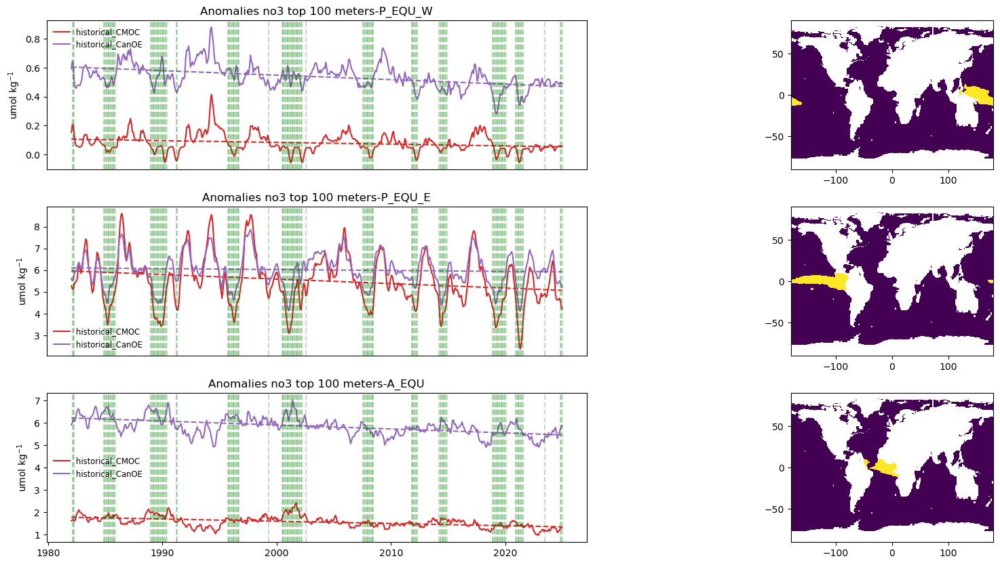

In [51]:

season = 'ANN'
ds_dicts = dict_em_anom_ts_biomes_no3
monthly_res = True
ds_list = ['historical_CMOC','historical_CanOE']
figsize = (18,10)
dict_label = 'ts'
Trend = True
title = f'Anomalies no3 top 100 meters'
ylabel = units_no3
mask_biomes = mask_biomes

plot_ts_biomeavg_on_target(ds_list,
                            ds_dicts,
                            tropic_biomes,
            mask_biomes = mask_biomes,
            xx=None,
            ldyr=1-1,
            dict_label=dict_label,
            ref_ds=None,
            title=title,
            bbox=None,
            figsize=figsize,
            ylabel = ylabel, 
            season = season,
            monthly_res = monthly_res,
            Trend = Trend,
            show = True,
            ENSO_years = ENSO_years)

In [ ]:
season = 'ANN'
ds_dicts = dict_em_anom_ts_biomes_chl
monthly_res = True
ds_list = ['obs','assimilation_CMOC','assimilation_CanOE']
figsize = (18,10)
dict_label = 'ts'
Trend = True
title = f'Anomalies chl surface'
ylabel = units_chl
mask_biomes = mask_biomes

plot_ts_biomeavg_on_target(ds_list,
                            ds_dicts,
                            ['P_EQU_W' ,'P_EQU_E'],
            mask_biomes = mask_biomes,
            xx=None,
            ldyr=1-1,
            dict_label=dict_label,
            ref_ds='obs',
            title=title,
            bbox=None,
            figsize=figsize,
            ylabel = ylabel, 
            season = season,
            Correlations = True,
            monthly_res = monthly_res,
            Trend = Trend,
            show = True,
            ENSO_years = 'obs')

In [ ]:

season = 'ANN'
ds_dicts = dict_em_anom_ts_biomes_no3
monthly_res = True
ds_list = ['assimilation_CMOC','assimilation_CanOE']
figsize = (18,10)
dict_label = 'ts'
Trend = True
title = f'Anomalies no3 top 100 meters'
ylabel = units_no3
mask_biomes = mask_biomes

plot_ts_biomeavg_on_target(ds_list,
                            ds_dicts,
                            ['P_EQU_W' ,'P_EQU_E'],
            mask_biomes = mask_biomes,
            xx=None,
            ldyr=1-1,
            dict_label=dict_label,
            ref_ds=None,
            title=title,
            bbox=None,
            figsize=figsize,
            ylabel = ylabel, 
            season = season,
            monthly_res = monthly_res,
            Trend = Trend,
            show = True,
            ENSO_years = 'obs')

# Time VS Depth

In [31]:
# ENSO_years_limits = [ENSO_years[0]]
# start = ENSO_years[0]
# for ind in np.arange(1, len(ENSO_years)):
#     # if np.floor(ENSO_years[ind]) != np.floor(year):
#         if ENSO_years[ind] - ENSO_years[ind-1] > 1/11:
            
#             end = ENSO_years[ind-1]
#             start = ENSO_years[ind]
            
#             if np.floor(start) != np.floor(end):
#                 if end not in ENSO_years_limits:
#                     ENSO_years_limits.append(end)
#                 else: 
#                     ENSO_years_limits.remove(end)
#                 ENSO_years_limits.append(start)
#             # else:
#             #      pass
#             #      #ENSO_years_limits.append(ENSO_years[ind])
                   
# ENSO_years_limits_ = ENSO_years_limits[:-1]
# for ind in range(0,len(ENSO_years_limits_),2):
#     if ENSO_years_limits_[ind + 1] - ENSO_years_limits_[ind] < 1/11:
#         ENSO_years_limits.remove(ENSO_years_limits_[ind])
#         ENSO_years_limits.remove(ENSO_years_limits_[ind+1])
# ENSO_years_limits

ENSO_years_limits = [1982.125, 1982.29166667, 1984.875 , 1985.875  , 1988.95833333,1990.375, 1995.70833333,  1996.70833333, 2000.45833333, 2002.54166667, 2007.54166667 , 2008.45833333, 2011.79166667, 2012.29166667,2014.20833333, 2014.875 , 
2018.875, 2020.04166667,2020.875 ,2021.54166667]#, 2024.79166667,2024.95833333]

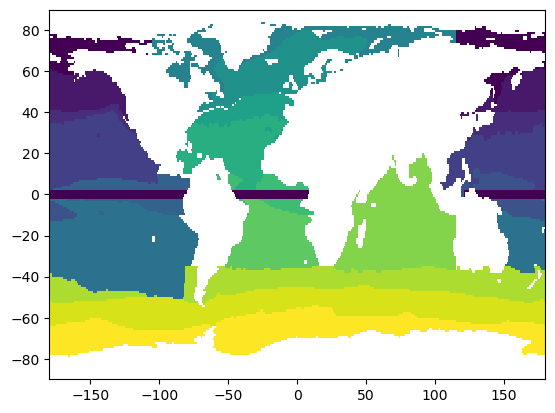

In [32]:

plt.pcolormesh(biomes.MeanBiomes.lon, biomes.MeanBiomes.lat, biomes.MeanBiomes.values)

PEQ = biomes.MeanBiomes.where((biomes.MeanBiomes.lat>= -2) & (biomes.MeanBiomes.lat <= 2))
PEQ = PEQ.where( (PEQ.lon <= -59) | (PEQ.lon >= 121))
PEQ = PEQ.where(np.isnan(PEQ), 1)

PEQ_E = PEQ.where(PEQ.lon<0)
PEQ_W = PEQ.where(PEQ.lon>0)

AEQ = biomes.MeanBiomes.where((biomes.MeanBiomes.lat>= -2) & (biomes.MeanBiomes.lat <= 2))
AEQ = AEQ.where( (AEQ.lon >= -55) & (AEQ.lon <= 20))
AEQ = AEQ.where(np.isnan(AEQ), 1)

plt.pcolormesh(PEQ.lon, PEQ.lat, PEQ.values)
plt.pcolormesh(AEQ.lon, AEQ.lat, AEQ.values)



In [33]:
mask_EQ = { 'PEQ' : PEQ.where(~np.isnan(PEQ),0), 'AEQ' : AEQ.where(~np.isnan(AEQ),0), 'PEQ_E' : PEQ_E.where(~np.isnan(PEQ_E),0), 'PEQ_W' : PEQ_W.where(~np.isnan(PEQ_W),0)}


In [34]:
ONI_sim = xr.open_dataset('/home/rpg002/BGC_skill/00_diagnostics_basics/CanESM5_sim_r1i1p2f1_ONI_1950-2025.nc')['tos'].sel(year = slice(y0_show,y1_show))
ONI_assim = xr.open_dataset('/home/rpg002/BGC_skill/00_diagnostics_basics/CanESM5_assim_ONI_1975-2023.nc')['tos'].sel(year = slice(y0_show,y1_show))

In [49]:
var_list = ['no3','chl','chlos']

In [ ]:
from module_plot_maps import plot_depth_vs_time_biomeavg

dict_profile_EQ = {}
dict_clim_mean_removed = {}
dict_anom_mean_clim_removed = {}


color_dict = {'historical_CMOC' : 'tab:red', 'historical_CanOE' : 'tab:purple', 'assimilation_CanOE' : 'tab:cyan', 'assimilation_CMOC' : 'tab:blue'}

for var in var_list:

    dict_profile_EQ[var] = {}
    dict_clim_mean_removed[var] = {}
    dict_anom_mean_clim_removed[var] = {}
    for region in ['PEQ','PEQ_W','PEQ_E','AEQ']:

        dict_profile_EQ[var][region] = {}
        dict_clim_mean_removed[var][region] = {}
        dict_anom_mean_clim_removed[var][region] = {}

        for ds in ['obs', 'historical_CMOC', 'assimilation_CMOC', 'historical_CanOE', 'assimilation_CanOE']:
            try:
                dict_profile_EQ[var][region][ds] = area_weighted_avg(dict_em_data[var][ds], mask=mask_EQ[region],
                                                                        integral=False).load()

                
                dict_clim_mean_removed[var][region][ds] = get_climatology_on_base(dict_profile_EQ[var][region][ds],
                                                    y0_base,
                                                    y1_base,
                                                    ltime_dep=False,  # already aligned to target
                                                    full_set=False,
                                                    remove_mean = True)
                dict_anom_mean_clim_removed[var][region][ds] = {'ts' : dict_profile_EQ[var][region][ds] - dict_clim_mean_removed[var][region][ds],'color' : color_dict[ds], 'linestyle' : '-'} 
            except:
                print(f'{ds} for {var} non-existent' )


In [ ]:
# from module_plot_maps import plot_depth_vs_time_biomeavg

# dict_profile_EQ_tos = {}
# dict_clim_mean_removed_tos = {}
# dict_anom_mean_clim_removed_tos = {}

# for region in ['PEQ','PEQ_W','PEQ_E','AEQ']:


#     dict_profile_EQ_tos[region] =area_weighted_avg(temp, mask=mask_EQ[region],
#                                                                 integral=False).load()
    
#     dict_clim_mean_removed_tos[region] = get_climatology_on_base(dict_profile_EQ_tos[region],
#                                                y0_base,
#                                                y1_base,
#                                                ltime_dep=False,  # already aligned to target
#                                                full_set=False,
#                                                remove_mean = True)
    
#     dict_anom_mean_clim_removed_tos[region] = {'ts' :  dict_profile_EQ_tos[region] - dict_clim_mean_removed_tos[region],  'color' : color_dict[ds], 'linestyle' : '-'}



JFM:[0, 1, 2]
AMJ:[3, 4, 5]
JAS:[6, 7, 8]
OND:[9, 10, 11]
ANN:[ 0  1  2  3  4  5  6  7  8  9 10 11]


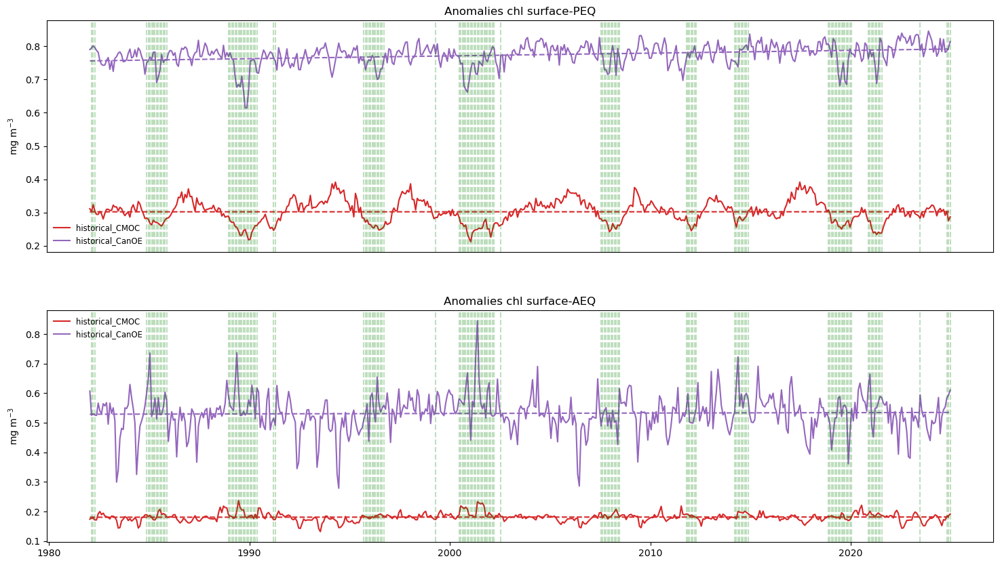

In [56]:
season = 'ANN'
ds_dicts = dict_anom_mean_clim_removed_chl
monthly_res = True
ds_list = ['historical_CMOC','historical_CanOE']
figsize = (18,10)
dict_label = 'ts'
Trend = True
title = f'Deseasonalized chl surface'
ylabel = units_chl
mask_biomes = None
EQ_biomes = ['PEQ', 'AEQ']

plot_ts_biomeavg_on_target(ds_list,
                            ds_dicts,
                            EQ_biomes,
            mask_biomes = mask_biomes,
            xx=None,
            ldyr=1-1,
            dict_label=dict_label,
            ref_ds=None,
            title=title,
            bbox=None,
            figsize=figsize,
            ylabel = ylabel, 
            season = season,
            monthly_res = monthly_res,
            Trend = Trend,
            show = True,
            ENSO_years = ENSO_years)

JFM:[0, 1, 2]
AMJ:[3, 4, 5]
JAS:[6, 7, 8]
OND:[9, 10, 11]
ANN:[ 0  1  2  3  4  5  6  7  8  9 10 11]


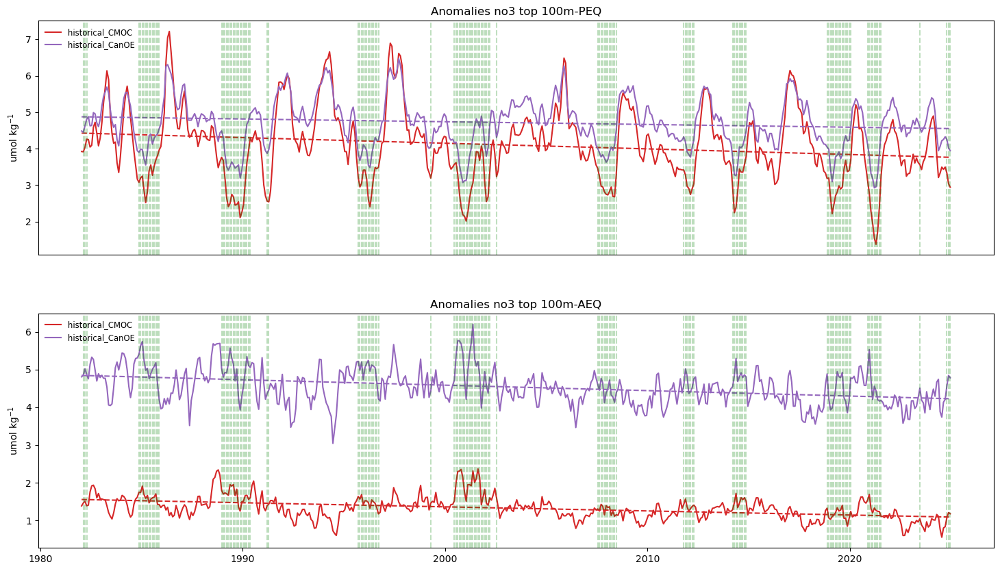

In [57]:
season = 'ANN'
ds_dicts = dict_anom_mean_clim_removed_no3
monthly_res = True
ds_list = ['historical_CMOC','historical_CanOE']
figsize = (18,10)
dict_label = 'ts'
Trend = True

ylabel = units_no3
mask_biomes = None
EQ_biomes = ['PEQ', 'AEQ']
lev_range = 100
title = f'Deseasonalized no3 top {lev_range}m'

plot_ts_biomeavg_on_target(ds_list,
                            ds_dicts,
                            EQ_biomes,
            mask_biomes = mask_biomes,
            xx=None,
            ldyr=1-1,
            dict_label=dict_label,
            ref_ds=None,
            title=title,
            bbox=None,
            figsize=figsize,
            ylabel = ylabel, 
            lev_range = lev_range,
            season = season,
            monthly_res = monthly_res,
            Trend = Trend,
            show = True,
            ENSO_years = ENSO_years)

JFM:[0, 1, 2]
AMJ:[3, 4, 5]
JAS:[6, 7, 8]
OND:[9, 10, 11]
ANN:[ 0  1  2  3  4  5  6  7  8  9 10 11]


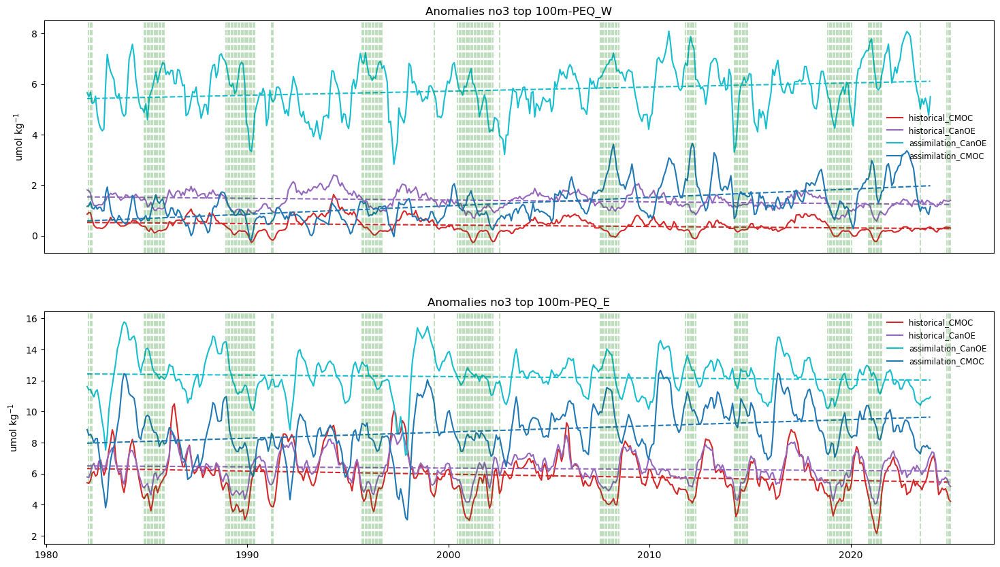

In [59]:
season = 'ANN'
ds_dicts = dict_anom_mean_clim_removed_no3
monthly_res = True
ds_list = ['historical_CMOC','historical_CanOE', 'assimilation_CanOE', 'assimilation_CMOC']
figsize = (18,10)
dict_label = 'ts'
Trend = True

ylabel = units_no3
mask_biomes = None
EQ_biomes = ['PEQ_W', 'PEQ_E']
lev_range = 100
title = f'Deseasonalized no3 top {lev_range}m'

plot_ts_biomeavg_on_target(ds_list,
                            ds_dicts,
                            EQ_biomes,
            mask_biomes = mask_biomes,
            xx=None,
            ldyr=1-1,
            dict_label=dict_label,
            ref_ds=None,
            title=title,
            bbox=None,
            figsize=figsize,
            ylabel = ylabel, 
            lev_range = lev_range,
            season = season,
            monthly_res = monthly_res,
            Trend = Trend,
            show = True,
            ENSO_years = ENSO_years)

JFM:[0, 1, 2]
AMJ:[3, 4, 5]
JAS:[6, 7, 8]
OND:[9, 10, 11]
ANN:[ 0  1  2  3  4  5  6  7  8  9 10 11]


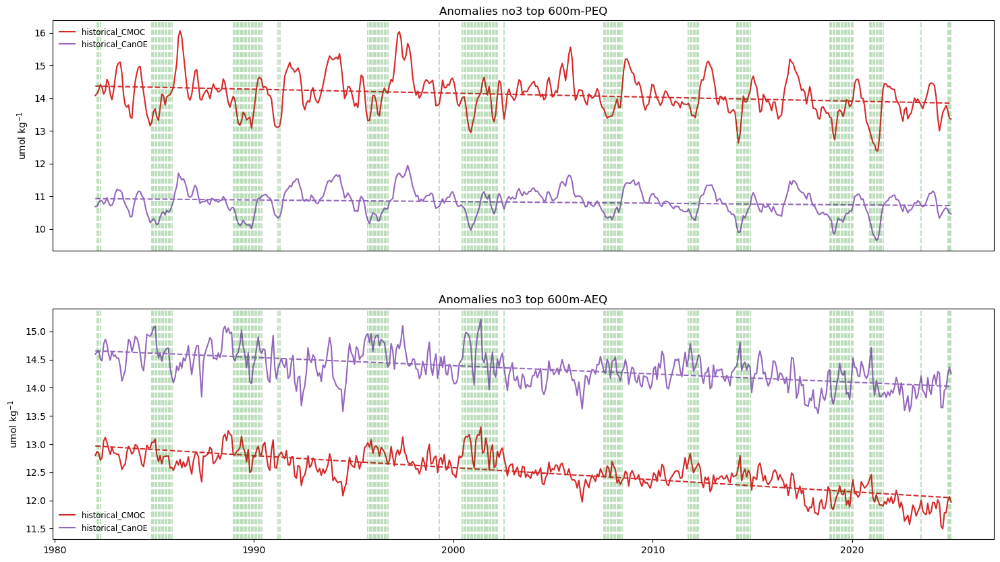

In [60]:
season = 'ANN'
ds_dicts = dict_anom_mean_clim_removed_no3
monthly_res = True
ds_list = ['historical_CMOC','historical_CanOE']
figsize = (18,10)
dict_label = 'ts'
Trend = True

ylabel = units_no3
mask_biomes = None
EQ_biomes = ['PEQ', 'AEQ']
lev_range = 600
title = f'Deseasonalized no3 top {lev_range}m'

plot_ts_biomeavg_on_target(ds_list,
                            ds_dicts,
                            EQ_biomes,
            mask_biomes = mask_biomes,
            xx=None,
            ldyr=1-1,
            dict_label=dict_label,
            ref_ds=None,
            title=title,
            bbox=None,
            figsize=figsize,
            ylabel = ylabel, 
            lev_range = lev_range,
            season = season,
            monthly_res = monthly_res,
            Trend = Trend,
            show = True,
            ENSO_years = ENSO_years)

JFM:[0, 1, 2]
AMJ:[3, 4, 5]
JAS:[6, 7, 8]
OND:[9, 10, 11]
ANN:[ 0  1  2  3  4  5  6  7  8  9 10 11]


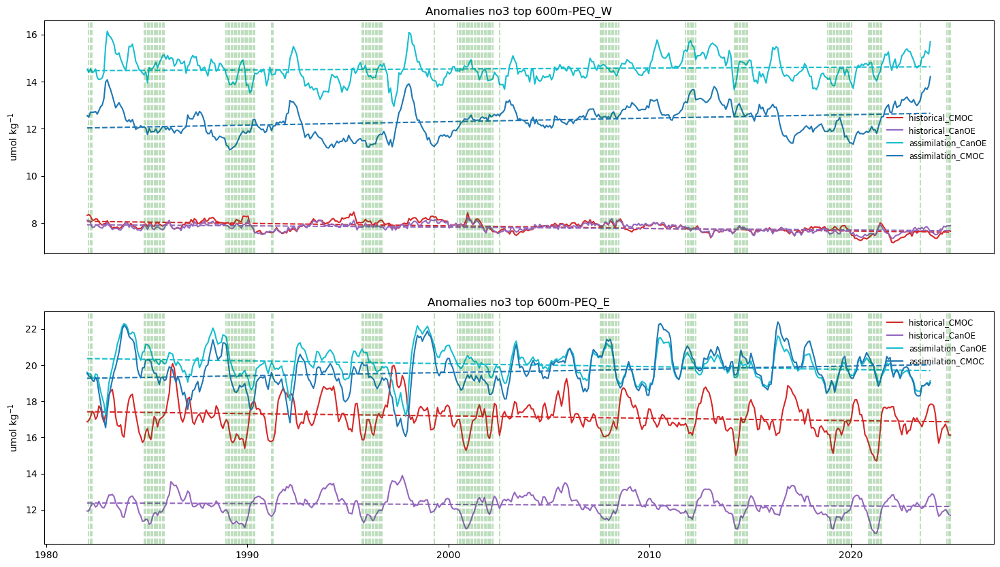

In [61]:
season = 'ANN'
ds_dicts = dict_anom_mean_clim_removed_no3
monthly_res = True
ds_list = ['historical_CMOC','historical_CanOE', 'assimilation_CanOE','assimilation_CMOC']
figsize = (18,10)
dict_label = 'ts'
Trend = True

ylabel = units_no3
mask_biomes = None
EQ_biomes = ['PEQ_W', 'PEQ_E']
lev_range = 600
title = f'Deseasonalized no3 top {lev_range}m'

plot_ts_biomeavg_on_target(ds_list,
                            ds_dicts,
                            EQ_biomes,
            mask_biomes = mask_biomes,
            xx=None,
            ldyr=1-1,
            dict_label=dict_label,
            ref_ds=None,
            title=title,
            bbox=None,
            figsize=figsize,
            ylabel = ylabel, 
            lev_range = lev_range,
            season = season,
            monthly_res = monthly_res,
            Trend = Trend,
            show = True,
            ENSO_years = ENSO_years)

JFM:[0, 1, 2]
AMJ:[3, 4, 5]
JAS:[6, 7, 8]
OND:[9, 10, 11]
ANN:[ 0  1  2  3  4  5  6  7  8  9 10 11]


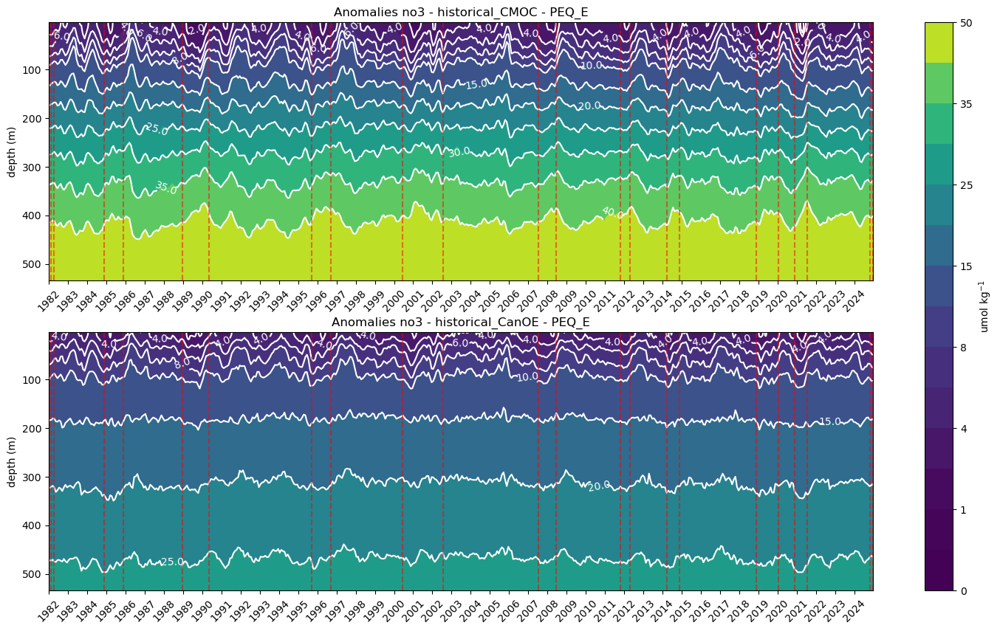

In [62]:

ds_dicts = dict_anom_mean_clim_removed_no3
monthly_res = True
ds_list = ['historical_CMOC','historical_CanOE']
figsize = (18,10)
title = f'Deseasonalized no3'
lev_range = 600
bms_label = 'PEQ_E'


plot_depth_vs_time_biomeavg(ds_list,
                            ds_dicts,
                            bms_label,
            ldyr=1-1,
            title=title,
            figsize=figsize,
            contour_levels = [0,0.5, 1,2,4,6, 8,10,15,20,25,30,35,40,50],
            colorbar_label = units_no3, 
            season = 'ANN',
            lev_range = lev_range,
            monthly_res = monthly_res,
            ENSO_years = ENSO_years_limits,
            show=True)

JFM:[0, 1, 2]
AMJ:[3, 4, 5]
JAS:[6, 7, 8]
OND:[9, 10, 11]
ANN:[ 0  1  2  3  4  5  6  7  8  9 10 11]


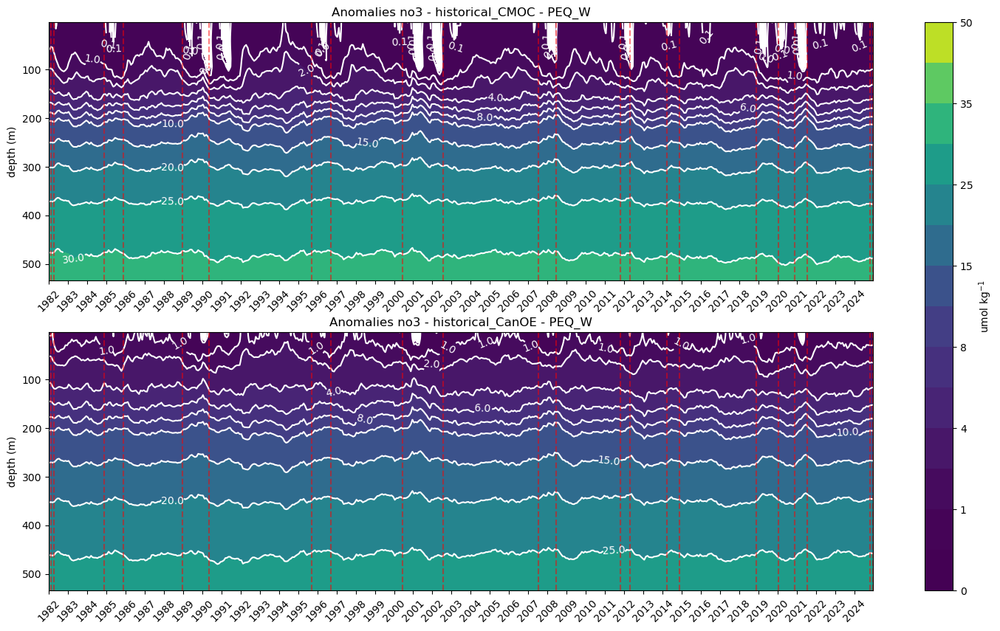

In [63]:

ds_dicts = dict_anom_mean_clim_removed_no3
monthly_res = True
ds_list = ['historical_CMOC','historical_CanOE']
figsize = (18,10)
title = f'Deseasonalized no3'
lev_range = 600
bms_label = 'PEQ_W'


plot_depth_vs_time_biomeavg(ds_list,
                            ds_dicts,
                            bms_label,
            ldyr=1-1,
            title=title,
            figsize=figsize,
            contour_levels =  [0,0.1, 1,2,4,6, 8,10,15,20,25,30,35,40,50],
            colorbar_label = units_no3, 
            season = 'ANN',
            lev_range = lev_range,
            monthly_res = monthly_res,
            ENSO_years = ENSO_years_limits,
            show=True)

In [ ]:

ds_dicts = dict_anom_mean_clim_removed_no3
monthly_res = True
ds_list = ['assimilation_CMOC','assimilation_CanOE']
figsize = (18,10)
title = f'Deseasonalized no3'
lev_range = 600
bms_label = 'PEQ_E'


plot_depth_vs_time_biomeavg(ds_list,
                            ds_dicts,
                            bms_label,
            ldyr=1-1,
            title=title,
            figsize=figsize,
            contour_levels = [0,0.5, 1,2,4,6, 8,10,15,20,25,30,35,40,50],
            colorbar_label = units_no3, 
            season = 'ANN',
            lev_range = lev_range,
            monthly_res = monthly_res,
            ENSO_years = 'obs',
            show=True)

# Maps

In [34]:
ENSO_years_limits = [1982.125, 1982.29166667, 1984.875 , 1985.875  , 1988.95833333,1990.375, 1995.70833333,  1996.70833333, 2000.45833333, 2002.54166667, 2007.54166667 , 2008.45833333, 2011.79166667, 2012.29166667,2014.20833333, 2014.875 , 
2018.875, 2020.04166667,2020.875 ,2021.54166667]#, 2024.79166667,2024.95833333]


ONI_sim = xr.open_dataset('/home/rpg002/BGC_skill/00_diagnostics_basics/CanESM5_sim_r1i1p2f1_ONI_1950-2025.nc')['tos'].sel(year = slice(y0_show,y1_show))
ONI_assim = xr.open_dataset('/home/rpg002/BGC_skill/00_diagnostics_basics/CanESM5_assim_ONI_1975-2023.nc')['tos'].sel(year = slice(y0_show,y1_show))

## Prepare data for sections

In [35]:
var_list = ['no3','chl','chlos']

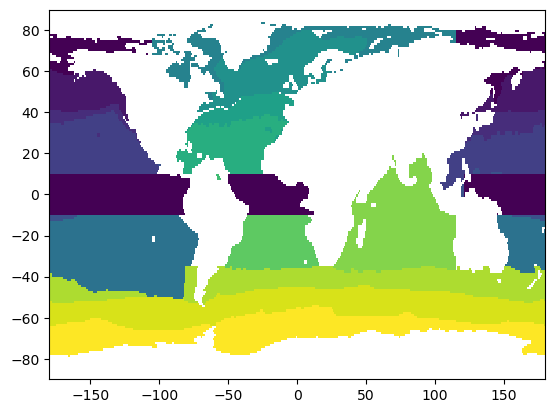

In [36]:

plt.pcolormesh(biomes.MeanBiomes.lon, biomes.MeanBiomes.lat, biomes.MeanBiomes.values)

PEQ = biomes.MeanBiomes.where((biomes.MeanBiomes.lat>= -10) & (biomes.MeanBiomes.lat <= 10))
PEQ = PEQ.where( (PEQ.lon <= -59) | (PEQ.lon >= 121))
PEQ = PEQ.where(np.isnan(PEQ), 1)

PEQ_E = PEQ.where(PEQ.lon<0)
PEQ_W = PEQ.where(PEQ.lon>0)

AEQ = biomes.MeanBiomes.where((biomes.MeanBiomes.lat>= -10) & (biomes.MeanBiomes.lat <= 10))
AEQ = AEQ.where( (AEQ.lon >= -55) & (AEQ.lon <= 20))
AEQ = AEQ.where(np.isnan(AEQ), 1)

plt.pcolormesh(PEQ.lon, PEQ.lat, PEQ.values)
plt.pcolormesh(AEQ.lon, AEQ.lat, AEQ.values)

mask_EQ = { 'PEQ' : PEQ.where(~np.isnan(PEQ),0), 'AEQ' : AEQ.where(~np.isnan(AEQ),0), 'PEQ_E' : PEQ_E.where(~np.isnan(PEQ_E),0), 'PEQ_W' : PEQ_W.where(~np.isnan(PEQ_W),0)}

In [37]:

dict_profile_EQ_REF = {}
dict_clim_mean_removed_REF = {}
dict_anom_snaps_clim_removed_REF = {}

for var in var_list:

    dict_profile_EQ_REF[var] = {}
    dict_clim_mean_removed_REF[var] = {}
    dict_anom_snaps_clim_removed_REF[var] = {}   

    for region in ['PEQ','AEQ']:
        dict_profile_EQ_REF[var][region] = {}
        dict_clim_mean_removed_REF[var][region] = {}
        dict_anom_snaps_clim_removed_REF[var][region] = {}


        for ds in ['obs','historical_CMOC', 'assimilation_CMOC', 'historical_CanOE', 'assimilation_CanOE']:
            try:
                dict_profile_EQ_REF[var][region][ds] = dict_em_data[var][ds].where(mask_EQ[region] == 1)
                
                
                
                dict_clim_mean_removed_REF[var][region][ds] = get_climatology_on_base(dict_profile_EQ_REF[var][region][ds],
                                                    y0_base,
                                                    y1_base,
                                                    ltime_dep=False,  # already aligned to target
                                                    full_set=False,
                                                    remove_mean = True).load()
                
                dict_anom_snaps_clim_removed_REF[var][region][ds] = (dict_profile_EQ_REF[var][region][ds] - dict_clim_mean_removed_REF[var][region][ds]).squeeze()


            except:

                print(f'{ds} for {var} non-existent! ')




obs for chl non-existent! 
obs for chl non-existent! 


## Profiles

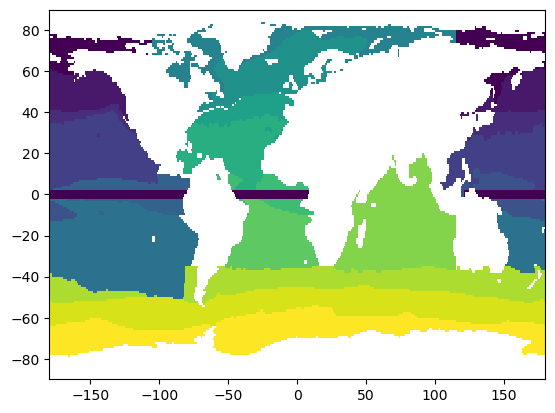

In [38]:

plt.pcolormesh(biomes.MeanBiomes.lon, biomes.MeanBiomes.lat, biomes.MeanBiomes.values)

PEQ = biomes.MeanBiomes.where((biomes.MeanBiomes.lat>= -2) & (biomes.MeanBiomes.lat <= 2))
PEQ = PEQ.where( (PEQ.lon <= -59) | (PEQ.lon >= 121))
PEQ = PEQ.where(np.isnan(PEQ), 1)

PEQ_E = PEQ.where(PEQ.lon<0)
PEQ_W = PEQ.where(PEQ.lon>0)

AEQ = biomes.MeanBiomes.where((biomes.MeanBiomes.lat>= -2) & (biomes.MeanBiomes.lat <= 2))
AEQ = AEQ.where( (AEQ.lon >= -55) & (AEQ.lon <= 20))
AEQ = AEQ.where(np.isnan(AEQ), 1)

plt.pcolormesh(PEQ.lon, PEQ.lat, PEQ.values)
plt.pcolormesh(AEQ.lon, AEQ.lat, AEQ.values)

mask_EQ = { 'PEQ' : PEQ.where(~np.isnan(PEQ),0), 'AEQ' : AEQ.where(~np.isnan(AEQ),0), 'PEQ_E' : PEQ_E.where(~np.isnan(PEQ_E),0), 'PEQ_W' : PEQ_W.where(~np.isnan(PEQ_W),0)}

In [44]:
from module_plot_maps import snapshot_depth_vs_lon

dict_profile_EQ = {}
dict_clim_mean_removed = {}
dict_anom_snaps_clim_removed = {}

for var in var_list:
    dict_profile_EQ[var] = {}
    dict_clim_mean_removed[var] = {}
    dict_anom_snaps_clim_removed[var] = {}

    for region in ['PEQ','AEQ']:
        dict_profile_EQ[var][region] = {}
        dict_clim_mean_removed[var][region] = {}
        dict_anom_snaps_clim_removed[var][region] = {}


        for ds in ['obs','historical_CMOC', 'assimilation_CMOC', 'historical_CanOE', 'assimilation_CanOE']:
            try:
                dict_profile_EQ[var][region][ds] = dict_profile_EQ_REF[var][region][ds].where(mask_EQ[region] == 1, drop = True).mean('lat')                   
                dict_clim_mean_removed[var][region][ds] = dict_clim_mean_removed_REF[var][region][ds].where(mask_EQ[region] == 1, drop = True).mean('lat')
                dict_anom_snaps_clim_removed[var][region][ds] = dict_anom_snaps_clim_removed_REF[var][region][ds].where(mask_EQ[region] == 1, drop = True).mean('lat')


                if region == 'PEQ':

                    dict_anom_snaps_clim_removed[var][region][ds]['lon'] = np.mod(dict_anom_snaps_clim_removed[var][region][ds]['lon'] + 360,360)
                    dict_anom_snaps_clim_removed[var][region][ds] = dict_anom_snaps_clim_removed[var][region][ds].sortby('lon')
            except:
                print(f'{ds} for {var} non-existent!')




# dict_profile_EQ_no3 = {}
# dict_profile_EQ_chl = {}
# dict_clim_mean_removed_no3 = {}
# dict_clim_mean_removed_chl = {}
# dict_anom_snaps_clim_removed_no3 = {}
# dict_anom_snaps_clim_removed_chl = {}

# for region in ['PEQ','AEQ']:
#     dict_profile_EQ_no3[region] = {}
#     dict_profile_EQ_chl[region] = {}
#     dict_clim_mean_removed_no3[region] = {}
#     dict_clim_mean_removed_chl[region] = {}
#     dict_anom_snaps_clim_removed_no3[region] = {}
#     dict_anom_snaps_clim_removed_chl[region] = {}

#     for ds in ['obs','historical_CMOC', 'historical_CanOE', 'assimilation_CanOE','assimilation_CMOC']:
#         dict_profile_EQ_no3[region][ds] = dict_em_data_no3[ds].where(mask_EQ[region] == 1, drop = True).mean('lat')
        
        
        
#         dict_clim_mean_removed_no3[region][ds] = get_climatology_on_base(dict_profile_EQ_no3[region][ds],
#                                                y0_base,
#                                                y1_base,
#                                                ltime_dep=False,  # already aligned to target
#                                                full_set=False,
#                                                remove_mean = True).load()
        
#         dict_anom_snaps_clim_removed_no3[region][ds] = (dict_profile_EQ_no3[region][ds] - dict_clim_mean_removed_no3[region][ds]).squeeze()



#         dict_profile_EQ_chl[region][ds] = dict_em_data_chl[ds].where(mask_EQ[region] == 1, drop = True).mean('lat')
        
#         dict_clim_mean_removed_chl[region][ds] = get_climatology_on_base(dict_profile_EQ_chl[region][ds],
#                                             y0_base,
#                                             y1_base,
#                                             ltime_dep=False,  # already aligned to target
#                                             full_set=False,
#                                             remove_mean = True).load()


#         dict_anom_snaps_clim_removed_chl[region][ds] = (dict_profile_EQ_chl[region][ds] - dict_clim_mean_removed_chl[region][ds]).squeeze()

#         if region == 'PEQ':
#             dict_anom_snaps_clim_removed_chl[region][ds]['lon'] = np.mod(dict_anom_snaps_clim_removed_chl[region][ds]['lon'] + 360,360)
#             dict_anom_snaps_clim_removed_chl[region][ds] = dict_anom_snaps_clim_removed_chl[region][ds].sortby('lon')

#             dict_anom_snaps_clim_removed_no3[region][ds]['lon'] = np.mod(dict_anom_snaps_clim_removed_no3[region][ds]['lon'] + 360,360)
#             dict_anom_snaps_clim_removed_no3[region][ds] = dict_anom_snaps_clim_removed_no3[region][ds].sortby('lon')





obs for chl non-existent!
obs for chl non-existent!


In [45]:
data_dicts_LANI = {}
data_dicts_ELNI = {}
for var in var_list:

    data_dicts_LANI[var] = {}
    data_dicts_ELNI[var] = {}

    for bm in dict_anom_snaps_clim_removed[var].keys():
        data_dicts_LANI[var][bm] = {}
        data_dicts_ELNI[var][bm] = {}

        for ds in dict_anom_snaps_clim_removed[var][bm].keys():
                if 'historical' in ds:
                    data_dicts_LANI[var][bm][ds] = dict_anom_snaps_clim_removed[var][bm][ds].where(ONI_sim<=np.quantile(ONI_sim,0.25))
                    data_dicts_ELNI[var][bm][ds] = dict_anom_snaps_clim_removed[var][bm][ds].where(ONI_sim>=np.quantile(ONI_sim,0.75))

                else:
                    data_dicts_LANI[var][bm][ds] = dict_anom_snaps_clim_removed[var][bm][ds].where(ONI_assim<=np.quantile(ONI_assim,0.25))
                    data_dicts_ELNI[var][bm][ds] = dict_anom_snaps_clim_removed[var][bm][ds].where(ONI_assim>=np.quantile(ONI_assim,0.75))


data_dicts_diff = {}

for var in var_list:
    data_dicts_diff[var] = {}

    for bm in dict_anom_snaps_clim_removed[var].keys():
        data_dicts_diff[var][bm] = {}


        for ds in dict_anom_snaps_clim_removed[var][bm].keys():

                data_dicts_diff[var][bm][ds] = (data_dicts_LANI[var][bm][ds].mean('year') - data_dicts_ELNI[var][bm][ds].mean('year')).expand_dims('year', axis = 0).assign_coords(year = ['diff'])



#### historical

##### La Nina

JFM:[0, 1, 2]
AMJ:[3, 4, 5]
JAS:[6, 7, 8]
OND:[9, 10, 11]
ANN:[ 0  1  2  3  4  5  6  7  8  9 10 11]


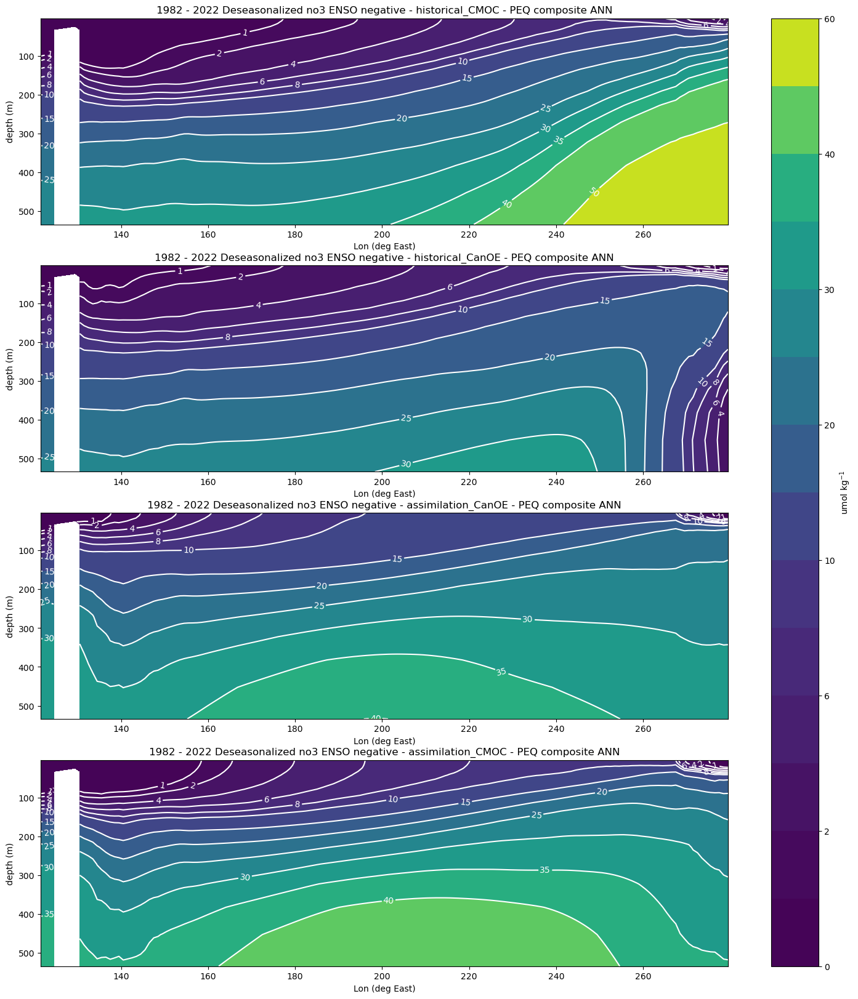

In [38]:
ds_dicts = data_dicts_LANI_no3
monthly_res = True
ds_list = ['historical_CMOC','historical_CanOE', 'assimilation_CanOE',  'assimilation_CMOC']
figsize = (18,20)
title = f'{(y0_show)} - {(y1_show)} Deseasonalized no3 ENSO negative'
lev_range = 600
yeartoplot = list(dict_anom_snaps_clim_removed_chl['PEQ']['assimilation_CMOC'].year.values)
bms_label = 'PEQ'

snapshot_depth_vs_lon(ds_list,
                            ds_dicts,
                            bms_label,
                            yeartoplot,
            title=title,
            figsize=figsize,
            contour_levels = [0, 1,2,4,6, 8,10,15,20,25,30,35,40,50,60],
            colorbar_label = units_no3, 
            season = 'ANN',
            lev_range = lev_range,
            show=True)





##### El Nino

JFM:[0, 1, 2]
AMJ:[3, 4, 5]
JAS:[6, 7, 8]
OND:[9, 10, 11]
ANN:[ 0  1  2  3  4  5  6  7  8  9 10 11]


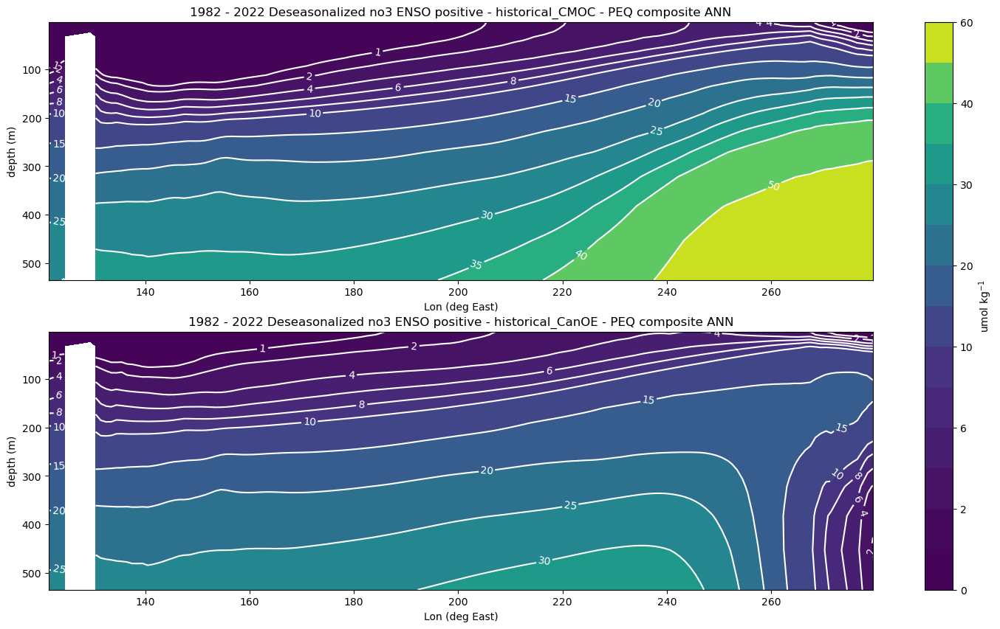

In [87]:
ds_dicts = data_dicts_ELNI_no3
monthly_res = True
ds_list = ['historical_CMOC','historical_CanOE']
figsize = (18,10)
title = f'{(y0_show)} - {(y1_show)} Deseasonalized no3 ENSO positive'
lev_range = 600
yeartoplot = list(dict_anom_snaps_clim_removed_chl['PEQ']['assimilation_CMOC'].year.values)
bms_label = 'PEQ'

snapshot_depth_vs_lon(ds_list,
                            ds_dicts,
                            bms_label,
                            yeartoplot,
            title=title,
            figsize=figsize,
            contour_levels = [0, 1,2,4,6, 8,10,15,20,25,30,35,40,50,60],
            colorbar_label = units_no3, 
            season = 'ANN',
            lev_range = lev_range,
            show=True)

##### diff

JFM:[0, 1, 2]
AMJ:[3, 4, 5]
JAS:[6, 7, 8]
OND:[9, 10, 11]
ANN:[ 0  1  2  3  4  5  6  7  8  9 10 11]


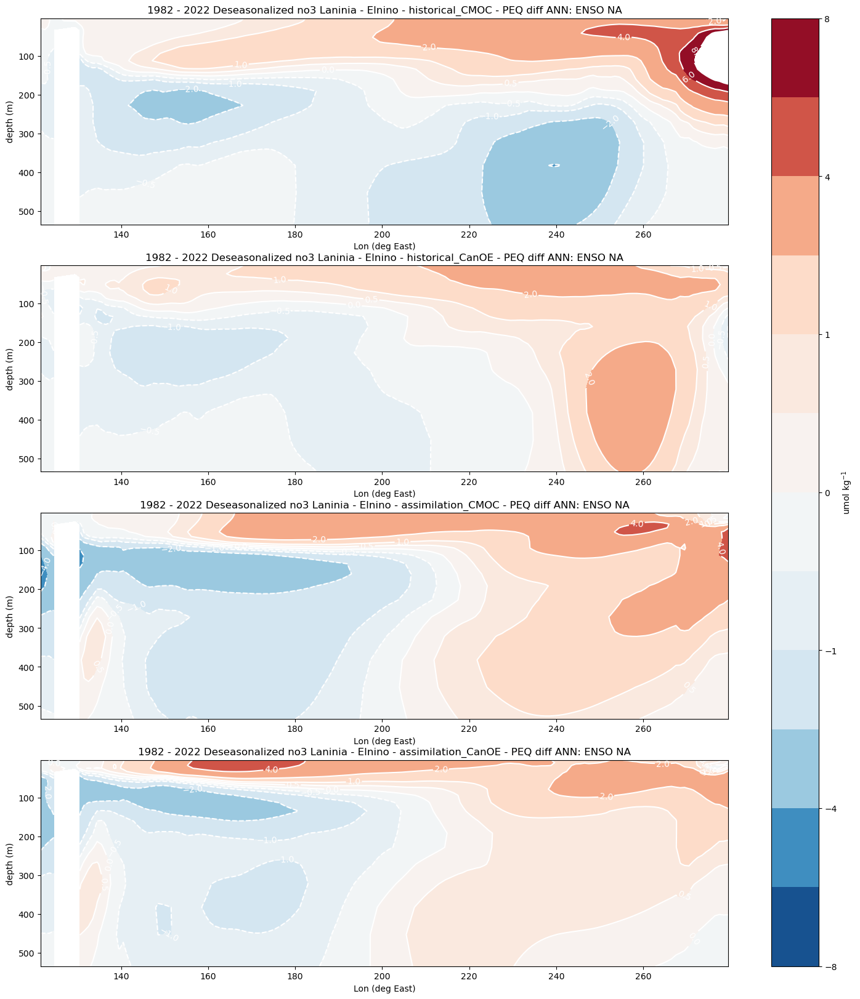

In [41]:
ds_dicts = data_dicts_diff_no3
monthly_res = True
ds_list = ['historical_CMOC','historical_CanOE', 'assimilation_CMOC','assimilation_CanOE']
figsize = (18,20)
title = f'{y0_show} - {y1_show} Deseasonalized no3 Laninia - Elnino'
lev_range = 600
yeartoplot = ['diff']
bms_label = 'PEQ'

snapshot_depth_vs_lon(ds_list,
                            ds_dicts,
                            bms_label,
                            yeartoplot,
            title=title,
            figsize=figsize,
            contour_levels = [-8,-6,-4,-2,-1,-0.5,0,0.5, 1,2,4,6, 8],
            cmap = 'RdBu_r',
            colorbar_label = units_no3, 
            season = 'ANN',
            lev_range = lev_range,
            show=True)

#### Assimilation

##### La Nina

JFM:[0, 1, 2]
AMJ:[3, 4, 5]
JAS:[6, 7, 8]
OND:[9, 10, 11]
ANN:[ 0  1  2  3  4  5  6  7  8  9 10 11]


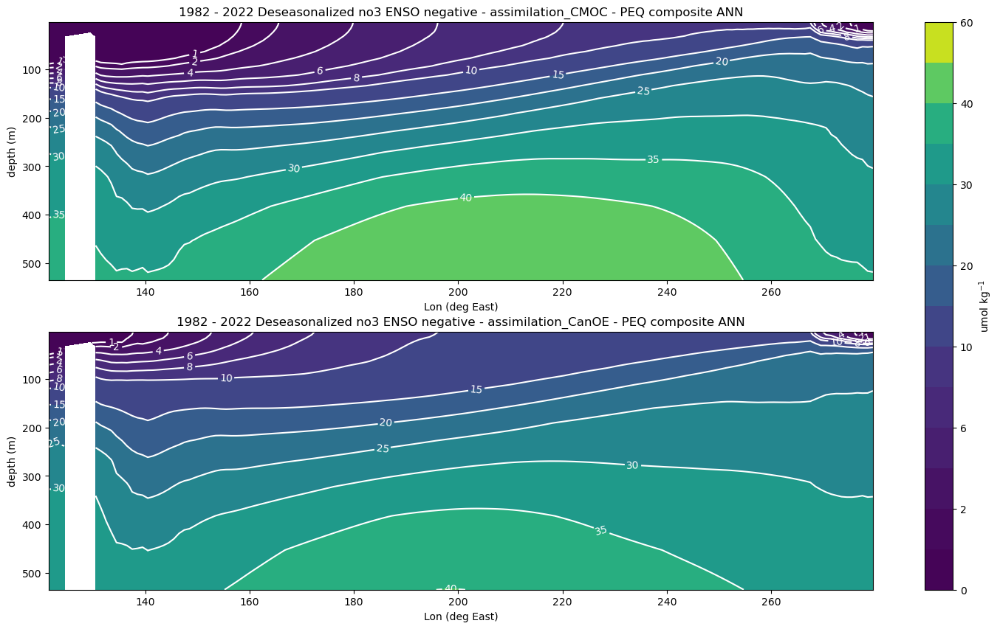

In [88]:
ds_dicts = data_dicts_LANI_no3
monthly_res = True
ds_list = ['assimilation_CMOC','assimilation_CanOE']
figsize = (18,10)
title = f'{(y0_show)} - {(y1_show)} Deseasonalized no3 ENSO negative'
lev_range = 600
yeartoplot = list(dict_anom_snaps_clim_removed_chl['PEQ']['assimilation_CMOC'].year.values)
bms_label = 'PEQ'

snapshot_depth_vs_lon(ds_list,
                            ds_dicts,
                            bms_label,
                            yeartoplot,
            title=title,
            figsize=figsize,
            contour_levels = [0, 1,2,4,6, 8,10,15,20,25,30,35,40,50,60],
            colorbar_label = units_no3, 
            season = 'ANN',
            lev_range = lev_range,
            show=True)

##### El Nino

JFM:[0, 1, 2]
AMJ:[3, 4, 5]
JAS:[6, 7, 8]
OND:[9, 10, 11]
ANN:[ 0  1  2  3  4  5  6  7  8  9 10 11]


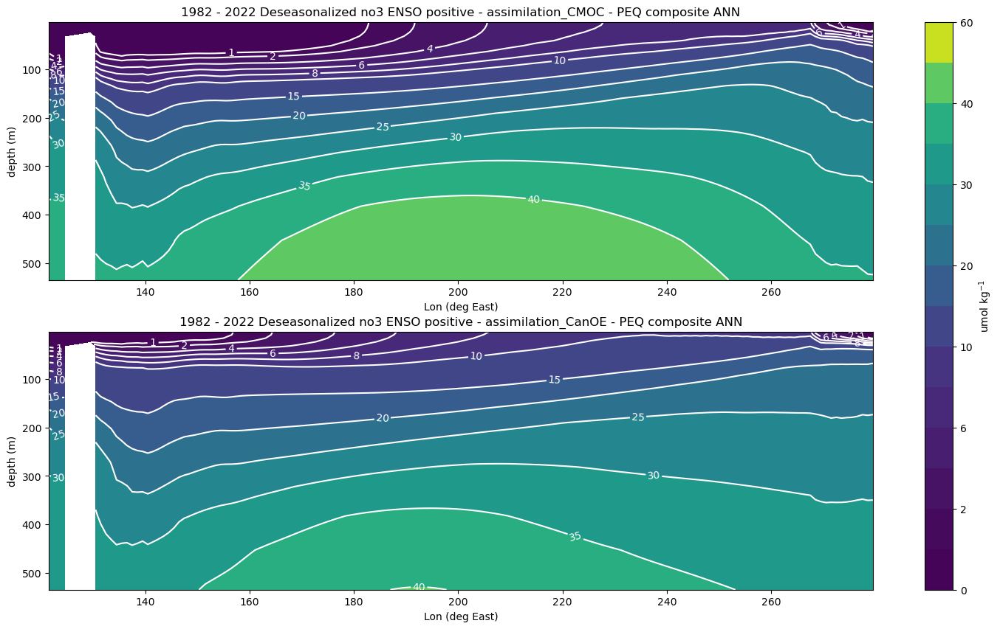

In [90]:
ds_dicts = data_dicts_ELNI_no3
monthly_res = True
ds_list = ['assimilation_CMOC','assimilation_CanOE']
figsize = (18,10)
title = f'{(y0_show)} - {(y1_show)} Deseasonalized no3 ENSO positive'
lev_range = 600
yeartoplot = list(dict_anom_snaps_clim_removed_chl['PEQ']['assimilation_CMOC'].year.values)
bms_label = 'PEQ'

snapshot_depth_vs_lon(ds_list,
                            ds_dicts,
                            bms_label,
                            yeartoplot,
            title=title,
            figsize=figsize,
            contour_levels = [0, 1,2,4,6, 8,10,15,20,25,30,35,40,50,60],
            colorbar_label = units_no3, 
            season = 'ANN',
            lev_range = lev_range,
            show=True)

##### diff

JFM:[0, 1, 2]
AMJ:[3, 4, 5]
JAS:[6, 7, 8]
OND:[9, 10, 11]
ANN:[ 0  1  2  3  4  5  6  7  8  9 10 11]


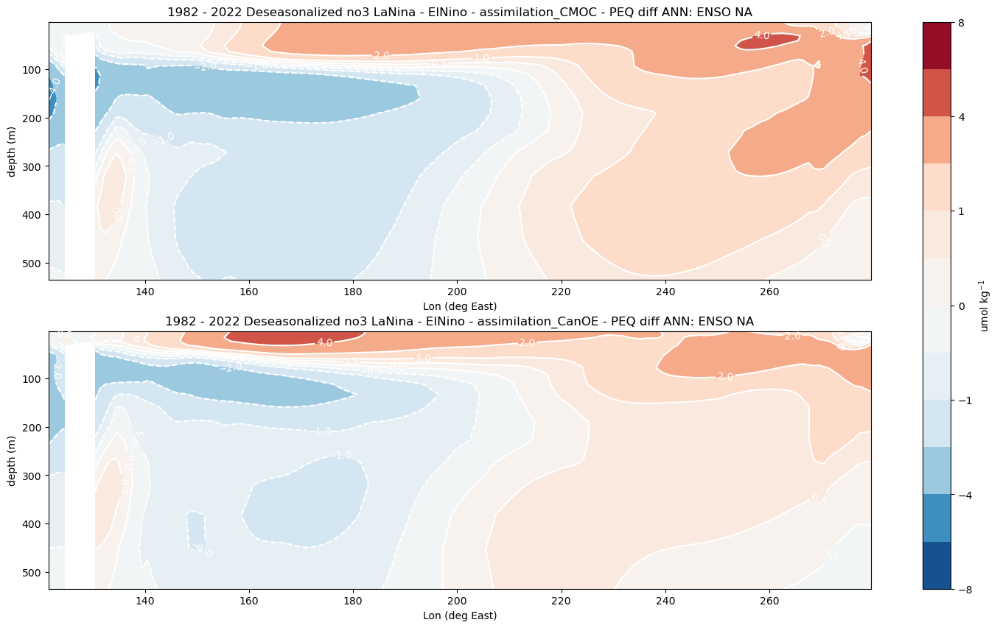

In [93]:
ds_dicts = data_dicts_diff_no3
ds_list = ['assimilation_CMOC','assimilation_CanOE']
figsize = (18,10)
title = f'{y0_show} - {y1_show} Deseasonalized no3 LaNina - ElNino'
lev_range = 600
yeartoplot = ['diff']
bms_label = 'PEQ'

snapshot_depth_vs_lon(ds_list,
                            ds_dicts,
                            bms_label,
                            yeartoplot,
            title=title,
            figsize=figsize,
            contour_levels = [-8,-6,-4,-2,-1,-0.5,0,0.5, 1,2,4,6, 8],
            cmap = 'RdBu_r',
            colorbar_label = units_no3, 
            season = 'ANN',
            lev_range = lev_range,
            show=True)

#### compare climatology of assim vs hist

In [46]:

for var in var_list:
    for region in ['PEQ', 'AEQ']:
        for ds in ['obs','assimilation_CMOC', 'assimilation_CanOE', 'historical_CMOC', 'historical_CanOE']:
            try:
                dict_profile_EQ[var][region][ds]['lon'] = np.mod(dict_profile_EQ[var][region][ds]['lon'] + 360,360)
                dict_profile_EQ[var][region][ds] = dict_profile_EQ[var][region][ds].sortby('lon')
            except:
                print(f'{ds} fpr {var} non-existent!')




dict_profile_EQ_diff = {}
for var in var_list:
    dict_profile_EQ_diff[var] = {}
    for region in ['PEQ', 'AEQ']:
        dict_profile_EQ_diff[var][region] = {}

        dict_profile_EQ_diff[var][region]['assimilation_CMOC - historical_CMOC'] = dict_profile_EQ[var][region]['assimilation_CMOC'] - dict_profile_EQ[var][region]['historical_CMOC']
        dict_profile_EQ_diff[var][region]['assimilation_CanOE - historical_CanOE'] = dict_profile_EQ[var][region]['assimilation_CanOE'] - dict_profile_EQ[var][region]['historical_CanOE']
        try:
            dict_profile_EQ_diff[var][region]['assimilation_CMOC - obs'] = dict_profile_EQ[var][region]['assimilation_CMOC'] - dict_profile_EQ[var][region]['obs']
            dict_profile_EQ_diff[var][region]['historical_CMOC - obs'] = dict_profile_EQ[var][region]['historical_CMOC'] - dict_profile_EQ[var][region]['obs']
            dict_profile_EQ_diff[var][region]['assimilation_CanOE - obs'] = dict_profile_EQ[var][region]['assimilation_CanOE'] - dict_profile_EQ[var][region]['obs']
            dict_profile_EQ_diff[var][region]['historical_CanOE - obs'] = dict_profile_EQ[var][region]['historical_CanOE'] - dict_profile_EQ[var][region]['obs']            
        except:
            print(f'obs for {var} non-existent!')
    

obs fpr chl non-existent!
obs fpr chl non-existent!
obs for chl non-existent!
obs for chl non-existent!


JFM:[0, 1, 2]
AMJ:[3, 4, 5]
JAS:[6, 7, 8]
OND:[9, 10, 11]
ANN:[ 0  1  2  3  4  5  6  7  8  9 10 11]


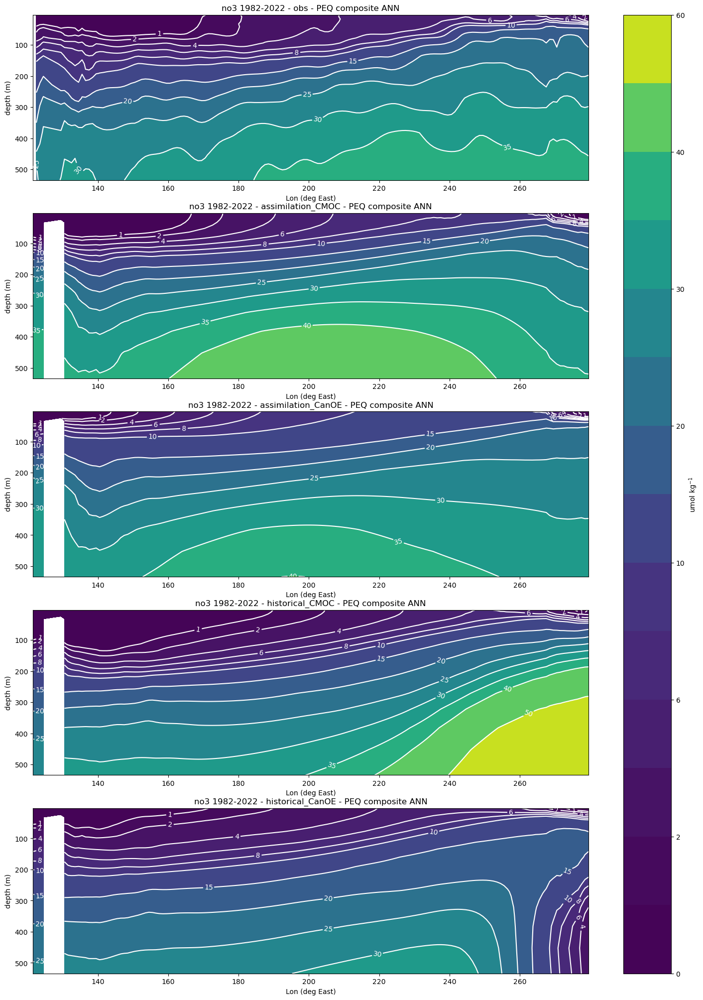

In [64]:

monthly_res = True
ds_list = ['obs','assimilation_CMOC', 'assimilation_CanOE','historical_CMOC','historical_CanOE']
figsize = (18,25)

lev_range = 600
yeartoplot = list(dict_anom_snaps_clim_removed['no3']['PEQ']['assimilation_CMOC'].year.values)
bms_label = 'PEQ'

plot_dict = dict(dict = dict_profile_EQ['no3'], unit =  units_dics['no3'], contour_levels = [0, 1,2,4,6, 8,10,15,20,25,30,35,40,50,60])


ds_dicts = plot_dict['dict']
title = f'no3 {y0_show}-{y1_show}'
units = plot_dict['unit']
contour_levels = plot_dict['contour_levels']
lev_interp = ddata_em_after['no3']['historical_CMOC'].lev

snapshot_depth_vs_lon(ds_list,
                            ds_dicts,
                            bms_label,
                            yeartoplot,
            title=title,
            figsize=figsize,
            contour_levels = contour_levels,
            # cmap = 'RdBu_r',
            colorbar_label = units, 
            season = 'ANN',
            lev_range = lev_range,
            lev_interp = lev_interp,
            show=True)



JFM:[0, 1, 2]
AMJ:[3, 4, 5]
JAS:[6, 7, 8]
OND:[9, 10, 11]
ANN:[ 0  1  2  3  4  5  6  7  8  9 10 11]


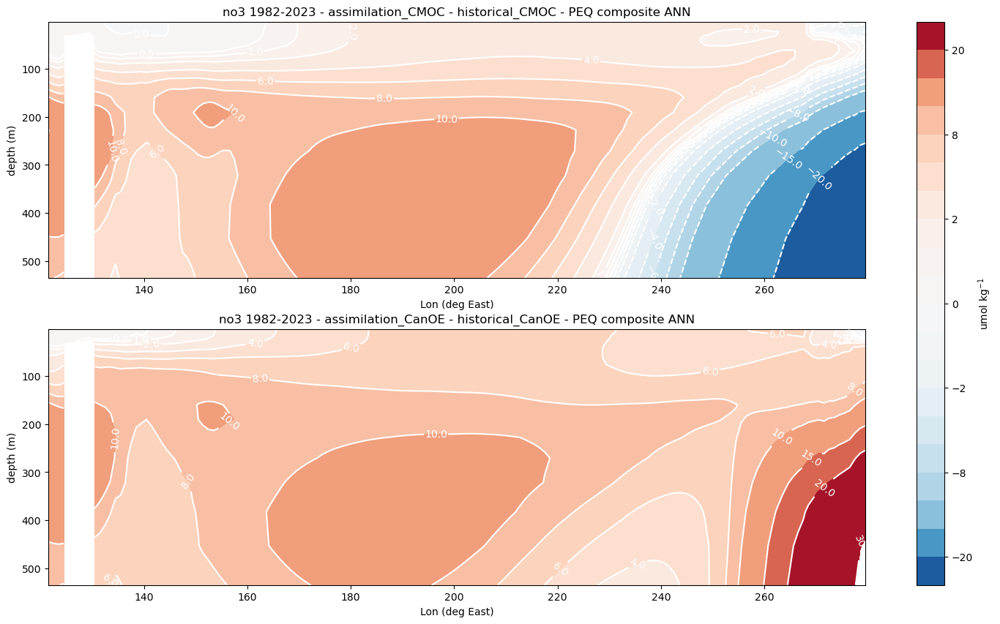

In [97]:

monthly_res = True
ds_list = ['assimilation_CMOC - historical_CMOC', 'assimilation_CanOE - historical_CanOE']
figsize = (18,10)

lev_range = 600
yeartoplot = list(dict_anom_snaps_clim_removed['no3']['PEQ']['assimilation_CMOC'].year.values)
bms_label = 'PEQ'

plot_dict = dict(dict = dict_profile_EQ_diff['no3'], unit =  units['no3'], contour_levels = [-30,-20,-15,-10,-8,-6,-4,-2,-1,-0.5,0,0.5, 1,2,4,6, 8,10,15,20,30] )


ds_dicts = plot_dict['dict']
title = f'no3 {y0_show}-{y1_show}'
units = plot_dict['unit']
contour_levels = plot_dict['contour_levels']


snapshot_depth_vs_lon(ds_list,
                            ds_dicts,
                            bms_label,
                            yeartoplot,
            title=title,
            figsize=figsize,
            contour_levels = contour_levels,
            cmap = 'RdBu_r',
            colorbar_label = units, 
            season = 'ANN',
            lev_range = lev_range,
            show=True)



JFM:[0, 1, 2]
AMJ:[3, 4, 5]
JAS:[6, 7, 8]
OND:[9, 10, 11]
ANN:[ 0  1  2  3  4  5  6  7  8  9 10 11]


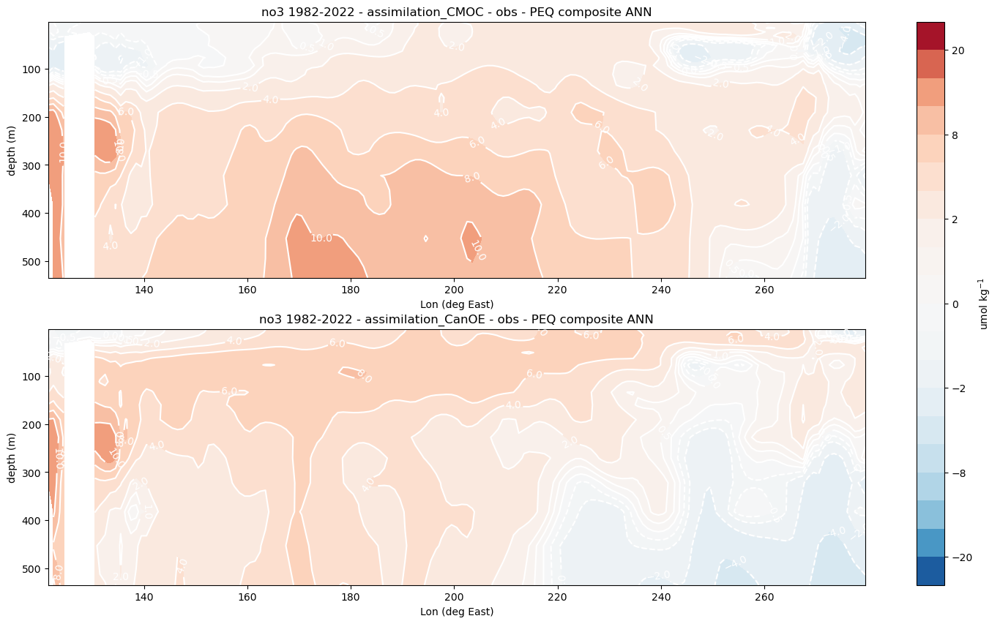

In [39]:

monthly_res = True
ds_list = ['assimilation_CMOC - obs', 'assimilation_CanOE - obs']
figsize = (18,10)

lev_range = 600
yeartoplot = list(dict_anom_snaps_clim_removed['no3']['PEQ']['assimilation_CMOC'].year.values)
bms_label = 'PEQ'

plot_dict = dict(dict = dict_profile_EQ_diff['no3'], unit =  units['no3'], contour_levels = [-30,-20,-15,-10,-8,-6,-4,-2,-1,-0.5,0,0.5, 1,2,4,6, 8,10,15,20,30] )


ds_dicts = plot_dict['dict']
title = f'no3 {y0_show}-{y1_show}'
units = plot_dict['unit']
contour_levels = plot_dict['contour_levels']


snapshot_depth_vs_lon(ds_list,
                            ds_dicts,
                            bms_label,
                            yeartoplot,
            title=title,
            figsize=figsize,
            contour_levels = contour_levels,
            cmap = 'RdBu_r',
            colorbar_label = units, 
            season = 'ANN',
            lev_range = lev_range,
            show=True)



JFM:[0, 1, 2]
AMJ:[3, 4, 5]
JAS:[6, 7, 8]
OND:[9, 10, 11]
ANN:[ 0  1  2  3  4  5  6  7  8  9 10 11]


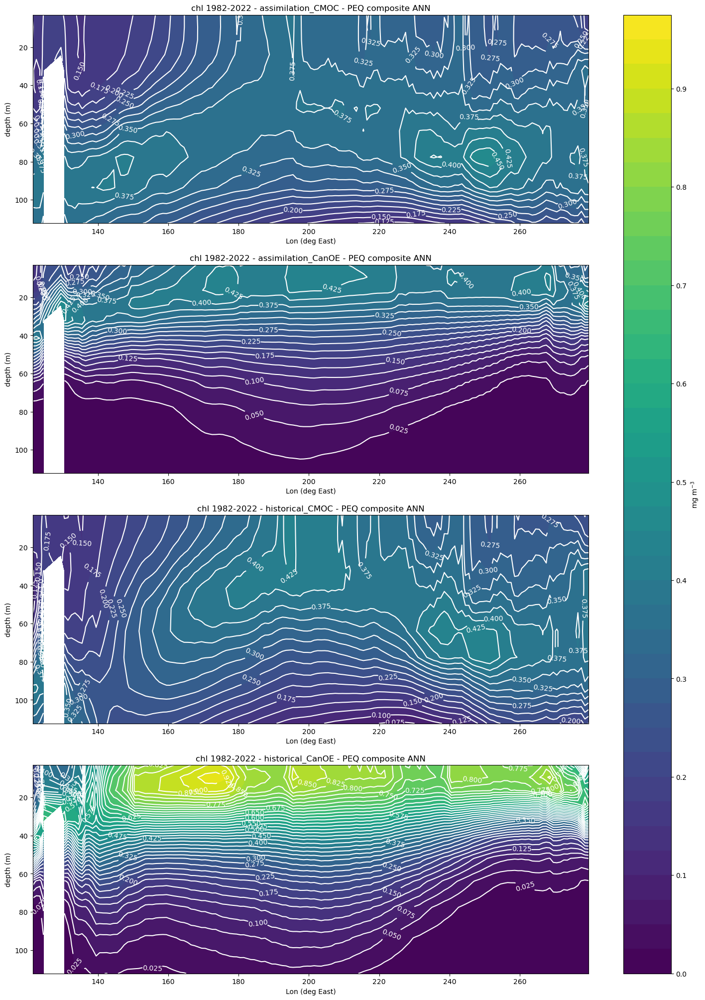

In [61]:

monthly_res = True
ds_list = ['assimilation_CMOC', 'assimilation_CanOE','historical_CMOC','historical_CanOE']
figsize = (18,25)

lev_range = [0,120]
yeartoplot = list(dict_anom_snaps_clim_removed['chl']['PEQ']['assimilation_CMOC'].year.values)
bms_label = 'PEQ'

plot_dict = dict(dict = dict_profile_EQ['chl'], unit =  units['chl'], contour_levels = np.arange(0,1,0.025))


ds_dicts = plot_dict['dict']
title = f'chl {y0_show}-{y1_show}'
unit = plot_dict['unit']
contour_levels = plot_dict['contour_levels']
lev_interp = ddata_em_after['no3']['historical_CMOC'].lev

snapshot_depth_vs_lon(ds_list,
                            ds_dicts,
                            bms_label,
                            yeartoplot,
            title=title,
            figsize=figsize,
            contour_levels = contour_levels,
            # cmap = 'RdBu_r',
            colorbar_label = unit, 
            season = 'ANN',
            lev_range = lev_range,
            lev_interp = lev_interp,
            show=True)



## Arial view

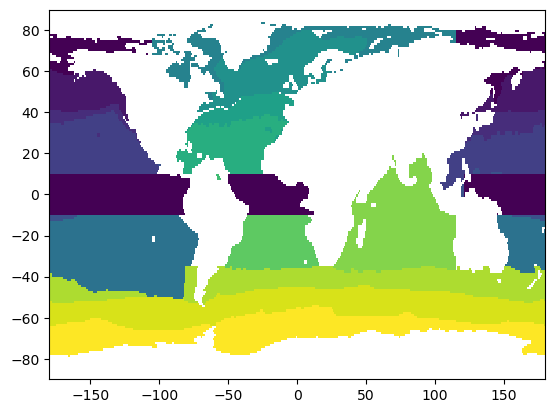

In [49]:

plt.pcolormesh(biomes.MeanBiomes.lon, biomes.MeanBiomes.lat, biomes.MeanBiomes.values)

PEQ = biomes.MeanBiomes.where((biomes.MeanBiomes.lat>= -10) & (biomes.MeanBiomes.lat <= 10))
PEQ = PEQ.where( (PEQ.lon <= -59) | (PEQ.lon >= 121))
PEQ = PEQ.where(np.isnan(PEQ), 1)

PEQ_E = PEQ.where(PEQ.lon<0)
PEQ_W = PEQ.where(PEQ.lon>0)

AEQ = biomes.MeanBiomes.where((biomes.MeanBiomes.lat>= -10) & (biomes.MeanBiomes.lat <= 10))
AEQ = AEQ.where( (AEQ.lon >= -55) & (AEQ.lon <= 20))
AEQ = AEQ.where(np.isnan(AEQ), 1)

plt.pcolormesh(PEQ.lon, PEQ.lat, PEQ.values)
plt.pcolormesh(AEQ.lon, AEQ.lat, AEQ.values)

mask_EQ = { 'PEQ' : PEQ.where(~np.isnan(PEQ),0), 'AEQ' : AEQ.where(~np.isnan(AEQ),0), 'PEQ_E' : PEQ_E.where(~np.isnan(PEQ_E),0), 'PEQ_W' : PEQ_W.where(~np.isnan(PEQ_W),0)}

In [50]:
from module_plot_maps import snapshot_depth_vs_lon

dict_profile_EQ = {}
dict_clim_mean_removed = {}
dict_anom_snaps_clim_removed = {}

for var in var_list:
    dict_profile_EQ[var] = {}
    dict_clim_mean_removed[var] = {}
    dict_anom_snaps_clim_removed[var] = {}

    for region in ['PEQ','AEQ']:
        dict_profile_EQ[var][region] = {}
        dict_clim_mean_removed[var][region] = {}
        dict_anom_snaps_clim_removed[var][region] = {}


        for ds in ['obs','historical_CMOC', 'historical_CanOE', 'assimilation_CanOE','assimilation_CMOC']:
            try:
                dict_profile_EQ[var][region][ds] = dict_profile_EQ_REF[var][region][ds].where(mask_EQ[region] == 1, drop = True)                  
                dict_clim_mean_removed[var][region][ds] = dict_clim_mean_removed_REF[var][region][ds].where(mask_EQ[region] == 1, drop = True)
                dict_anom_snaps_clim_removed[var][region][ds] = dict_anom_snaps_clim_removed_REF[var][region][ds].where(mask_EQ[region] == 1, drop = True)


                if region == 'PEQ':

                    dict_anom_snaps_clim_removed[var][region][ds]['lon'] = np.mod(dict_anom_snaps_clim_removed[var][region][ds]['lon'] + 360,360)
                    dict_anom_snaps_clim_removed[var][region][ds] = dict_anom_snaps_clim_removed[var][region][ds].sortby('lon')
            except:
                print(f'{ds} for {var} non-existent!')



In [51]:
data_dicts_LANI = {}
data_dicts_ELNI = {}

for var in var_list:

    data_dicts_LANI[var] = {}
    data_dicts_ELNI[var] = {}

    for bm in dict_anom_snaps_clim_removed[var].keys():
        data_dicts_LANI[var][bm] = {}
        data_dicts_ELNI[var][bm] = {}


        for ds in dict_anom_snaps_clim_removed[var][bm].keys():
            if 'historical' in ds:
                data_dicts_LANI[var][bm][ds] = dict_anom_snaps_clim_removed[var][bm][ds].where(ONI_sim<=np.quantile(ONI_sim,0.25))
                data_dicts_ELNI[var][bm][ds] = dict_anom_snaps_clim_removed[var][bm][ds].where(ONI_sim>=np.quantile(ONI_sim,0.75))
            
            else:
                data_dicts_LANI[var][bm][ds] = dict_anom_snaps_clim_removed[var][bm][ds].where(ONI_assim<=np.quantile(ONI_assim,0.25))
                data_dicts_ELNI[var][bm][ds] = dict_anom_snaps_clim_removed[var][bm][ds].where(ONI_assim>=np.quantile(ONI_assim,0.75))

data_dicts_diff = {}

for var in var_list:
    data_dicts_diff[var] = {}

    for bm in dict_anom_snaps_clim_removed[var].keys():
        data_dicts_diff[var][bm] = {}
        for ds in dict_anom_snaps_clim_removed[var][bm].keys():
                data_dicts_diff[var][bm][ds] = (data_dicts_LANI[var][bm][ds].mean('year') - data_dicts_ELNI[var][bm][ds].mean('year')).expand_dims('year', axis = 0).assign_coords(year = ['diff'])
 

In [ ]:
for var in var_list:
    for region in ['PEQ', 'AEQ']:
        for ds in ['obs','historical_CMOC', 'historical_CanOE', 'assimilation_CanOE','assimilation_CMOC']:
            try:
                dict_profile_EQ[var][region][ds]['lon'] = np.mod(dict_profile_EQ[var][region][ds]['lon'] + 360,360)
                dict_profile_EQ[var][region][ds] = dict_profile_EQ[var][region][ds].sortby('lon')
            except:
                print(f'{ds} for {var} non-existent!')

#### historical

#### La Nina

##### surface

JFM:[0, 1, 2]
AMJ:[3, 4, 5]
JAS:[6, 7, 8]
OND:[9, 10, 11]
ANN:[ 0  1  2  3  4  5  6  7  8  9 10 11]


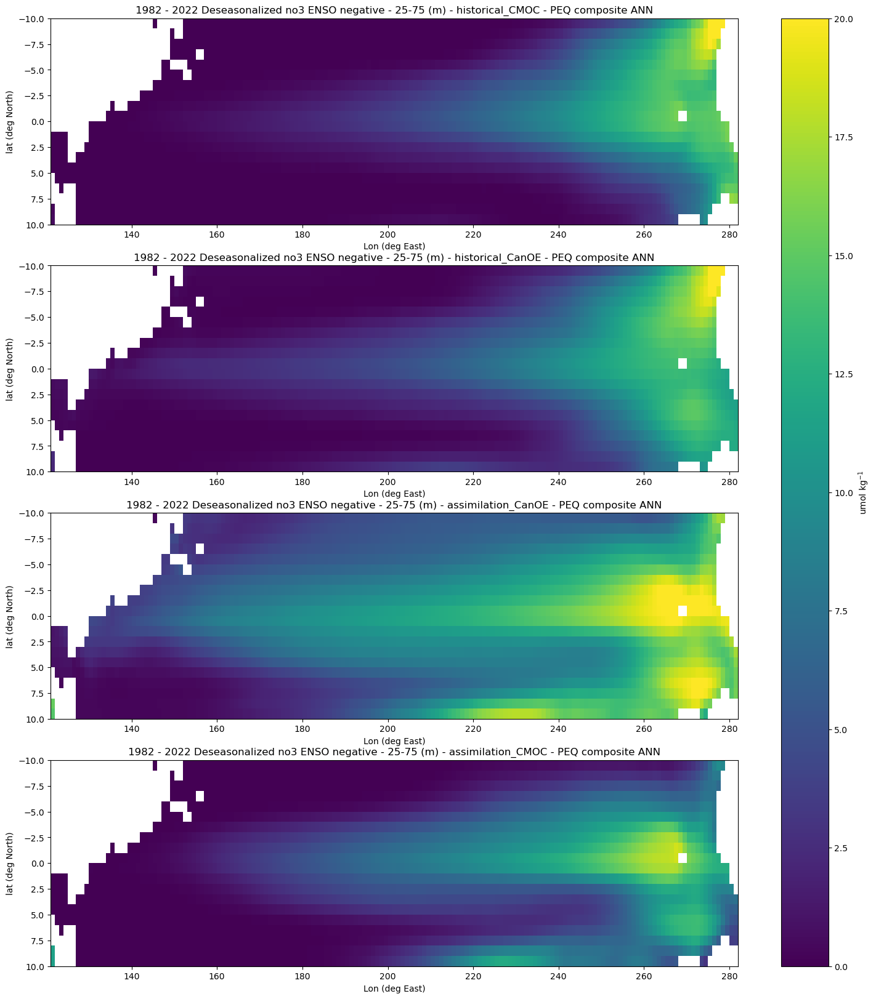

In [55]:
ds_dicts = data_dicts_LANI_no3
monthly_res = True
ds_list = ['historical_CMOC','historical_CanOE', 'assimilation_CanOE',  'assimilation_CMOC']
figsize = (18,20)
title = f'{y0_show} - {y1_show} Deseasonalized no3 ENSO negative'
lev_range = [25,75]
yeartoplot = list(dict_anom_snaps_clim_removed_chl['PEQ']['assimilation_CMOC'].year.values)
bms_label = 'PEQ'

snapshot_arial(ds_list,
                            ds_dicts,
                            bms_label,
                            yeartoplot,
            title=title,
            vmax = 20,
            vmin = 0,
            figsize=figsize,
            colorbar_label = units_no3, 
            season = 'ANN',
            lev_range = lev_range,
            show=True)





##### depth

JFM:[0, 1, 2]
AMJ:[3, 4, 5]
JAS:[6, 7, 8]
OND:[9, 10, 11]
ANN:[ 0  1  2  3  4  5  6  7  8  9 10 11]


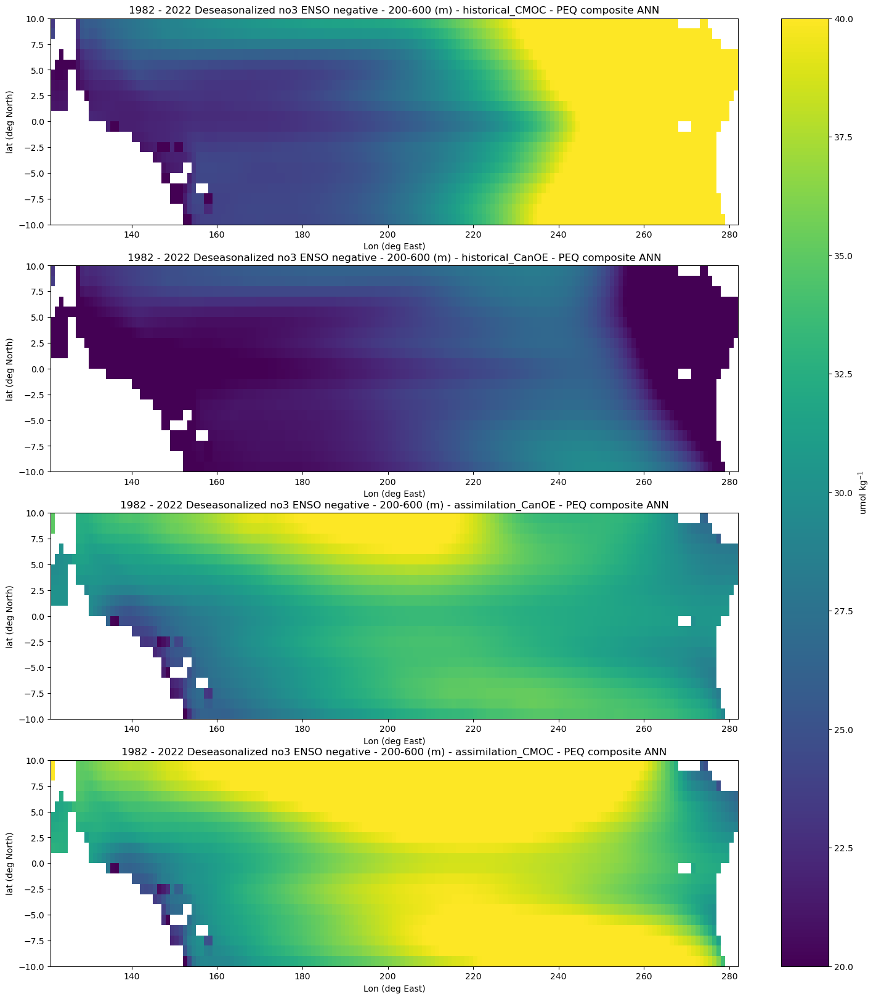

In [103]:
ds_dicts = data_dicts_LANI_no3
monthly_res = True
ds_list = ['historical_CMOC','historical_CanOE', 'assimilation_CanOE',  'assimilation_CMOC']
figsize = (18,20)
title = f'{y0_show} - {y1_show} Deseasonalized no3 ENSO negative'
lev_range = [200,600]
yeartoplot = list(dict_anom_snaps_clim_removed_chl['PEQ']['assimilation_CMOC'].year.values)
bms_label = 'PEQ'

snapshot_arial(ds_list,
                            ds_dicts,
                            bms_label,
                            yeartoplot,
            title=title,
            vmax = 40,
            vmin = 20,
            figsize=figsize,
            colorbar_label = units_no3, 
            season = 'ANN',
            lev_range = lev_range,
            show=True)





#### El Nino

##### surface

JFM:[0, 1, 2]
AMJ:[3, 4, 5]
JAS:[6, 7, 8]
OND:[9, 10, 11]
ANN:[ 0  1  2  3  4  5  6  7  8  9 10 11]


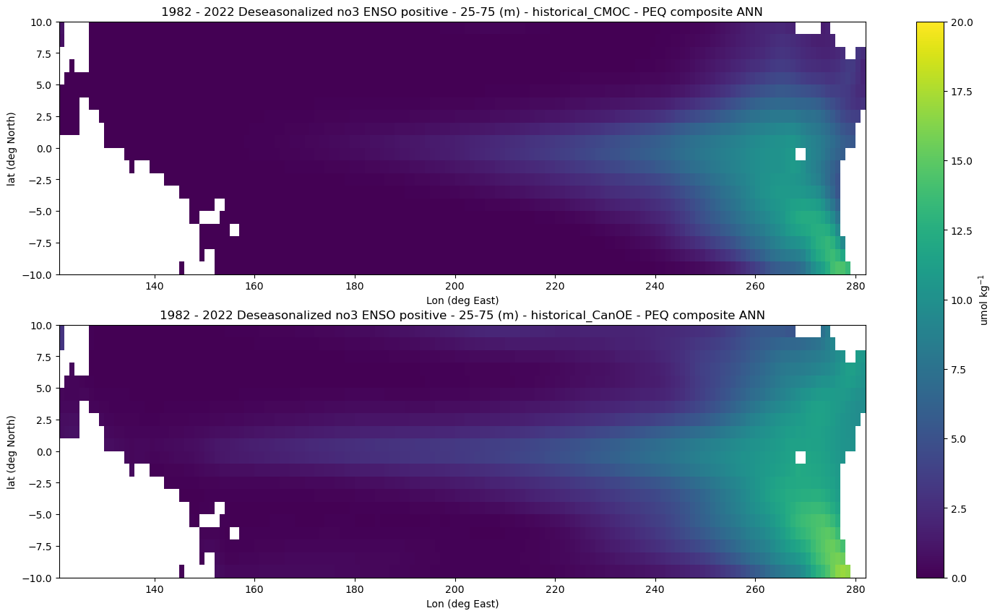

In [110]:
ds_dicts = data_dicts_ELNI_no3
monthly_res = True
ds_list = ['historical_CMOC','historical_CanOE']
figsize = (18,10)
title = f'{y0_show} - {y1_show} Deseasonalized no3 ENSO positive'
lev_range = [25,75]
yeartoplot = list(dict_anom_snaps_clim_removed_chl['PEQ']['assimilation_CMOC'].year.values)
bms_label = 'PEQ'

snapshot_arial(ds_list,
                            ds_dicts,
                            bms_label,
                            yeartoplot,
            title=title,
            vmax = 20,
            vmin = 0,
            figsize=figsize,
            colorbar_label = units_no3, 
            season = 'ANN',
            lev_range = lev_range,
            show=True)





##### depth

JFM:[0, 1, 2]
AMJ:[3, 4, 5]
JAS:[6, 7, 8]
OND:[9, 10, 11]
ANN:[ 0  1  2  3  4  5  6  7  8  9 10 11]


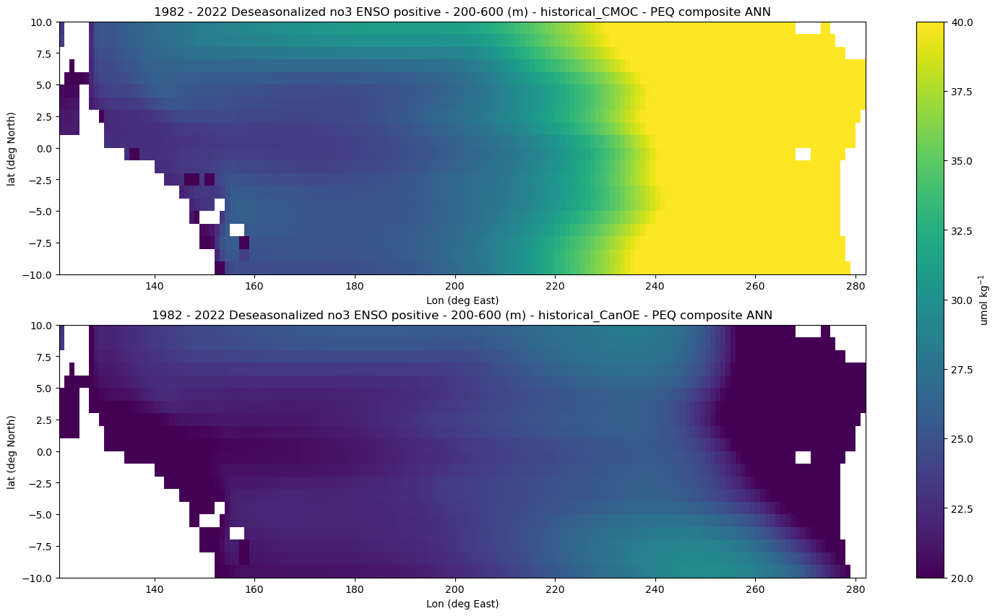

In [109]:
ds_dicts = data_dicts_ELNI_no3
monthly_res = True
ds_list = ['historical_CMOC','historical_CanOE']
figsize = (18,10)
title = f'{y0_show} - {y1_show} Deseasonalized no3 ENSO positive'
lev_range = [200,600]
yeartoplot = list(dict_anom_snaps_clim_removed_chl['PEQ']['assimilation_CMOC'].year.values)
bms_label = 'PEQ'

snapshot_arial(ds_list,
                            ds_dicts,
                            bms_label,
                            yeartoplot,
            title=title,
            vmax = 40,
            vmin = 20,
            figsize=figsize,
            colorbar_label = units_no3, 
            season = 'ANN',
            lev_range = lev_range,
            show=True)





#### diff

##### surface

JFM:[0, 1, 2]
AMJ:[3, 4, 5]
JAS:[6, 7, 8]
OND:[9, 10, 11]
ANN:[ 0  1  2  3  4  5  6  7  8  9 10 11]


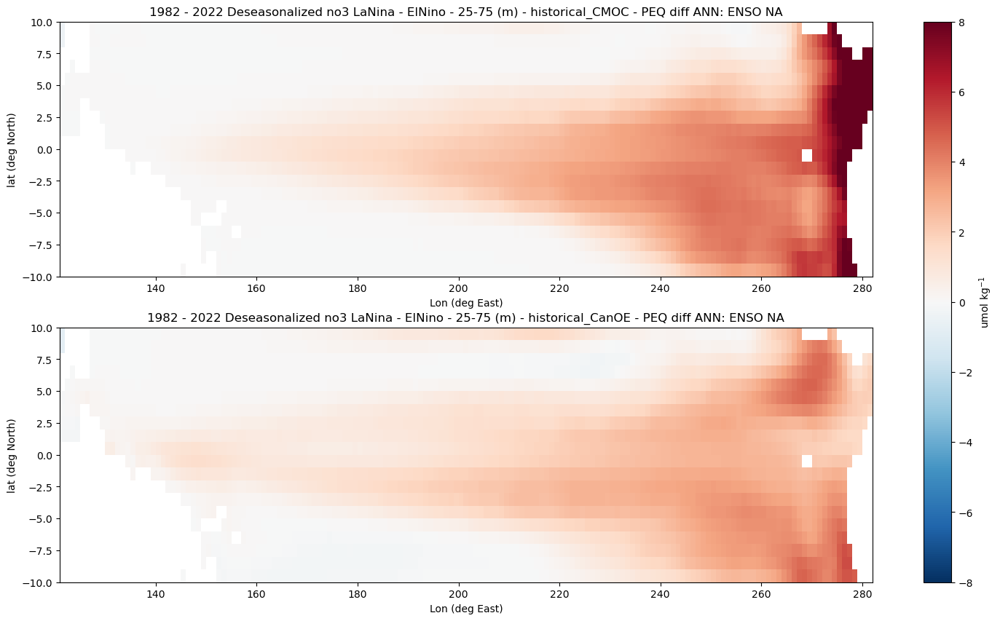

In [111]:
ds_dicts = data_dicts_diff_no3
monthly_res = True
ds_list = ['historical_CMOC','historical_CanOE']
figsize = (18,10)
title = f'{y0_show} - {y1_show} Deseasonalized no3 LaNina - ElNino'
lev_range = [25,75]
yeartoplot = ['diff']
bms_label = 'PEQ'

snapshot_arial(ds_list,
                            ds_dicts,
                            bms_label,
                            yeartoplot,
            title=title,
            vmax = 8,
            vmin = -8,
            cmap = 'RdBu_r',
            figsize=figsize,
            colorbar_label = units_no3, 
            season = 'ANN',
            lev_range = lev_range,
            show=True)





##### depth

JFM:[0, 1, 2]
AMJ:[3, 4, 5]
JAS:[6, 7, 8]
OND:[9, 10, 11]
ANN:[ 0  1  2  3  4  5  6  7  8  9 10 11]


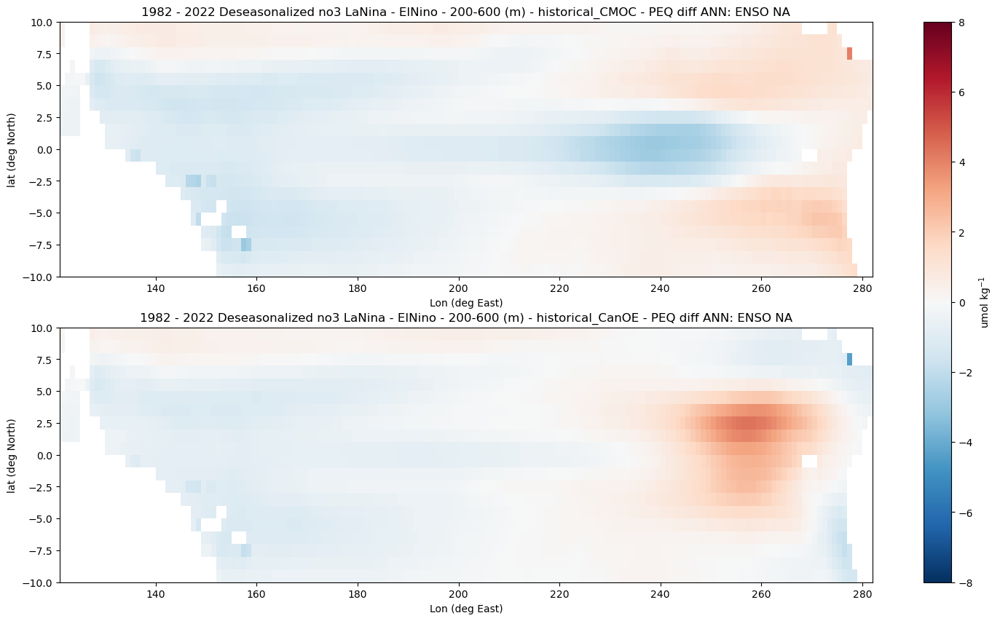

In [ ]:
ds_dicts = data_dicts_diff_no3
monthly_res = True
ds_list = ['historical_CMOC','historical_CanOE']
figsize = (18,10)
title = f'{y0_show} - {y1_show} Deseasonalized no3 LaNina - ElNino'
lev_range = [200,600]
yeartoplot = ['diff']
bms_label = 'PEQ'

snapshot_arial(ds_list,
                            ds_dicts,
                            bms_label,
                            yeartoplot,
            title=title,
            vmax = 8,
            vmin = -8,
            cmap = 'RdBu_r',
            figsize=figsize,
            colorbar_label = units_no3, 
            season = 'ANN',
            lev_range = lev_range,
            show=True)





#### Assimilation

#### La Nina

##### surface

JFM:[0, 1, 2]
AMJ:[3, 4, 5]
JAS:[6, 7, 8]
OND:[9, 10, 11]
ANN:[ 0  1  2  3  4  5  6  7  8  9 10 11]


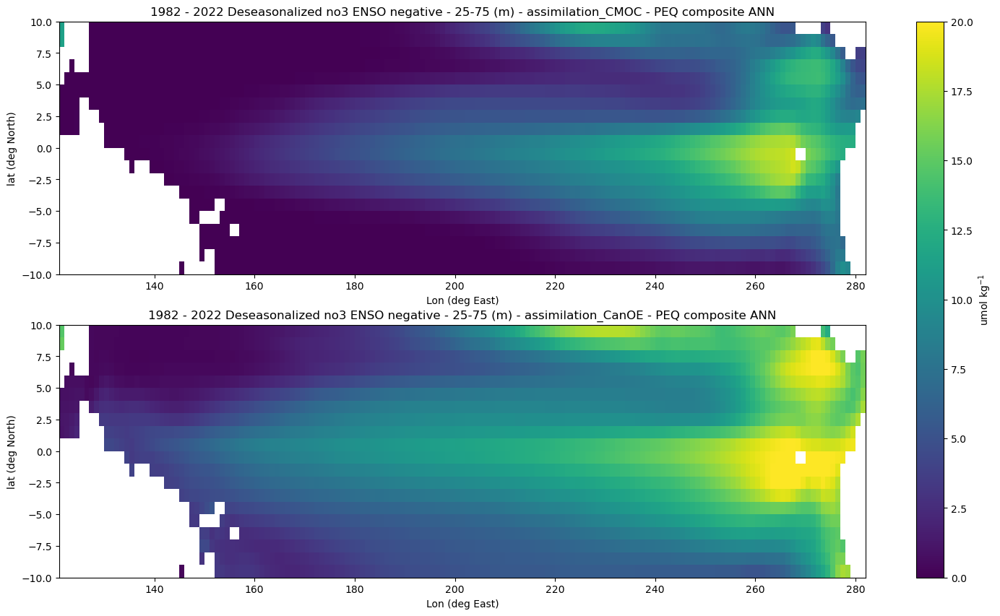

In [115]:

ds_dicts = data_dicts_LANI_no3
monthly_res = True
ds_list = ['assimilation_CMOC','assimilation_CanOE']
figsize = (18,10)
title = f'{y0_show} - {y1_show} Deseasonalized no3 ENSO negative'
lev_range = [25,75]
yeartoplot = list(dict_anom_snaps_clim_removed_chl['PEQ']['assimilation_CMOC'].year.values)
bms_label = 'PEQ'

snapshot_arial(ds_list,
                            ds_dicts,
                            bms_label,
                            yeartoplot,
            title=title,
            vmax = 20,
            vmin = 0,
            figsize=figsize,
            colorbar_label = units_no3, 
            season = 'ANN',
            lev_range = lev_range,
            show=True)





##### depth

JFM:[0, 1, 2]
AMJ:[3, 4, 5]
JAS:[6, 7, 8]
OND:[9, 10, 11]
ANN:[ 0  1  2  3  4  5  6  7  8  9 10 11]


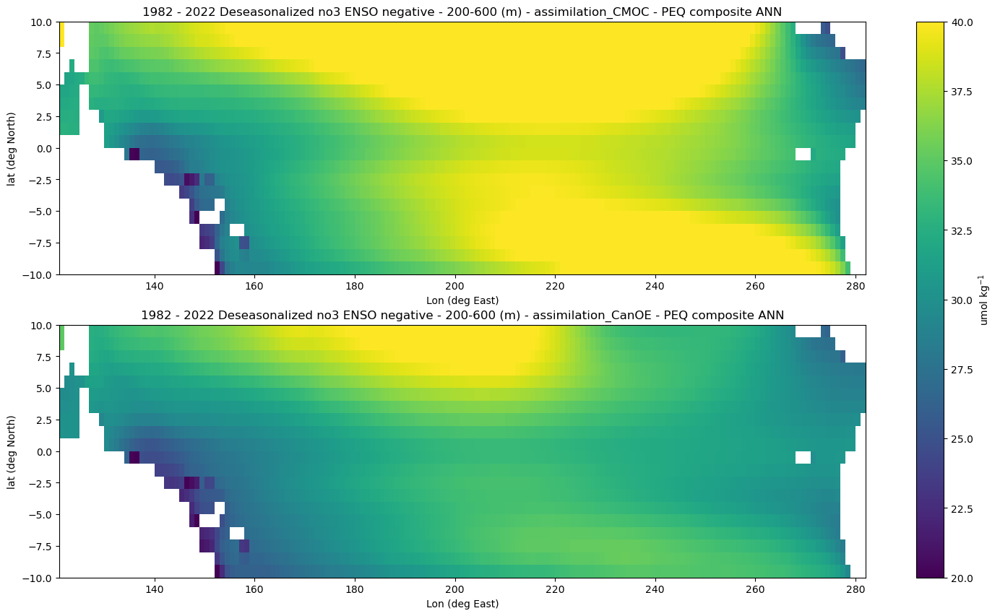

In [116]:

ds_dicts = data_dicts_LANI_no3
monthly_res = True
ds_list = ['assimilation_CMOC','assimilation_CanOE']
figsize = (18,10)
title = f'{y0_show} - {y1_show} Deseasonalized no3 ENSO negative'
lev_range = [200,600]
yeartoplot = list(dict_anom_snaps_clim_removed_chl['PEQ']['assimilation_CMOC'].year.values)
bms_label = 'PEQ'

snapshot_arial(ds_list,
                            ds_dicts,
                            bms_label,
                            yeartoplot,
            title=title,
            vmax = 40,
            vmin = 20,
            figsize=figsize,
            colorbar_label = units_no3, 
            season = 'ANN',
            lev_range = lev_range,
            show=True)





#### El Nino

##### surface

JFM:[0, 1, 2]
AMJ:[3, 4, 5]
JAS:[6, 7, 8]
OND:[9, 10, 11]
ANN:[ 0  1  2  3  4  5  6  7  8  9 10 11]


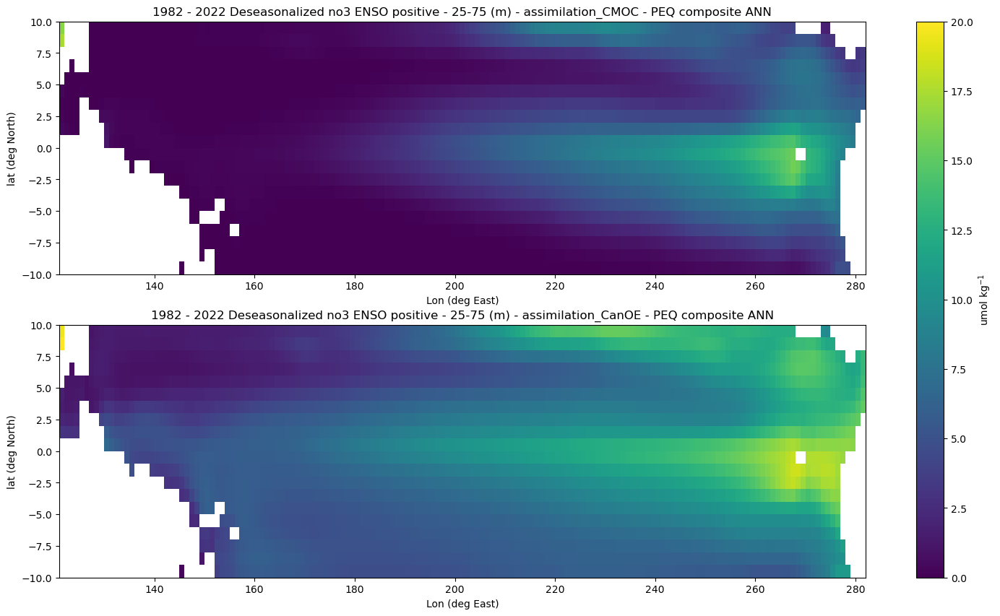

In [117]:

ds_dicts = data_dicts_ELNI_no3
monthly_res = True
ds_list = ['assimilation_CMOC','assimilation_CanOE']
figsize = (18,10)
title = f'{y0_show} - {y1_show} Deseasonalized no3 ENSO positive'
lev_range = [25,75]
yeartoplot = list(dict_anom_snaps_clim_removed_chl['PEQ']['assimilation_CMOC'].year.values)
bms_label = 'PEQ'

snapshot_arial(ds_list,
                            ds_dicts,
                            bms_label,
                            yeartoplot,
            title=title,
            vmax = 20,
            vmin = 0,
            figsize=figsize,
            colorbar_label = units_no3, 
            season = 'ANN',
            lev_range = lev_range,
            show=True)





##### depth

JFM:[0, 1, 2]
AMJ:[3, 4, 5]
JAS:[6, 7, 8]
OND:[9, 10, 11]
ANN:[ 0  1  2  3  4  5  6  7  8  9 10 11]


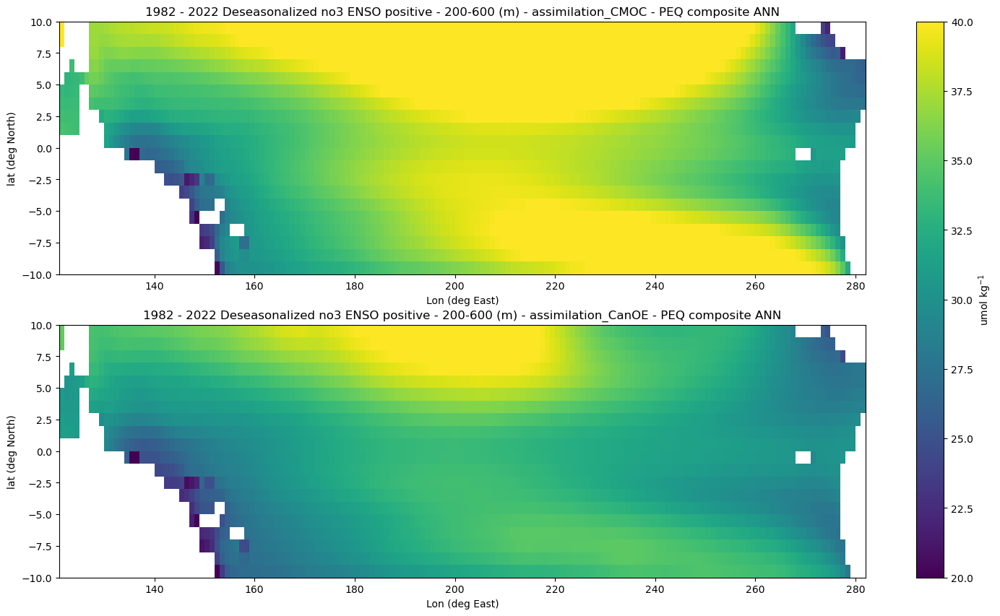

In [118]:

ds_dicts = data_dicts_ELNI_no3
monthly_res = True
ds_list = ['assimilation_CMOC','assimilation_CanOE']
figsize = (18,10)
title = f'{y0_show} - {y1_show} Deseasonalized no3 ENSO positive'
lev_range = [200,600]
yeartoplot = list(dict_anom_snaps_clim_removed_chl['PEQ']['assimilation_CMOC'].year.values)
bms_label = 'PEQ'

snapshot_arial(ds_list,
                            ds_dicts,
                            bms_label,
                            yeartoplot,
            title=title,
            vmax = 40,
            vmin = 20,
            figsize=figsize,
            colorbar_label = units_no3, 
            season = 'ANN',
            lev_range = lev_range,
            show=True)





#### diff

##### surface

JFM:[0, 1, 2]
AMJ:[3, 4, 5]
JAS:[6, 7, 8]
OND:[9, 10, 11]
ANN:[ 0  1  2  3  4  5  6  7  8  9 10 11]


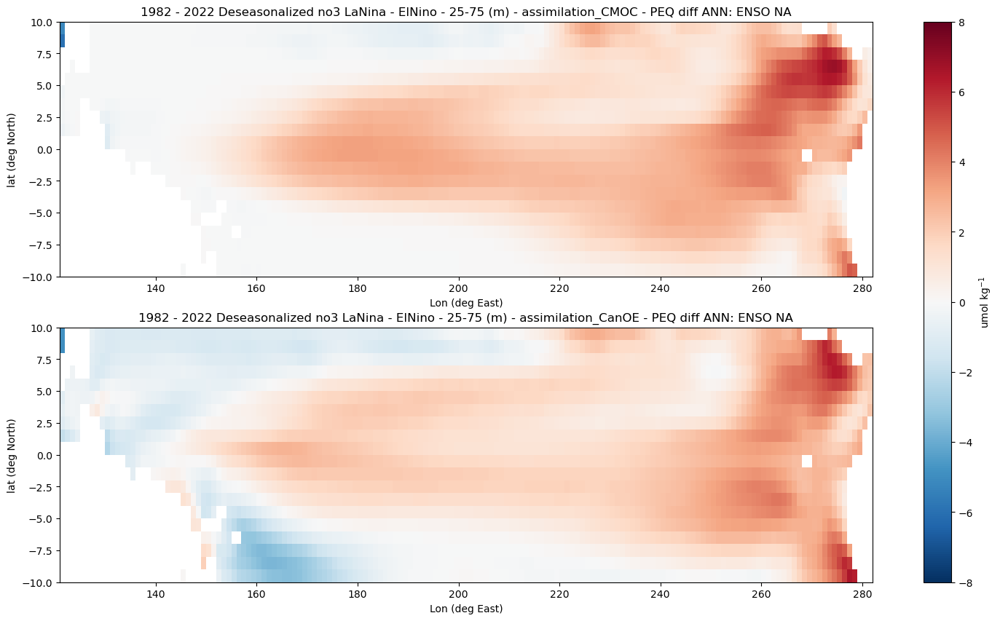

In [119]:
ds_dicts = data_dicts_diff_no3
monthly_res = True
ds_list = ['assimilation_CMOC','assimilation_CanOE']
figsize = (18,10)
title = f'{y0_show} - {y1_show} Deseasonalized no3 LaNina - ElNino'
lev_range = [25,75]
yeartoplot = ['diff']
bms_label = 'PEQ'

snapshot_arial(ds_list,
                            ds_dicts,
                            bms_label,
                            yeartoplot,
            title=title,
            vmax = 8,
            vmin = -8,
            cmap = 'RdBu_r',
            figsize=figsize,
            colorbar_label = units_no3, 
            season = 'ANN',
            lev_range = lev_range,
            show=True)





##### depth

JFM:[0, 1, 2]
AMJ:[3, 4, 5]
JAS:[6, 7, 8]
OND:[9, 10, 11]
ANN:[ 0  1  2  3  4  5  6  7  8  9 10 11]


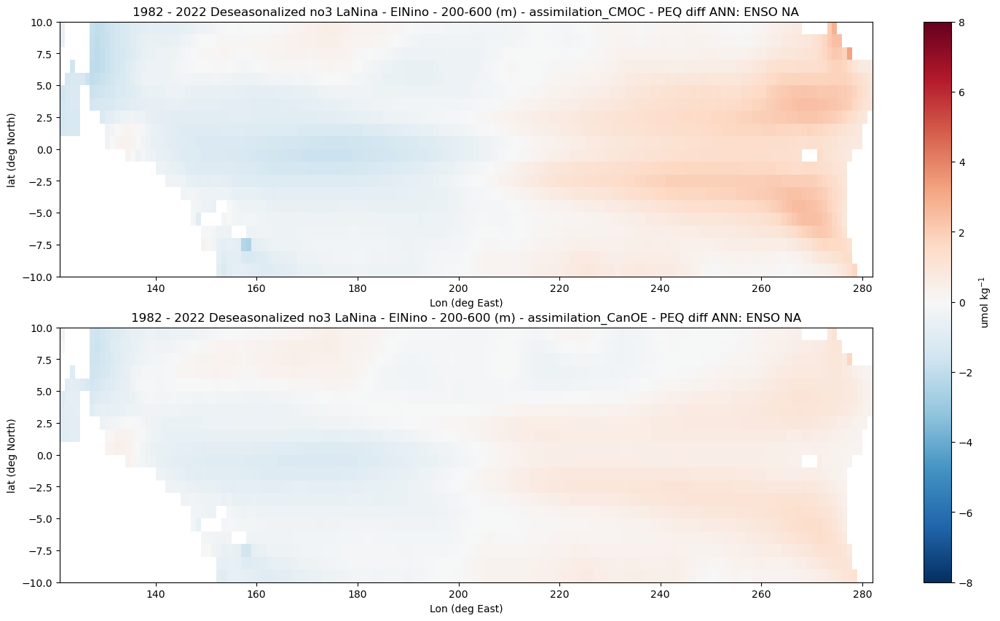

In [120]:
ds_dicts = data_dicts_diff_no3
monthly_res = True
ds_list = ['assimilation_CMOC','assimilation_CanOE']
figsize = (18,10)
title = f'{y0_show} - {y1_show} Deseasonalized no3 LaNina - ElNino'
lev_range = [200,600]
yeartoplot = ['diff']
bms_label = 'PEQ'

snapshot_arial(ds_list,
                            ds_dicts,
                            bms_label,
                            yeartoplot,
            title=title,
            vmax = 8,
            vmin = -8,
            cmap = 'RdBu_r',
            figsize=figsize,
            colorbar_label = units_no3, 
            season = 'ANN',
            lev_range = lev_range,
            show=True)





#### compare climatology of assim vs hist

In [52]:

dict_profile_EQ_diff = {}
for var in var_list:
    dict_profile_EQ_diff[var] = {}
    for region in ['PEQ', 'AEQ']:
        dict_profile_EQ_diff[var][region] = {}

        dict_profile_EQ_diff[var][region]['assimilation_CMOC - historical_CMOC'] = dict_profile_EQ[var][region]['assimilation_CMOC'] - dict_profile_EQ[var][region]['historical_CMOC']
        dict_profile_EQ_diff[var][region]['assimilation_CanOE - historical_CanOE'] = dict_profile_EQ[var][region]['assimilation_CanOE'] - dict_profile_EQ[var][region]['historical_CanOE']

        try:

            dict_profile_EQ_diff[var][region]['assimilation_CMOC - obs'] = dict_profile_EQ[var][region]['assimilation_CMOC'] - dict_profile_EQ[var][region]['obs']
            dict_profile_EQ_diff[var][region]['historical_CMOC - obs'] = dict_profile_EQ[var][region]['historical_CMOC'] - dict_profile_EQ[var][region]['obs']
            dict_profile_EQ_diff[var][region]['assimilation_CMOC - obs'] = dict_profile_EQ[var][region]['assimilation_CMOC'] - dict_profile_EQ[var][region]['obs']
            dict_profile_EQ_diff[var][region]['historical_CanOE - obs'] = dict_profile_EQ[var][region]['historical_CanOE'] - dict_profile_EQ[var][region]['obs']
        except:
            print(f'obs for {var} non-existent!')



##### surface

JFM:[0, 1, 2]
AMJ:[3, 4, 5]
JAS:[6, 7, 8]
OND:[9, 10, 11]
ANN:[ 0  1  2  3  4  5  6  7  8  9 10 11]


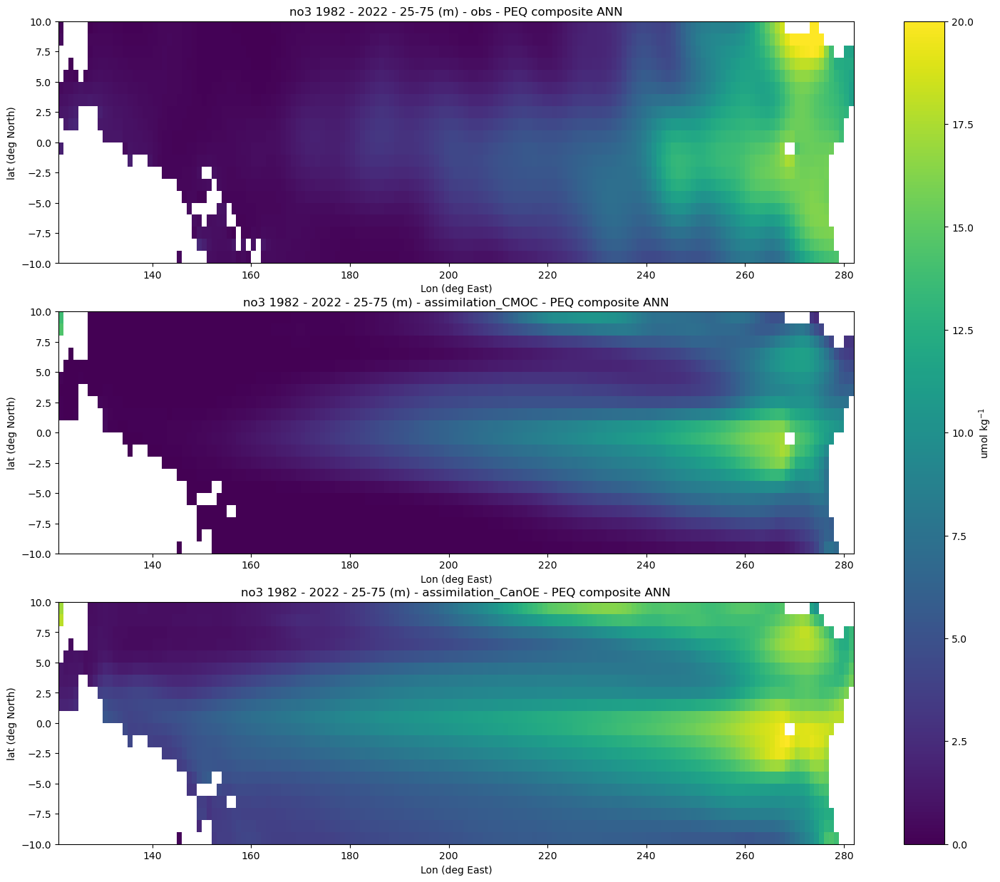

In [43]:

monthly_res = True
ds_list = ['obs', 'assimilation_CMOC', 'assimilation_CanOE']
figsize = (18,15)

lev_range = [25,75]
yeartoplot = list(dict_anom_snaps_clim_removed_no3['PEQ']['assimilation_CMOC'].year.values)
bms_label = 'PEQ'

ds_dicts = dict_profile_EQ_no3
title = f'no3 {y0_show} - {y1_show}'
lev_interp = ddata_em_after_no3['historical_CMOC'].lev

snapshot_arial(ds_list,
                            ds_dicts,
                            bms_label,
                            yeartoplot,
            title=title,
            figsize=figsize,
               vmin = 0,
               vmax = 20,
            # cmap = 'RdBu_r',
            colorbar_label = units_no3, 
            season = 'ANN',
            lev_range = lev_range,
            lev_interp = lev_interp,
            show=True)



JFM:[0, 1, 2]
AMJ:[3, 4, 5]
JAS:[6, 7, 8]
OND:[9, 10, 11]
ANN:[ 0  1  2  3  4  5  6  7  8  9 10 11]


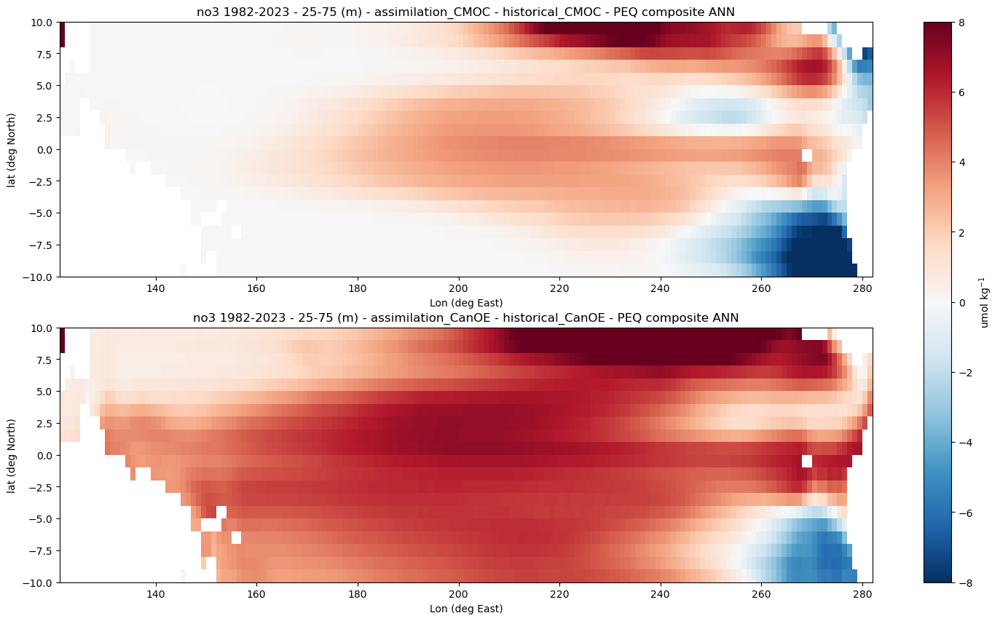

In [123]:

monthly_res = True
ds_list = ['assimilation_CMOC - historical_CMOC', 'assimilation_CanOE - historical_CanOE']
figsize = (18,10)

lev_range = [25,75]
yeartoplot = list(dict_anom_snaps_clim_removed_no3['PEQ']['assimilation_CMOC'].year.values)
bms_label = 'PEQ'

ds_dicts = dict_profile_EQ_no3_diff
title = f'no3 1982-2023'


snapshot_arial(ds_list,
                            ds_dicts,
                            bms_label,
                            yeartoplot,
            title=title,
            figsize=figsize,
               vmin = -8,
               vmax = 8,
            cmap = 'RdBu_r',
            colorbar_label = units_no3, 
            season = 'ANN',
            lev_range = lev_range,
            show=True)



JFM:[0, 1, 2]
AMJ:[3, 4, 5]
JAS:[6, 7, 8]
OND:[9, 10, 11]
ANN:[ 0  1  2  3  4  5  6  7  8  9 10 11]


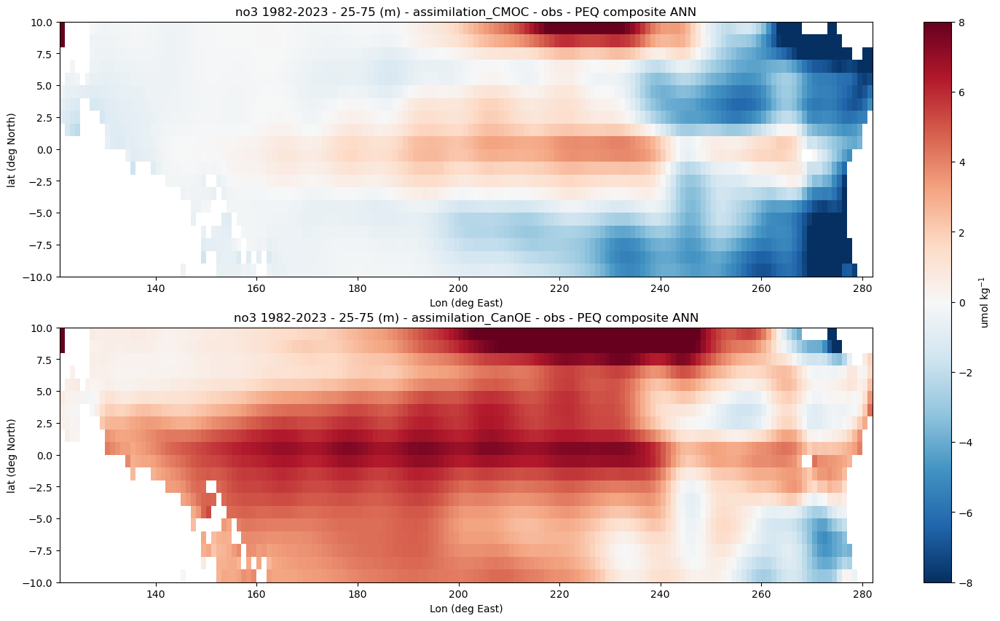

In [44]:

monthly_res = True
ds_list = ['assimilation_CMOC - obs', 'assimilation_CanOE - obs']
figsize = (18,10)

lev_range = [25,75]
yeartoplot = list(dict_anom_snaps_clim_removed_no3['PEQ']['assimilation_CMOC'].year.values)
bms_label = 'PEQ'

ds_dicts = dict_profile_EQ_no3_diff
title = f'no3 1982-2023'


snapshot_arial(ds_list,
                            ds_dicts,
                            bms_label,
                            yeartoplot,
            title=title,
            figsize=figsize,
               vmin = -8,
               vmax = 8,
            cmap = 'RdBu_r',
            colorbar_label = units_no3, 
            season = 'ANN',
            lev_range = lev_range,
            show=True)



##### depth

JFM:[0, 1, 2]
AMJ:[3, 4, 5]
JAS:[6, 7, 8]
OND:[9, 10, 11]
ANN:[ 0  1  2  3  4  5  6  7  8  9 10 11]


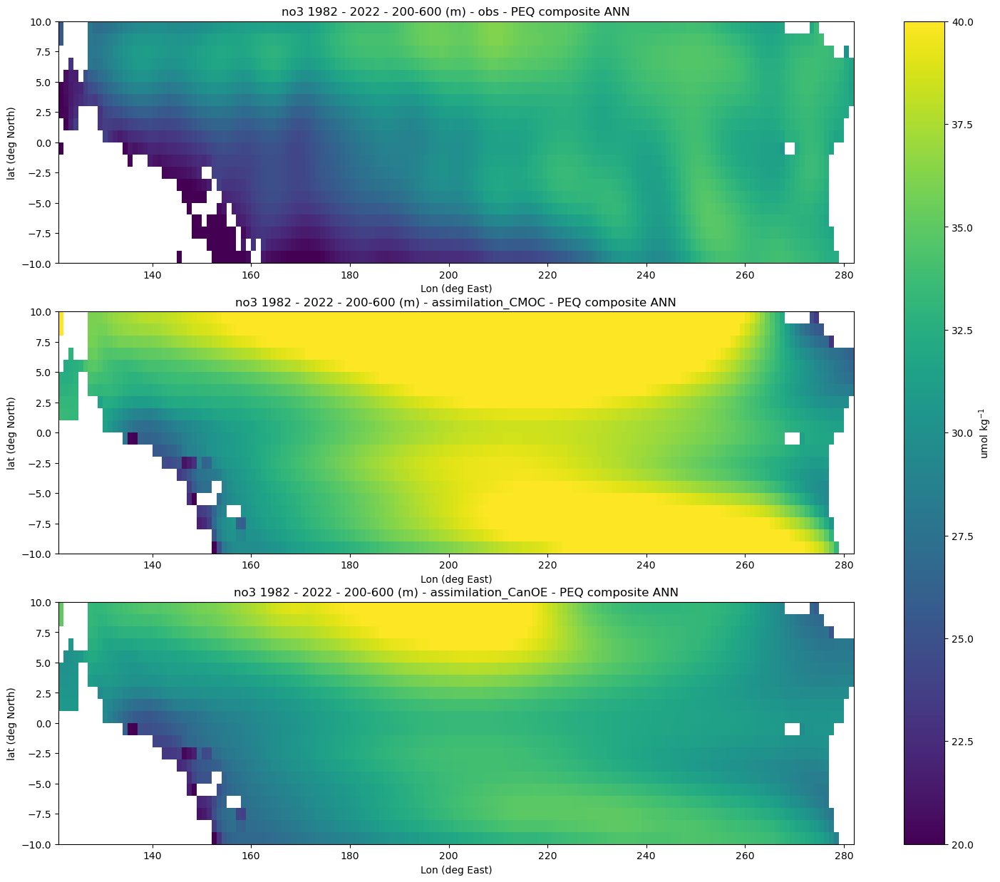

In [45]:

monthly_res = True
ds_list = ['obs', 'assimilation_CMOC', 'assimilation_CanOE']
figsize = (18,15)

lev_range = [200,600]
yeartoplot = list(dict_anom_snaps_clim_removed_no3['PEQ']['assimilation_CMOC'].year.values)
bms_label = 'PEQ'

ds_dicts = dict_profile_EQ_no3
title = f'no3 {y0_show} - {y1_show}'
lev_interp = ddata_em_after_no3['historical_CMOC'].lev

snapshot_arial(ds_list,
                            ds_dicts,
                            bms_label,
                            yeartoplot,
            title=title,
            figsize=figsize,
               vmin = 20,
               vmax = 40,
            # cmap = 'RdBu_r',
            colorbar_label = units_no3, 
            season = 'ANN',
            lev_range = lev_range,
            lev_interp = lev_interp,
            show=True)



JFM:[0, 1, 2]
AMJ:[3, 4, 5]
JAS:[6, 7, 8]
OND:[9, 10, 11]
ANN:[ 0  1  2  3  4  5  6  7  8  9 10 11]


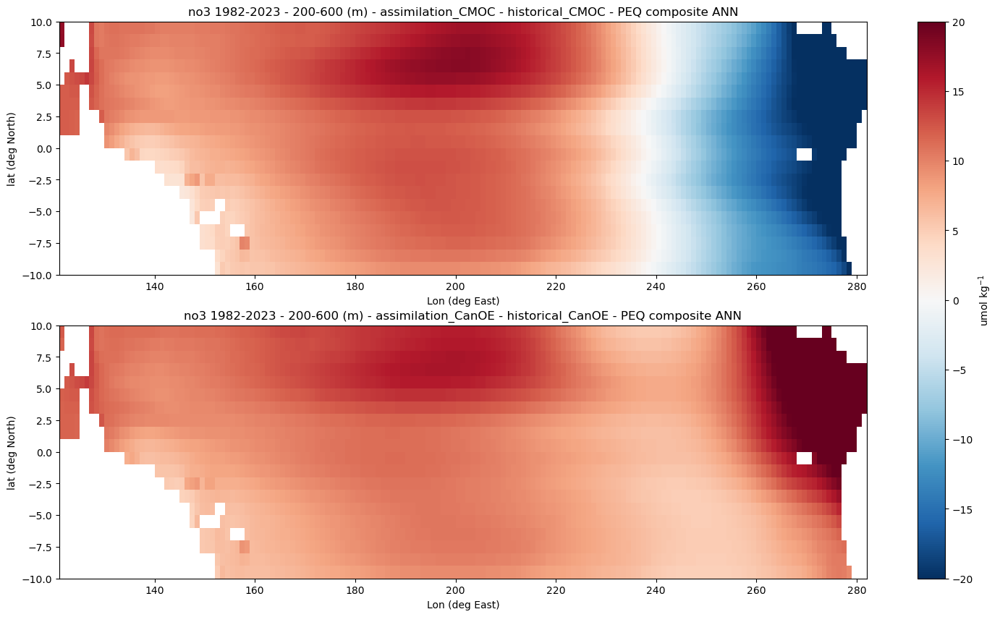

In [124]:

monthly_res = True
ds_list = ['assimilation_CMOC - historical_CMOC', 'assimilation_CanOE - historical_CanOE']
figsize = (18,10)

lev_range = [200,600]
yeartoplot = list(dict_anom_snaps_clim_removed_no3['PEQ']['assimilation_CMOC'].year.values)
bms_label = 'PEQ'

ds_dicts = dict_profile_EQ_no3_diff
title = f'no3 1982-2023'


snapshot_arial(ds_list,
                            ds_dicts,
                            bms_label,
                            yeartoplot,
            title=title,
            figsize=figsize,
               vmin = -20,
               vmax = 20,
            cmap = 'RdBu_r',
            colorbar_label = units_no3, 
            season = 'ANN',
            lev_range = lev_range,
            show=True)



JFM:[0, 1, 2]
AMJ:[3, 4, 5]
JAS:[6, 7, 8]
OND:[9, 10, 11]
ANN:[ 0  1  2  3  4  5  6  7  8  9 10 11]


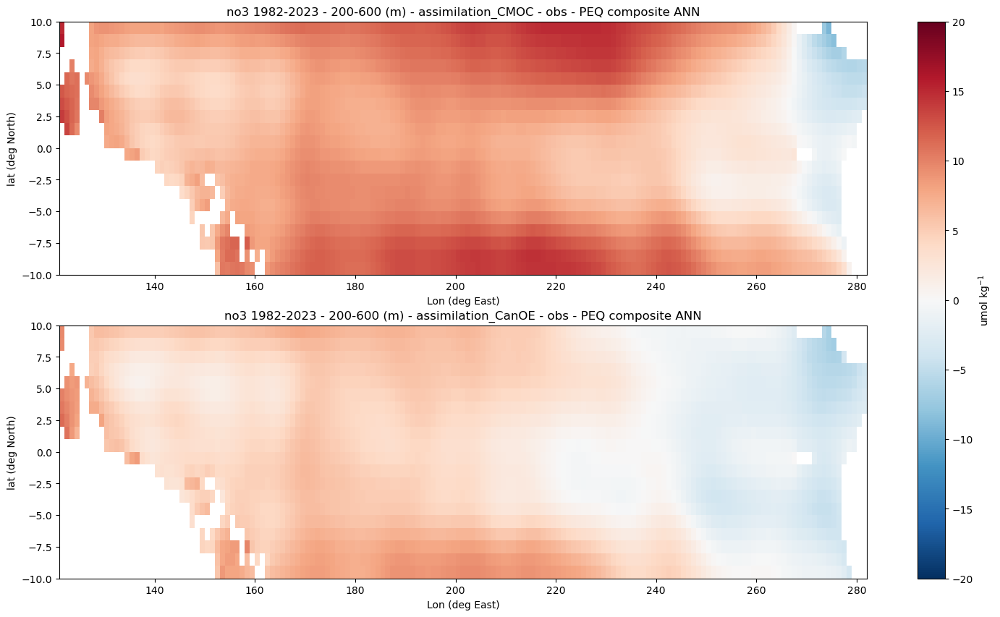

In [46]:

monthly_res = True
ds_list = ['assimilation_CMOC - obs', 'assimilation_CanOE - obs']
figsize = (18,10)

lev_range = [200,600]
yeartoplot = list(dict_anom_snaps_clim_removed_no3['PEQ']['assimilation_CMOC'].year.values)
bms_label = 'PEQ'

ds_dicts = dict_profile_EQ_no3_diff
title = f'no3 1982-2023'


snapshot_arial(ds_list,
                            ds_dicts,
                            bms_label,
                            yeartoplot,
            title=title,
            figsize=figsize,
               vmin = -20,
               vmax = 20,
            cmap = 'RdBu_r',
            colorbar_label = units_no3, 
            season = 'ANN',
            lev_range = lev_range,
            show=True)



## Cross section

In [ ]:

plt.pcolormesh(biomes.MeanBiomes.lon, biomes.MeanBiomes.lat, biomes.MeanBiomes.values)

PEQ = biomes.MeanBiomes.where((biomes.MeanBiomes.lat>= -10) & (biomes.MeanBiomes.lat <= 10))
PEQ = PEQ.where( (PEQ.lon <= -59) | (PEQ.lon >= 121))
PEQ = PEQ.where(np.isnan(PEQ), 1)

PEQ_E = PEQ.where(PEQ.lon<0)
PEQ_W = PEQ.where(PEQ.lon>0)

AEQ = biomes.MeanBiomes.where((biomes.MeanBiomes.lat>= -10) & (biomes.MeanBiomes.lat <= 10))
AEQ = AEQ.where( (AEQ.lon >= -55) & (AEQ.lon <= 20))
AEQ = AEQ.where(np.isnan(AEQ), 1)

plt.pcolormesh(PEQ.lon, PEQ.lat, PEQ.values)
plt.pcolormesh(AEQ.lon, AEQ.lat, AEQ.values)

mask_EQ = { 'PEQ' : PEQ.where(~np.isnan(PEQ),0), 'AEQ' : AEQ.where(~np.isnan(AEQ),0), 'PEQ_E' : PEQ_E.where(~np.isnan(PEQ_E),0), 'PEQ_W' : PEQ_W.where(~np.isnan(PEQ_W),0)}

In [ ]:

dict_profile_EQ = {}
dict_clim_mean_removed = {}
dict_anom_snaps_clim_removed = {}

for var in var_list:
    dict_profile_EQ[var] = {}
    dict_clim_mean_removed[var] = {}
    dict_anom_snaps_clim_removed[var] = {}

    for region in ['PEQ','AEQ']:
        dict_profile_EQ[var][region] = {}
        dict_clim_mean_removed[var][region] = {}
        dict_anom_snaps_clim_removed[var][region] = {}


        for ds in ['obs','historical_CMOC', 'historical_CanOE', 'assimilation_CanOE','assimilation_CMOC']:
            try:
                dict_profile_EQ[var][region][ds] = dict_profile_EQ_REF[var][region][ds].where(mask_EQ[region] == 1, drop = True)                  
                dict_clim_mean_removed[var][region][ds] = dict_clim_mean_removed_REF[var][region][ds].where(mask_EQ[region] == 1, drop = True)
                dict_anom_snaps_clim_removed[var][region][ds] = dict_anom_snaps_clim_removed_REF[var][region][ds].where(mask_EQ[region] == 1, drop = True)


                if region == 'PEQ':

                    dict_anom_snaps_clim_removed[var][region][ds]['lon'] = np.mod(dict_anom_snaps_clim_removed[var][region][ds]['lon'] + 360,360)
                    dict_anom_snaps_clim_removed[var][region][ds] = dict_anom_snaps_clim_removed[var][region][ds].sortby('lon')
            except:
                print(f'{ds} for {var} non-existent!')




In [ ]:
data_dicts_LANI = {}
data_dicts_ELNI = {}

for var in var_list:

    data_dicts_LANI[var] = {}
    data_dicts_ELNI[var] = {}

    for bm in dict_anom_snaps_clim_removed[var].keys():
        data_dicts_LANI[var][bm] = {}
        data_dicts_ELNI[var][bm] = {}


        for ds in dict_anom_snaps_clim_removed[var][bm].keys():
            if 'historical' in ds:
                data_dicts_LANI[var][bm][ds] = dict_anom_snaps_clim_removed[var][bm][ds].where(ONI_sim<=np.quantile(ONI_sim,0.25))
                data_dicts_ELNI[var][bm][ds] = dict_anom_snaps_clim_removed[var][bm][ds].where(ONI_sim>=np.quantile(ONI_sim,0.75))
            
            else:
                data_dicts_LANI[var][bm][ds] = dict_anom_snaps_clim_removed[var][bm][ds].where(ONI_assim<=np.quantile(ONI_assim,0.25))
                data_dicts_ELNI[var][bm][ds] = dict_anom_snaps_clim_removed[var][bm][ds].where(ONI_assim>=np.quantile(ONI_assim,0.75))

data_dicts_diff = {}

for var in var_list:
    data_dicts_diff[var] = {}

    for bm in dict_anom_snaps_clim_removed[var].keys():
        data_dicts_diff[var][bm] = {}
        for ds in dict_anom_snaps_clim_removed[var][bm].keys():
                data_dicts_diff[var][bm][ds] = (data_dicts_LANI[var][bm][ds].mean('year') - data_dicts_ELNI[var][bm][ds].mean('year')).expand_dims('year', axis = 0).assign_coords(year = ['diff'])
 

In [ ]:
for var in var_list:
    for region in ['PEQ', 'AEQ']:
        for ds in ['obs','historical_CMOC', 'historical_CanOE', 'assimilation_CanOE','assimilation_CMOC']:
            try:
                dict_profile_EQ[var][region][ds]['lon'] = np.mod(dict_profile_EQ[var][region][ds]['lon'] + 360,360)
                dict_profile_EQ[var][region][ds] = dict_profile_EQ[var][region][ds].sortby('lon')
            except:
                print(f'{ds} for {var} non-existent!')


dict_profile_EQ_diff = {}
for var in var_list:
    dict_profile_EQ_diff[var] = {}
    for region in ['PEQ', 'AEQ']:
        dict_profile_EQ_diff[var][region] = {}

        dict_profile_EQ_diff[var][region]['assimilation_CMOC - historical_CMOC'] = dict_profile_EQ[var][region]['assimilation_CMOC'] - dict_profile_EQ[var][region]['historical_CMOC']
        dict_profile_EQ_diff[var][region]['assimilation_CanOE - historical_CanOE'] = dict_profile_EQ[var][region]['assimilation_CanOE'] - dict_profile_EQ[var][region]['historical_CanOE']

        try:

            dict_profile_EQ_diff[var][region]['assimilation_CMOC - obs'] = dict_profile_EQ[var][region]['assimilation_CMOC'] - dict_profile_EQ[var][region]['obs']
            dict_profile_EQ_diff[var][region]['historical_CMOC - obs'] = dict_profile_EQ[var][region]['historical_CMOC'] - dict_profile_EQ[var][region]['obs']
            dict_profile_EQ_diff[var][region]['assimilation_CanOE - obs'] = dict_profile_EQ[var][region]['assimilation_CanOE'] - dict_profile_EQ[var][region]['obs']
            dict_profile_EQ_diff[var][region]['historical_CanOE - obs'] = dict_profile_EQ[var][region]['historical_CanOE'] - dict_profile_EQ[var][region]['obs']
        except:
            print(f'obs for {var} non-existent!')


### NO3

JFM:[0, 1, 2]
AMJ:[3, 4, 5]
JAS:[6, 7, 8]
OND:[9, 10, 11]
ANN:[ 0  1  2  3  4  5  6  7  8  9 10 11]
JFM:[0, 1, 2]
AMJ:[3, 4, 5]
JAS:[6, 7, 8]
OND:[9, 10, 11]
ANN:[ 0  1  2  3  4  5  6  7  8  9 10 11]
JFM:[0, 1, 2]
AMJ:[3, 4, 5]
JAS:[6, 7, 8]
OND:[9, 10, 11]
ANN:[ 0  1  2  3  4  5  6  7  8  9 10 11]


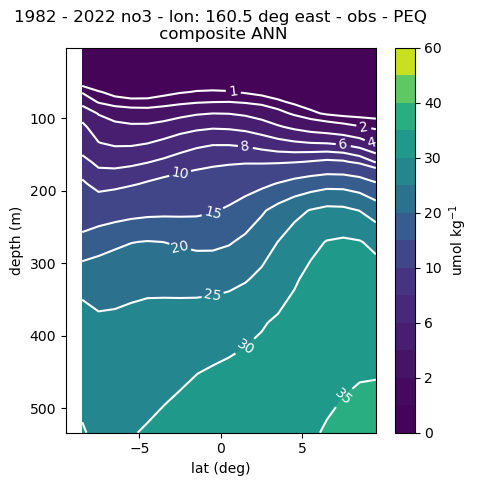

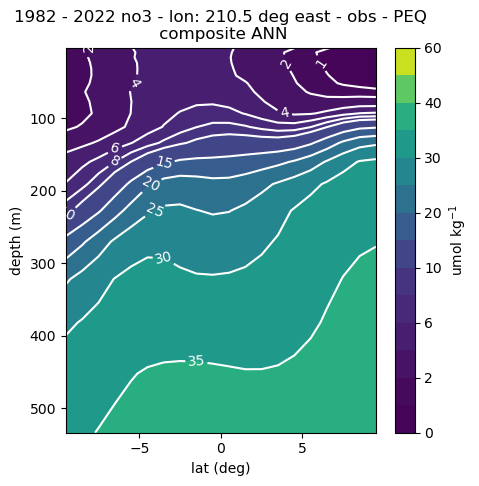

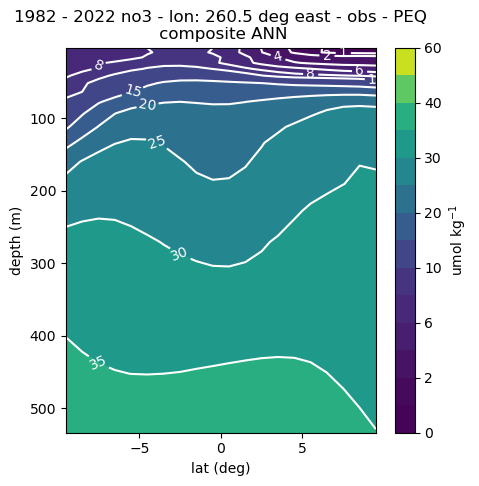

In [47]:
monthly_res = True
ds_list = ['obs']
figsize = (5,5)

lev_range = 600
yeartoplot = list(dict_anom_snaps_clim_removed_no3['PEQ']['assimilation_CMOC'].year.values)
bms_label = 'PEQ'

plot_dict = {}
plot_dict['no3'] = dict(dict = dict_profile_EQ_no3, unit =  units_no3, contour_levels =[0, 1,2,4,6, 8,10,15,20,25,30,35,40,50,60] )
var = 'no3'
ds_dicts = plot_dict[var]['dict']
title = f'{y0_show} - {y1_show} {var}'
units = plot_dict[var]['unit']
contour_levels = plot_dict[var]['contour_levels']
lev_interp = ddata_em_after_no3['historical_CMOC'].lev

for lon in [160,210,260]:
    snapshot_crossection(ds_list,
                                ds_dicts,
                                bms_label,
                                yeartoplot,
                                longitude=lon,
                title=title,
                figsize=figsize,
                # cmap = 'RdBu_r',
                colorbar_label = units, 
                contour_levels = contour_levels,
                season = 'ANN',
                lev_range = lev_range,
                lev_interp = lev_interp,
                show=True)



JFM:[0, 1, 2]
AMJ:[3, 4, 5]
JAS:[6, 7, 8]
OND:[9, 10, 11]
ANN:[ 0  1  2  3  4  5  6  7  8  9 10 11]


JFM:[0, 1, 2]
AMJ:[3, 4, 5]
JAS:[6, 7, 8]
OND:[9, 10, 11]
ANN:[ 0  1  2  3  4  5  6  7  8  9 10 11]
JFM:[0, 1, 2]
AMJ:[3, 4, 5]
JAS:[6, 7, 8]
OND:[9, 10, 11]
ANN:[ 0  1  2  3  4  5  6  7  8  9 10 11]


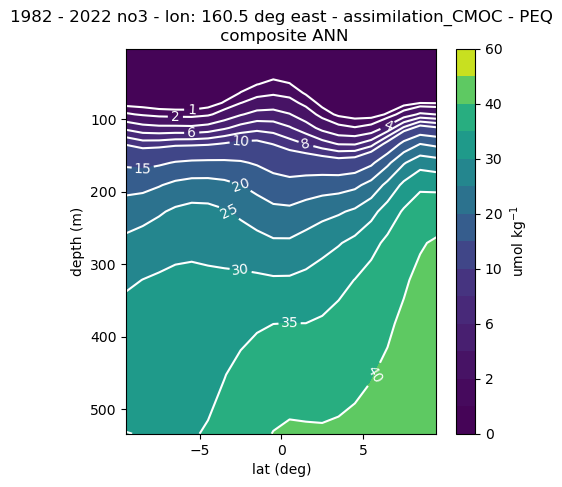

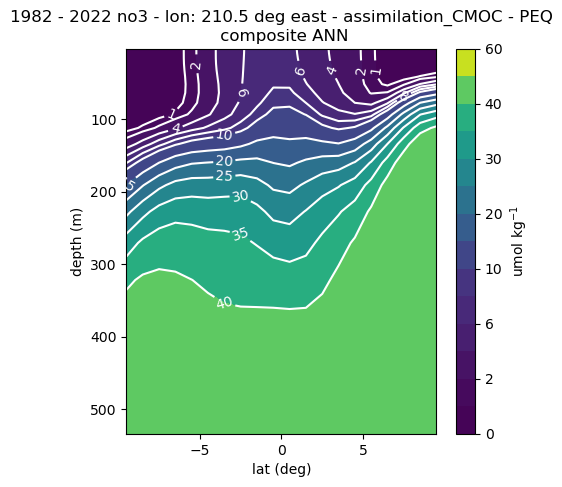

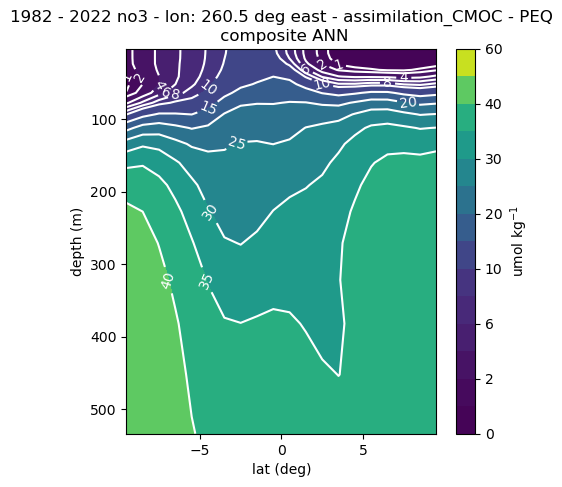

In [140]:
monthly_res = True
ds_list = ['assimilation_CMOC']
figsize = (5,5)

lev_range = 600
yeartoplot = list(dict_anom_snaps_clim_removed_no3['PEQ']['assimilation_CMOC'].year.values)
bms_label = 'PEQ'

plot_dict = {}
plot_dict['no3'] = dict(dict = dict_profile_EQ_no3, unit =  units_no3, contour_levels =[0, 1,2,4,6, 8,10,15,20,25,30,35,40,50,60] )
var = 'no3'
ds_dicts = plot_dict[var]['dict']
title = f'{y0_show} - {y1_show} {var}'
units = plot_dict[var]['unit']
contour_levels = plot_dict[var]['contour_levels']

for lon in [160,210,260]:
    snapshot_crossection(ds_list,
                                ds_dicts,
                                bms_label,
                                yeartoplot,
                                longitude=lon,
                title=title,
                figsize=figsize,
                # cmap = 'RdBu_r',
                colorbar_label = units, 
                contour_levels = contour_levels,
                season = 'ANN',
                lev_range = lev_range,
                show=True)



JFM:[0, 1, 2]
AMJ:[3, 4, 5]
JAS:[6, 7, 8]
OND:[9, 10, 11]
ANN:[ 0  1  2  3  4  5  6  7  8  9 10 11]


JFM:[0, 1, 2]
AMJ:[3, 4, 5]
JAS:[6, 7, 8]
OND:[9, 10, 11]
ANN:[ 0  1  2  3  4  5  6  7  8  9 10 11]
JFM:[0, 1, 2]
AMJ:[3, 4, 5]
JAS:[6, 7, 8]
OND:[9, 10, 11]
ANN:[ 0  1  2  3  4  5  6  7  8  9 10 11]


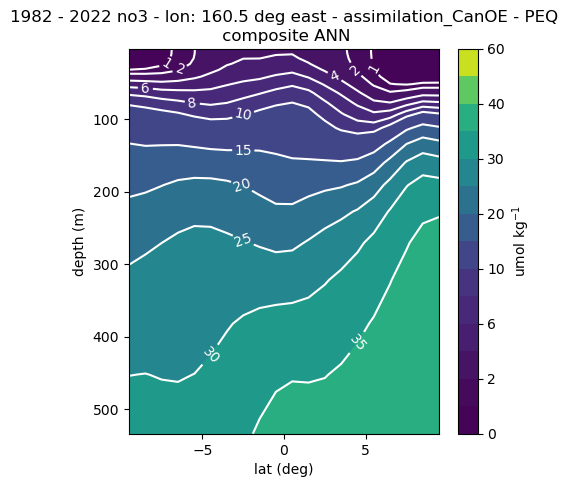

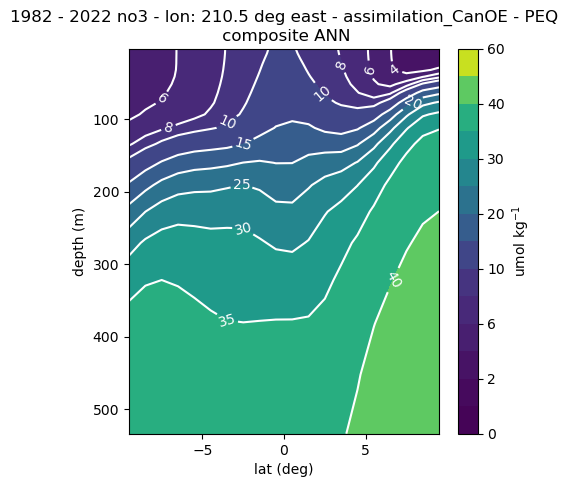

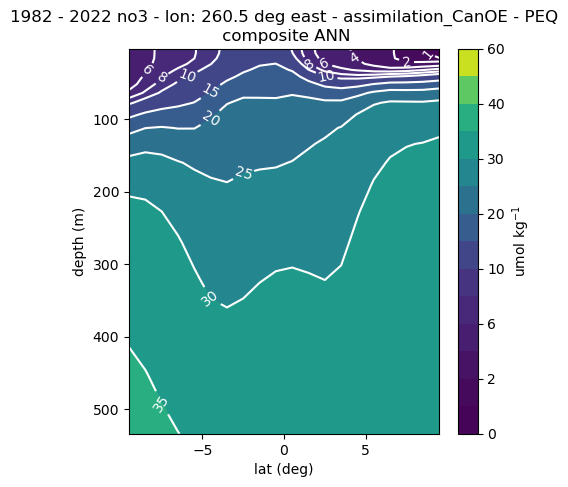

In [141]:
monthly_res = True
ds_list = ['assimilation_CanOE']
figsize = (5,5)

lev_range = 600
yeartoplot = list(dict_anom_snaps_clim_removed_no3['PEQ']['assimilation_CMOC'].year.values)
bms_label = 'PEQ'

plot_dict = {}
plot_dict['no3'] = dict(dict = dict_profile_EQ_no3, unit =  units_no3, contour_levels =[0, 1,2,4,6, 8,10,15,20,25,30,35,40,50,60] )
var = 'no3'
ds_dicts = plot_dict[var]['dict']
title = f'{y0_show} - {y1_show} {var}'
units = plot_dict[var]['unit']
contour_levels = plot_dict[var]['contour_levels']

for lon in [160,210,260]:
    snapshot_crossection(ds_list,
                                ds_dicts,
                                bms_label,
                                yeartoplot,
                                longitude=lon,
                title=title,
                figsize=figsize,
                # cmap = 'RdBu_r',
                colorbar_label = units, 
                contour_levels = contour_levels,
                season = 'ANN',
                lev_range = lev_range,
                show=True)



JFM:[0, 1, 2]
AMJ:[3, 4, 5]
JAS:[6, 7, 8]
OND:[9, 10, 11]
ANN:[ 0  1  2  3  4  5  6  7  8  9 10 11]
JFM:[0, 1, 2]
AMJ:[3, 4, 5]
JAS:[6, 7, 8]
OND:[9, 10, 11]
ANN:[ 0  1  2  3  4  5  6  7  8  9 10 11]
JFM:[0, 1, 2]
AMJ:[3, 4, 5]
JAS:[6, 7, 8]
OND:[9, 10, 11]
ANN:[ 0  1  2  3  4  5  6  7  8  9 10 11]


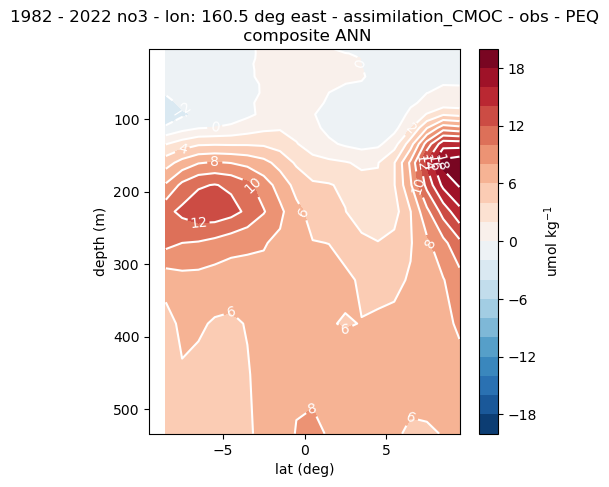

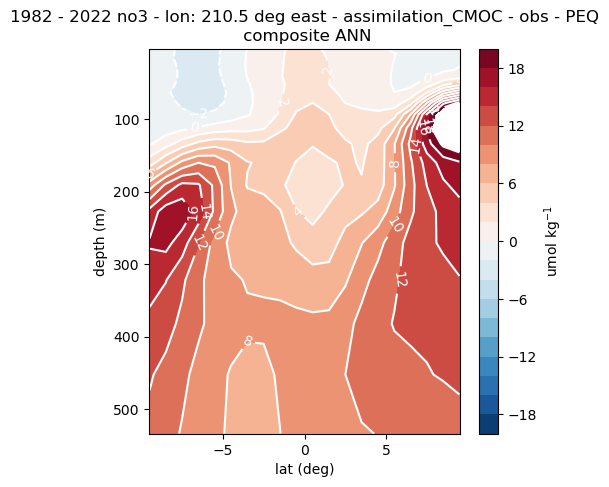

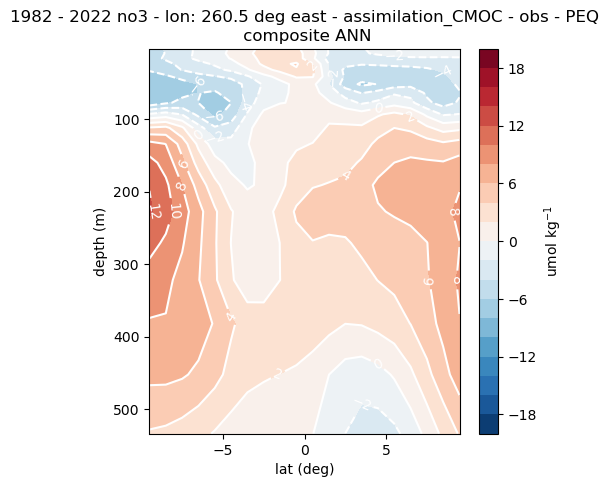

In [50]:
monthly_res = True
ds_list = ['assimilation_CMOC - obs']
figsize = (5,5)

lev_range = 600
yeartoplot = list(dict_anom_snaps_clim_removed_no3['PEQ']['assimilation_CMOC'].year.values)
bms_label = 'PEQ'

plot_dict = {}
plot_dict['no3'] = dict(dict = dict_profile_EQ_no3_diff, unit =  units_no3, contour_levels = np.arange(-20,22,2) )
var = 'no3'
ds_dicts = plot_dict[var]['dict']
title = f'{y0_show} - {y1_show} {var}'
units = plot_dict[var]['unit']
contour_levels = plot_dict[var]['contour_levels']

for lon in [160,210,260]:
    snapshot_crossection(ds_list,
                                ds_dicts,
                                bms_label,
                                yeartoplot,
                                longitude=lon,
                title=title,
                figsize=figsize,
                cmap = 'RdBu_r',
                colorbar_label = units, 
                contour_levels = contour_levels,
                season = 'ANN',
                lev_range = lev_range,
                show=True)



JFM:[0, 1, 2]
AMJ:[3, 4, 5]
JAS:[6, 7, 8]
OND:[9, 10, 11]
ANN:[ 0  1  2  3  4  5  6  7  8  9 10 11]
JFM:[0, 1, 2]
AMJ:[3, 4, 5]
JAS:[6, 7, 8]
OND:[9, 10, 11]
ANN:[ 0  1  2  3  4  5  6  7  8  9 10 11]
JFM:[0, 1, 2]
AMJ:[3, 4, 5]
JAS:[6, 7, 8]
OND:[9, 10, 11]
ANN:[ 0  1  2  3  4  5  6  7  8  9 10 11]


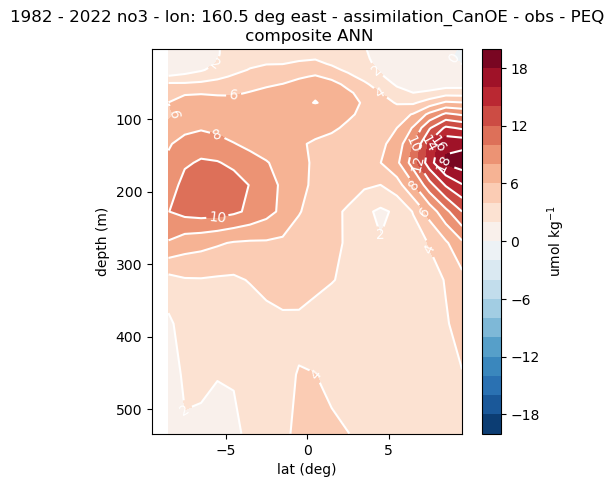

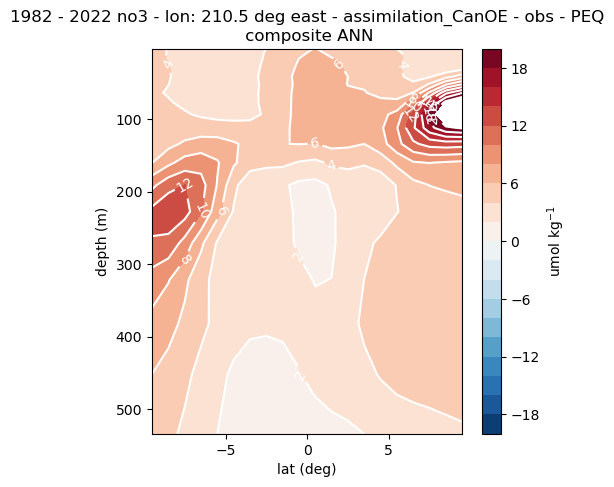

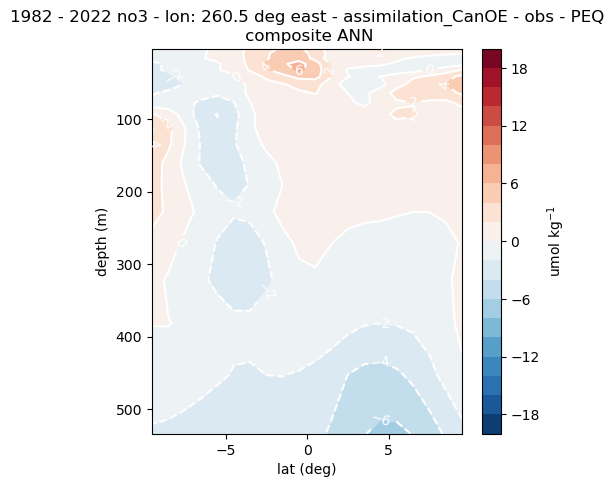

In [49]:
monthly_res = True
ds_list = ['assimilation_CanOE - obs']
figsize = (5,5)

lev_range = 600
yeartoplot = list(dict_anom_snaps_clim_removed_no3['PEQ']['assimilation_CMOC'].year.values)
bms_label = 'PEQ'

plot_dict = {}
plot_dict['no3'] = dict(dict = dict_profile_EQ_no3_diff, unit =  units_no3, contour_levels = np.arange(-20,22,2) )
var = 'no3'
ds_dicts = plot_dict[var]['dict']
title = f'{y0_show} - {y1_show} {var}'
units = plot_dict[var]['unit']
contour_levels = plot_dict[var]['contour_levels']

for lon in [160,210,260]:
    snapshot_crossection(ds_list,
                                ds_dicts,
                                bms_label,
                                yeartoplot,
                                longitude=lon,
                title=title,
                figsize=figsize,
                cmap = 'RdBu_r',
                colorbar_label = units, 
                contour_levels = contour_levels,
                season = 'ANN',
                lev_range = lev_range,
                show=True)



JFM:[0, 1, 2]
AMJ:[3, 4, 5]
JAS:[6, 7, 8]
OND:[9, 10, 11]
ANN:[ 0  1  2  3  4  5  6  7  8  9 10 11]
JFM:[0, 1, 2]
AMJ:[3, 4, 5]
JAS:[6, 7, 8]
OND:[9, 10, 11]
ANN:[ 0  1  2  3  4  5  6  7  8  9 10 11]


JFM:[0, 1, 2]
AMJ:[3, 4, 5]
JAS:[6, 7, 8]
OND:[9, 10, 11]
ANN:[ 0  1  2  3  4  5  6  7  8  9 10 11]


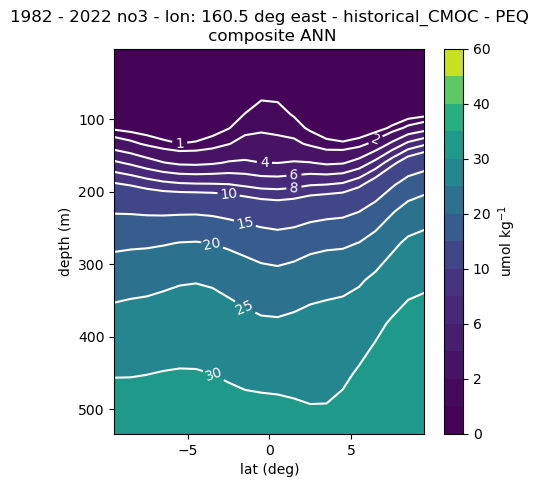

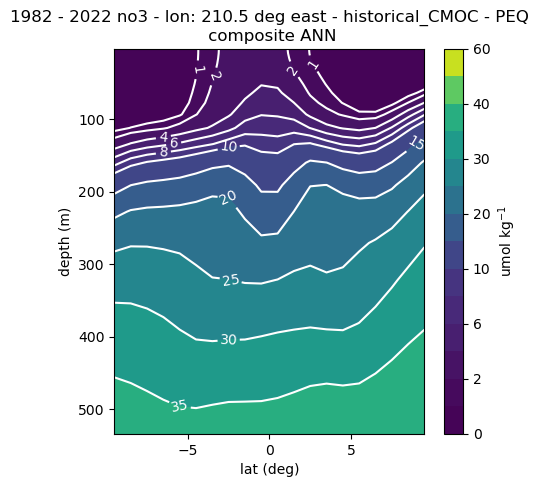

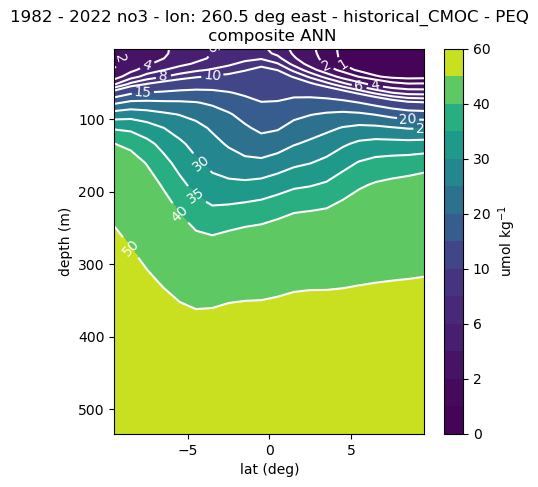

In [142]:
monthly_res = True
ds_list = ['historical_CMOC']
figsize = (5,5)

lev_range = 600
yeartoplot = list(dict_anom_snaps_clim_removed_no3['PEQ']['assimilation_CMOC'].year.values)
bms_label = 'PEQ'

plot_dict = {}
plot_dict['no3'] = dict(dict = dict_profile_EQ_no3, unit =  units_no3, contour_levels =[0, 1,2,4,6, 8,10,15,20,25,30,35,40,50,60] )
var = 'no3'
ds_dicts = plot_dict[var]['dict']
title = f'{y0_show} - {y1_show} {var}'
units = plot_dict[var]['unit']
contour_levels = plot_dict[var]['contour_levels']

for lon in [160,210,260]:
    snapshot_crossection(ds_list,
                                ds_dicts,
                                bms_label,
                                yeartoplot,
                                longitude=lon,
                title=title,
                figsize=figsize,
                # cmap = 'RdBu_r',
                colorbar_label = units, 
                contour_levels = contour_levels,
                season = 'ANN',
                lev_range = lev_range,
                show=True)



JFM:[0, 1, 2]
AMJ:[3, 4, 5]
JAS:[6, 7, 8]
OND:[9, 10, 11]
ANN:[ 0  1  2  3  4  5  6  7  8  9 10 11]


JFM:[0, 1, 2]
AMJ:[3, 4, 5]
JAS:[6, 7, 8]
OND:[9, 10, 11]
ANN:[ 0  1  2  3  4  5  6  7  8  9 10 11]
JFM:[0, 1, 2]
AMJ:[3, 4, 5]
JAS:[6, 7, 8]
OND:[9, 10, 11]
ANN:[ 0  1  2  3  4  5  6  7  8  9 10 11]


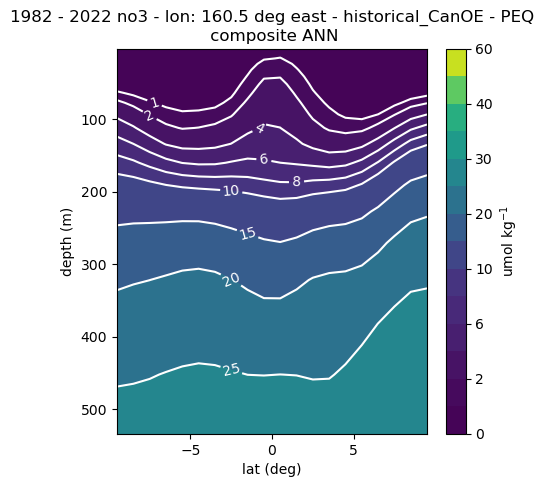

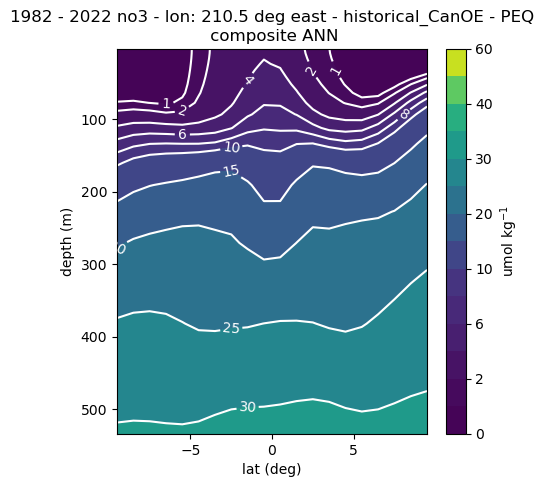

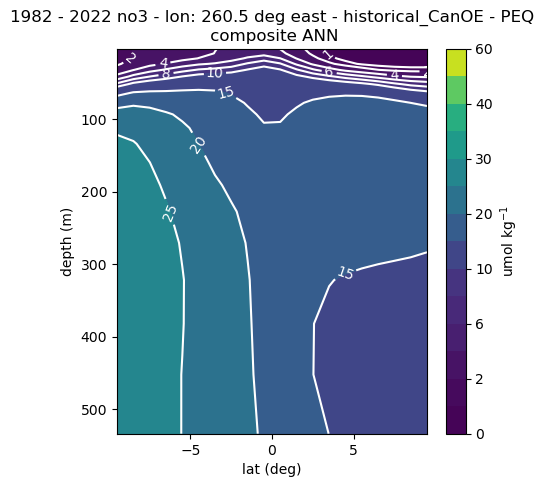

In [143]:
monthly_res = True
ds_list = ['historical_CanOE']
figsize = (5,5)

lev_range = 600
yeartoplot = list(dict_anom_snaps_clim_removed_no3['PEQ']['assimilation_CMOC'].year.values)
bms_label = 'PEQ'

plot_dict = {}
plot_dict['no3'] = dict(dict = dict_profile_EQ_no3, unit =  units_no3, contour_levels =[0, 1,2,4,6, 8,10,15,20,25,30,35,40,50,60] )
var = 'no3'
ds_dicts = plot_dict[var]['dict']
title = f'{y0_show} - {y1_show} {var}'
units = plot_dict[var]['unit']
contour_levels = plot_dict[var]['contour_levels']

for lon in [160,210,260]:
    snapshot_crossection(ds_list,
                                ds_dicts,
                                bms_label,
                                yeartoplot,
                                longitude=lon,
                title=title,
                figsize=figsize,
                # cmap = 'RdBu_r',
                colorbar_label = units, 
                contour_levels = contour_levels,
                season = 'ANN',
                lev_range = lev_range,
                show=True)



JFM:[0, 1, 2]
AMJ:[3, 4, 5]
JAS:[6, 7, 8]
OND:[9, 10, 11]
ANN:[ 0  1  2  3  4  5  6  7  8  9 10 11]
JFM:[0, 1, 2]
AMJ:[3, 4, 5]
JAS:[6, 7, 8]
OND:[9, 10, 11]
ANN:[ 0  1  2  3  4  5  6  7  8  9 10 11]
JFM:[0, 1, 2]
AMJ:[3, 4, 5]
JAS:[6, 7, 8]
OND:[9, 10, 11]
ANN:[ 0  1  2  3  4  5  6  7  8  9 10 11]


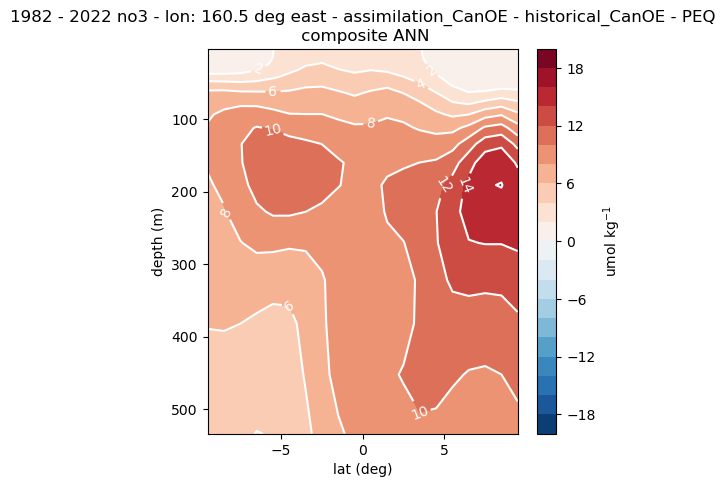

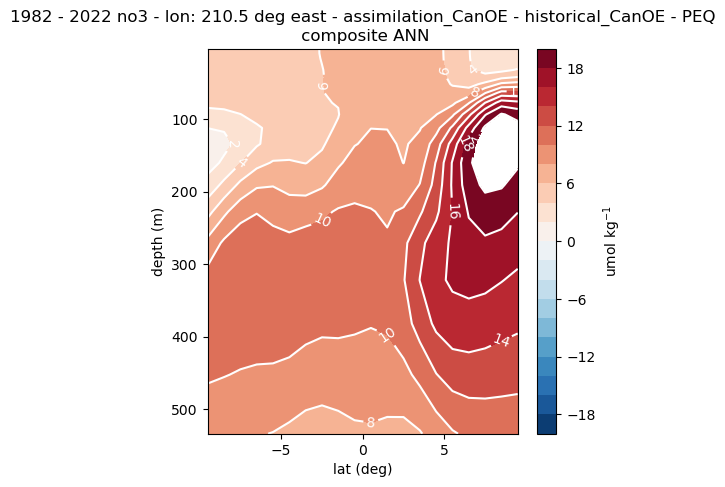

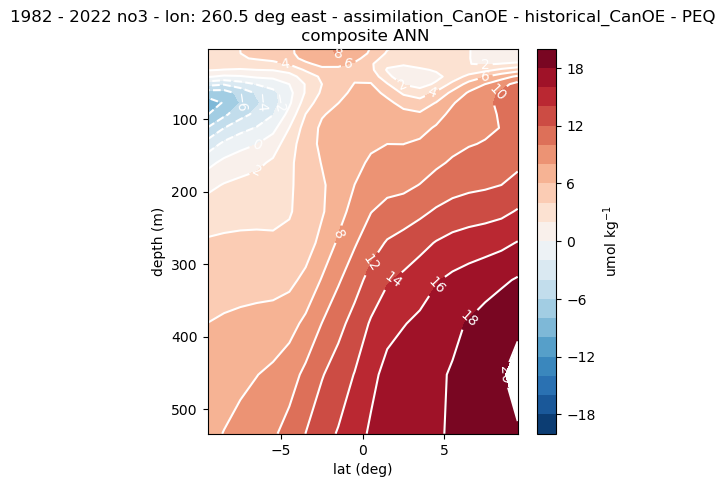

In [138]:
monthly_res = True
ds_list = ['assimilation_CanOE - historical_CanOE']
figsize = (5,5)

lev_range = 600
yeartoplot = list(dict_anom_snaps_clim_removed_no3['PEQ']['assimilation_CMOC'].year.values)
bms_label = 'PEQ'

plot_dict = {}
plot_dict['no3'] = dict(dict = dict_profile_EQ_no3_diff, unit =  units_no3, contour_levels = np.arange(-20,22,2) )
var = 'no3'
ds_dicts = plot_dict[var]['dict']
title = f'{y0_show} - {y1_show} {var}'
units = plot_dict[var]['unit']
contour_levels = plot_dict[var]['contour_levels']

for lon in [160,210,260]:
    snapshot_crossection(ds_list,
                                ds_dicts,
                                bms_label,
                                yeartoplot,
                                longitude=lon,
                title=title,
                figsize=figsize,
                cmap = 'RdBu_r',
                colorbar_label = units, 
                contour_levels = contour_levels,
                season = 'ANN',
                lev_range = lev_range,
                show=True)



JFM:[0, 1, 2]
AMJ:[3, 4, 5]
JAS:[6, 7, 8]
OND:[9, 10, 11]
ANN:[ 0  1  2  3  4  5  6  7  8  9 10 11]


JFM:[0, 1, 2]
AMJ:[3, 4, 5]
JAS:[6, 7, 8]
OND:[9, 10, 11]
ANN:[ 0  1  2  3  4  5  6  7  8  9 10 11]
JFM:[0, 1, 2]
AMJ:[3, 4, 5]
JAS:[6, 7, 8]
OND:[9, 10, 11]
ANN:[ 0  1  2  3  4  5  6  7  8  9 10 11]


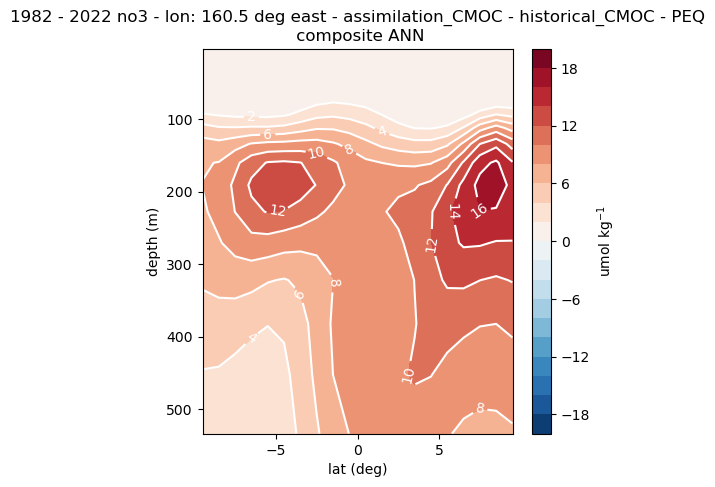

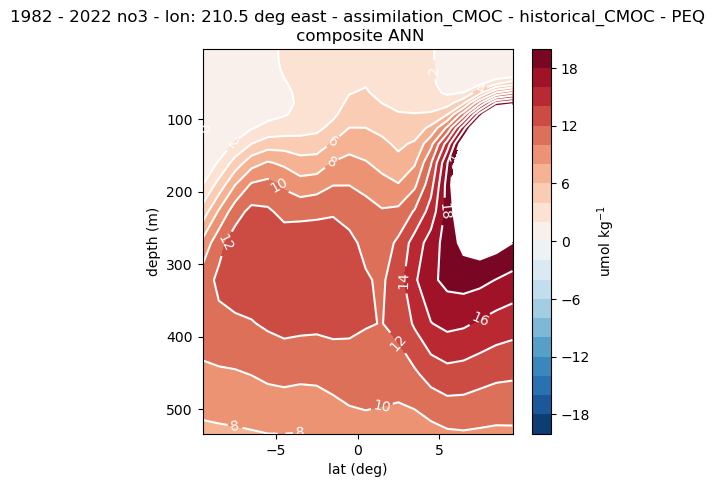

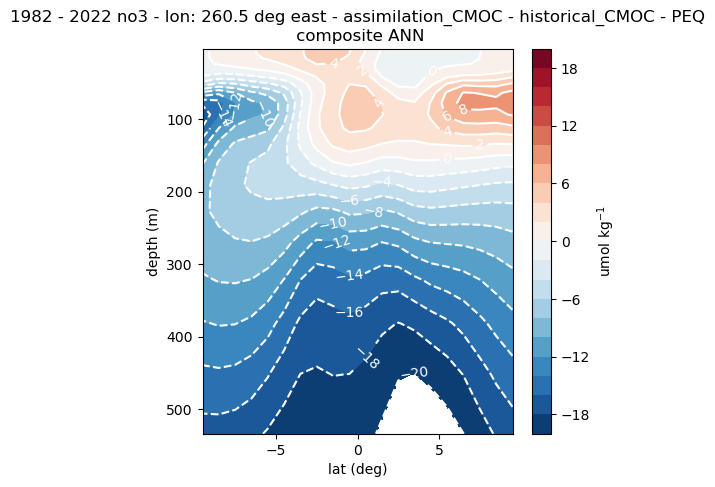

In [139]:
monthly_res = True
ds_list = ['assimilation_CMOC - historical_CMOC']
figsize = (5,5)

lev_range = 600
yeartoplot = list(dict_anom_snaps_clim_removed_no3['PEQ']['assimilation_CMOC'].year.values)
bms_label = 'PEQ'

plot_dict = {}
plot_dict['no3'] = dict(dict = dict_profile_EQ_no3_diff, unit =  units_no3, contour_levels =np.arange(-20,22,2) )
var = 'no3'
ds_dicts = plot_dict[var]['dict']
title = f'{y0_show} - {y1_show} {var}'
units = plot_dict[var]['unit']
contour_levels = plot_dict[var]['contour_levels']

for lon in [160,210,260]:
    snapshot_crossection(ds_list,
                                ds_dicts,
                                bms_label,
                                yeartoplot,
                                longitude=lon,
                title=title,
                figsize=figsize,
                cmap = 'RdBu_r',
                colorbar_label = units, 
                contour_levels = contour_levels,
                season = 'ANN',
                lev_range = lev_range,
                show=True)

